# Load Packages

In [ ]:
# !pip install keras-tuner
# !pip install --upgrade scipy
# !pip install --upgrade tensorflow
# !pip install pandas statsmodels skforecast
! pip install tensorflow==2.16.0rc0


  Using cached absl_py-2.1.0-py3-none-any.whl.metadata (2.3 kB)
  Using cached astunparse-1.6.3-py2.py3-none-any.whl.metadata (4.4 kB)
  Using cached flatbuffers-24.3.25-py2.py3-none-any.whl.metadata (850 bytes)
  Using cached gast-0.6.0-py3-none-any.whl.metadata (1.3 kB)
  Using cached google_pasta-0.2.0-py3-none-any.whl.metadata (814 bytes)
  Using cached libclang-18.1.1-py2.py3-none-macosx_10_9_x86_64.whl.metadata (5.2 kB)
  Using cached opt_einsum-3.3.0-py3-none-any.whl.metadata (6.5 kB)
  Using cached termcolor-2.4.0-py3-none-any.whl.metadata (6.1 kB)
  Using cached tensorboard-2.16.2-py3-none-any.whl.metadata (1.6 kB)
  Using cached keras-3.5.0-py3-none-any.whl.metadata (5.8 kB)
  Using cached namex-0.0.8-py3-none-any.whl.metadata (246 bytes)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.8/47.8 kB 999.9 kB/s eta 0:00:00 0:00:01
  Using cached tensorboard_data_server-0.7.2-py3-none-macosx_10_9_x86_64.whl.metadata (1.1 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.7/259.7 M

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from scipy import stats
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, precision_score, recall_score, f1_score
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler, RobustScaler
from sktime.forecasting.model_selection import temporal_train_test_split, ForecastingRandomizedSearchCV
from sktime.forecasting.base import ForecastingHorizon
from sktime.forecasting.compose import make_reduction, TransformedTargetForecaster
from sktime.utils.plotting import plot_series
from sktime.performance_metrics.forecasting import mean_absolute_percentage_error
from sktime.transformations.series.detrend import Deseasonalizer, Detrender
from sktime.forecasting.trend import PolynomialTrendForecaster
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, BatchNormalization
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from sklearn.model_selection import TimeSeriesSplit
import keras_tuner as kt
from xgboost import XGBRegressor
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tools.eval_measures import rmse
from pmdarima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX
from tabulate import tabulate
import warnings

warnings.filterwarnings("ignore")

ModuleNotFoundError: No module named 'sktime'

# Load Data For Each Country

## Kiribati

In [ ]:
# Read the data files for Kiribati
kiribati = pd.read_csv('data/Kiribati/Kiribati.csv')
kiribati_water_temp = pd.read_csv('data/Kiribati/Kiribati Water Temp.csv')
kiribati_air_temp = pd.read_csv('data/Kiribati/Kiribati Air Temp.csv')
kiribati_bar_pressure = pd.read_csv('data/Kiribati/Kiribati Barometric Pressure.csv')

# Add the "Country" column to each data frame
kiribati.insert(0, "Country", "Kiribati")
kiribati_water_temp.insert(0, "Country", "Kiribati")
kiribati_air_temp.insert(0, "Country", "Kiribati")
kiribati_bar_pressure.insert(0, "Country", "Kiribati")

# Rename the Maximum, Minimum, and St Devn columns to keep them distinct
kiribati = kiribati.rename(columns={
    'Maximum': 'Sea_Level_Maximum',
    'Minimum': 'Sea_Level_Minimum',
    'Mean': 'Sea_Level_Mean',
    'St Devn': 'Sea_Level_St_Devn'
})
kiribati_bar_pressure = kiribati_bar_pressure.rename(columns={
    'Maximum': 'Pressure_Maximum',
    'Minimum': 'Pressure_Minimum',
    'Mean': 'Pressure_Mean',
    'St Devn': 'Pressure_St_Devn'
})
kiribati_water_temp = kiribati_water_temp.rename(columns={
    'Maximum': 'WaterTemp_Maximum',
    'Minimum': 'WaterTemp_Minimum',
    'Mean': 'WaterTemp_Mean',
    'St Devn': 'WaterTemp_St_Devn'
})
kiribati_air_temp = kiribati_air_temp.rename(columns={
    'Maximum': 'AirTemp_Maximum',
    'Minimum': 'AirTemp_Minimum',
    'Mean': 'AirTemp_Mean',
    'St Devn': 'AirTemp_St_Devn'
})

# Drop repeated columns and columns that will not be used
kiribati.drop(columns=['Gaps', 'Good'], inplace=True)
kiribati_air_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
kiribati_water_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
kiribati_bar_pressure.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)

# Join/Merge all of the Fiji dataframes together

kiribati = pd.concat([kiribati, kiribati_air_temp], axis=1)
kiribati = pd.concat([kiribati, kiribati_water_temp], axis=1)
kiribati = pd.concat([kiribati, kiribati_bar_pressure], axis=1)
kiribati

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Kiribati,12,1992,0.681,2.734,1.679,0.477,24.9,30.1,28.128,0.824,28.4,30.9,29.718,0.506,1004.6,1010.0,1006.9,1.2
1,Kiribati,1,1993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Kiribati,2,1993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Kiribati,3,1993,0.856,2.424,1.649,0.392,26.2,30.2,28.708,0.933,28.7,30.6,29.647,0.438,1006.1,1010.8,1008.8,1.1
4,Kiribati,4,1993,0.515,2.849,1.627,0.501,24.9,31.8,28.567,1.113,27.9,32.2,29.202,0.406,1005.1,1011.9,1008.4,1.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
372,Kiribati,12,2023,0.798,2.748,1.730,0.442,23.3,31.0,28.351,1.226,27.8,31.0,29.542,0.567,1003.5,1012.6,1007.7,2.0
373,Kiribati,1,2024,0.658,2.795,1.650,0.464,24.3,31.3,28.953,1.136,27.9,31.3,29.835,0.590,1002.4,1012.2,1007.6,1.9
374,Kiribati,2,2024,0.496,2.907,1.652,0.505,25.1,31.1,29.096,0.981,28.7,30.9,29.886,0.473,1005.5,1012.6,1009.0,1.4
375,Kiribati,3,2024,0.385,2.959,1.604,0.515,25.0,30.1,28.529,0.944,28.3,30.8,29.562,0.530,1004.0,1015.3,1008.9,2.1


## Papua New Guinea

In [ ]:
# Read the data files for PNG
png = pd.read_csv('data/PNG/Papua New Guinea.csv')
png_water_temp = pd.read_csv('data/PNG/PNG Water Temp.csv')
png_air_temp = pd.read_csv('data/PNG/PNG Air Temp.csv')
png_bar_pressure = pd.read_csv('data/PNG/PNG Barometric Pressure.csv')

# Add the "Country" column to each data frame
png.insert(0, "Country", "Papua New Guinea")
png_water_temp.insert(0, "Country", "Papua New Guinea")
png_air_temp.insert(0, "Country", "Papua New Guinea")
png_bar_pressure.insert(0, "Country", "Papua New Guinea")

# Rename the Maximum, Minimum, and St Devn columns to keep them distinct
png = png.rename(columns={
    'Maximum': 'Sea_Level_Maximum',
    'Minimum': 'Sea_Level_Minimum',
    'Mean': 'Sea_Level_Mean',
    'St Devn': 'Sea_Level_St_Devn'
})
png_bar_pressure = png_bar_pressure.rename(columns={
    'Maximum': 'Pressure_Maximum',
    'Minimum': 'Pressure_Minimum',
    'Mean': 'Pressure_Mean',
    'St Devn': 'Pressure_St_Devn'
})
png_water_temp = png_water_temp.rename(columns={
    'Maximum': 'WaterTemp_Maximum',
    'Minimum': 'WaterTemp_Minimum',
    'Mean': 'WaterTemp_Mean',
    'St Devn': 'WaterTemp_St_Devn'
})
png_air_temp = png_air_temp.rename(columns={
    'Maximum': 'AirTemp_Maximum',
    'Minimum': 'AirTemp_Minimum',
    'Mean': 'AirTemp_Mean',
    'St Devn': 'AirTemp_St_Devn'
})

# Drop repeated columns and columns that will not be used
png.drop(columns=['Gaps', 'Good'], inplace=True)
png_air_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
png_water_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
png_bar_pressure.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)

# Join/Merge all of the Fiji dataframes together
png = pd.concat([png, png_air_temp], axis=1)
png = pd.concat([png, png_water_temp], axis=1)
png = pd.concat([png, png_bar_pressure], axis=1)
png = png.iloc[:-6]
png

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Papua New Guinea,9.0,1994.0,0.180,0.929,0.611,0.200,25.2,28.9,27.690,1.028,29.0,30.0,29.392,0.288,1009.7,1013.3,1011.6,1.1
1,Papua New Guinea,10.0,1994.0,0.108,1.032,0.659,0.187,23.5,30.1,27.139,1.483,28.9,30.8,29.642,0.405,1005.7,1014.4,1010.4,1.6
2,Papua New Guinea,11.0,1994.0,0.108,1.075,0.680,0.220,23.6,30.5,27.228,1.542,29.9,31.7,30.555,0.307,1004.8,1013.8,1009.0,1.7
3,Papua New Guinea,12.0,1994.0,-0.014,1.141,0.628,0.260,23.9,31.1,26.835,1.440,28.8,30.5,29.661,0.339,1004.4,1013.0,1008.7,1.8
4,Papua New Guinea,1.0,1995.0,-0.049,1.036,0.593,0.231,23.5,30.1,26.858,1.461,28.4,31.0,29.753,0.510,1005.2,1012.3,1008.7,1.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
351,Papua New Guinea,12.0,2023.0,0.090,1.231,0.697,0.275,24.5,31.0,27.785,1.368,NaN,NaN,NaN,NaN,1003.7,1013.8,1008.3,1.9
352,Papua New Guinea,1.0,2024.0,0.071,1.252,0.737,0.263,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1003.3,1013.0,1008.1,2.0
353,Papua New Guinea,2.0,2024.0,0.121,1.299,0.770,0.279,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1006.2,1013.1,1009.6,1.5
354,Papua New Guinea,3.0,2024.0,0.249,1.249,0.837,0.205,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1004.7,1013.7,1009.1,1.7


## Tuvalu

In [ ]:
# Read the data files for Tuvalu
tuvalu = pd.read_csv('data/Tuvalu/Tuvalu.csv')
tuvalu_water_temp = pd.read_csv('data/Tuvalu/Tuvalu Water Temp.csv')
tuvalu_air_temp = pd.read_csv('data/Tuvalu/Tuvalu Air Temp.csv')
tuvalu_bar_pressure = pd.read_csv('data/Tuvalu/Tuvalu Barometric Pressure.csv')

# Add the "Country" column to each data frame
tuvalu.insert(0, "Country", "Tuvalu")
tuvalu_water_temp.insert(0, "Country", "Tuvalu")
tuvalu_air_temp.insert(0, "Country", "Tuvalu")
tuvalu_bar_pressure.insert(0, "Country", "Tuvalu")

# Rename the Maximum, Minimum, and St Devn columns to keep them distinct
tuvalu = tuvalu.rename(columns={
    'Maximum': 'Sea_Level_Maximum',
    'Minimum': 'Sea_Level_Minimum',
    'Mean': 'Sea_Level_Mean',
    'St Devn': 'Sea_Level_St_Devn'
})
tuvalu_bar_pressure = tuvalu_bar_pressure.rename(columns={
    'Maximum': 'Pressure_Maximum',
    'Minimum': 'Pressure_Minimum',
    'Mean': 'Pressure_Mean',
    'St Devn': 'Pressure_St_Devn'
})
tuvalu_water_temp = tuvalu_water_temp.rename(columns={
    'Maximum': 'WaterTemp_Maximum',
    'Minimum': 'WaterTemp_Minimum',
    'Mean': 'WaterTemp_Mean',
    'St Devn': 'WaterTemp_St_Devn'
})
tuvalu_air_temp = tuvalu_air_temp.rename(columns={
    'Maximum': 'AirTemp_Maximum',
    'Minimum': 'AirTemp_Minimum',
    'Mean': 'AirTemp_Mean',
    'St Devn': 'AirTemp_St_Devn'
})

# Drop repeated columns and columns that will not be used
tuvalu.drop(columns=['Gaps', 'Good'], inplace=True)
tuvalu_air_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
tuvalu_water_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
tuvalu_bar_pressure.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)

# Join/Merge all of the Fiji dataframes together
tuvalu = pd.concat([tuvalu, tuvalu_air_temp], axis=1)
tuvalu = pd.concat([tuvalu, tuvalu_water_temp], axis=1)
tuvalu = pd.concat([tuvalu, tuvalu_bar_pressure], axis=1)
tuvalu

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Tuvalu,3,1993,1.270,2.798,2.006,0.397,24.9,29.6,27.622,1.001,28.5,29.5,29.086,0.192,1006.2,1011.6,1009.0,1.2
1,Tuvalu,4,1993,1.513,2.425,1.956,0.300,25.9,27.8,27.185,0.366,29.2,29.8,29.485,0.180,1006.4,1009.4,1007.7,1.0
2,Tuvalu,5,1993,1.041,2.712,1.874,0.408,24.1,30.3,27.873,1.137,28.5,30.1,29.006,0.199,1005.7,1013.3,1009.4,1.7
3,Tuvalu,6,1993,0.947,2.880,1.892,0.460,24.0,29.8,28.188,0.872,28.4,29.4,28.837,0.140,1004.5,1013.0,1009.2,1.6
4,Tuvalu,7,1993,0.924,2.958,1.912,0.460,23.7,29.6,27.513,1.111,27.6,28.9,28.368,0.274,1005.5,1012.1,1008.8,1.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
369,Tuvalu,12,2023,1.116,2.966,2.022,0.431,25.5,32.9,29.632,1.060,30.3,32.3,31.026,0.355,NaN,NaN,NaN,NaN
370,Tuvalu,1,2024,1.040,3.121,2.067,0.443,24.8,33.1,29.793,1.214,30.6,31.6,31.168,0.111,NaN,NaN,NaN,NaN
371,Tuvalu,2,2024,1.001,3.380,2.116,0.478,24.9,32.5,29.152,0.965,29.4,30.7,30.067,0.272,NaN,NaN,NaN,NaN
372,Tuvalu,3,2024,0.983,3.376,2.108,0.467,25.5,32.9,29.807,1.011,30.3,31.9,30.737,0.313,NaN,NaN,NaN,NaN


## Cook Islands

In [ ]:
# Read the data files for Cook Islands
cook_islands = pd.read_csv('data/Cook Islands/Cook Islands.csv')
cook_islands_water_temp = pd.read_csv('data/Cook Islands/Cook Islands Water Temp.csv')
cook_islands_air_temp = pd.read_csv('data/Cook Islands/Cook Islands Air Temp.csv')
cook_islands_bar_pressure = pd.read_csv('data/Cook Islands/Cook Islands Barometric Pressure.csv')

# Add the "Country" column to each data frame
cook_islands.insert(0, "Country", "Cook Islands")
cook_islands_water_temp.insert(0, "Country", "Cook Islands")
cook_islands_air_temp.insert(0, "Country", "Cook Islands")
cook_islands_bar_pressure.insert(0, "Country", "Cook Islands")

# Rename the Maximum, Minimum, and St Devn columns to keep them distinct
cook_islands = cook_islands.rename(columns={
    'Maximum': 'Sea_Level_Maximum',
    'Minimum': 'Sea_Level_Minimum',
    'Mean': 'Sea_Level_Mean',
    'St Devn': 'Sea_Level_St_Devn'
})
cook_islands_bar_pressure = cook_islands_bar_pressure.rename(columns={
    'Maximum': 'Pressure_Maximum',
    'Minimum': 'Pressure_Minimum',
    'Mean': 'Pressure_Mean',
    'St Devn': 'Pressure_St_Devn'
})
cook_islands_water_temp = cook_islands_water_temp.rename(columns={
    'Maximum': 'WaterTemp_Maximum',
    'Minimum': 'WaterTemp_Minimum',
    'Mean': 'WaterTemp_Mean',
    'St Devn': 'WaterTemp_St_Devn'
})
cook_islands_air_temp = cook_islands_air_temp.rename(columns={
    'Maximum': 'AirTemp_Maximum',
    'Minimum': 'AirTemp_Minimum',
    'Mean': 'AirTemp_Mean',
    'St Devn': 'AirTemp_St_Devn'
})

# Drop repeated columns and columns that will not be used
cook_islands.drop(columns=['Gaps', 'Good'], inplace=True)
cook_islands_air_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
cook_islands_water_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
cook_islands_bar_pressure.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)

# Join/Merge all of the Fiji dataframes together
cook_islands = pd.concat([cook_islands, cook_islands_air_temp], axis=1)
cook_islands = pd.concat([cook_islands, cook_islands_water_temp], axis=1)
cook_islands = pd.concat([cook_islands, cook_islands_bar_pressure], axis=1)
cook_islands

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Cook Islands,2,1993,0.300,0.993,0.642,0.203,21.1,28.4,25.541,1.794,27.1,29.1,27.897,0.258,1007.7,1014.6,1011.6,1.5
1,Cook Islands,3,1993,0.102,1.080,0.546,0.224,20.2,29.7,25.858,1.618,26.5,28.3,27.248,0.403,1004.1,1017.2,1011.7,2.5
2,Cook Islands,4,1993,0.011,0.974,0.508,0.211,19.5,28.7,25.120,1.715,25.9,27.8,26.737,0.286,1006.8,1017.5,1011.9,1.9
3,Cook Islands,5,1993,0.161,1.075,0.575,0.207,18.0,27.3,23.223,1.648,24.6,27.1,25.851,0.706,1006.6,1021.0,1015.2,2.9
4,Cook Islands,6,1993,0.068,0.885,0.470,0.207,16.7,26.4,22.433,1.504,23.2,25.0,24.045,0.394,1010.0,1019.3,1015.3,1.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
370,Cook Islands,12,2023,0.319,1.114,0.697,0.196,21.1,28.6,25.047,1.108,25.5,26.9,26.016,0.191,1008.5,1018.6,1013.2,2.4
371,Cook Islands,1,2024,0.335,1.139,0.740,0.199,22.5,30.7,26.317,1.171,26.4,28.7,27.272,0.400,1007.3,1016.5,1012.5,2.0
372,Cook Islands,2,2024,0.288,1.241,0.717,0.213,22.2,30.2,26.696,1.446,27.1,28.7,27.781,0.373,993.8,1016.4,1009.2,3.7
373,Cook Islands,3,2024,0.298,1.359,0.730,0.210,22.3,30.3,27.310,1.604,27.7,29.8,28.712,0.526,1006.5,1017.7,1013.0,2.5


## Federated States of Micronesia

In [ ]:
# Read the data files for FSM
fsm = pd.read_csv('data/FSM/fsm.csv')
fsm_water_temp = pd.read_csv('data/FSM/FSM Water Temp.csv')
fsm_air_temp = pd.read_csv('data/FSM/FSM Air Temp.csv')
fsm_bar_pressure = pd.read_csv('data/FSM/FSM Barometric Pressure.csv')

# Add the "Country" column to each data frame
fsm.insert(0, "Country", "Federated States of Micronesia")
fsm_water_temp.insert(0, "Country", "Federated States of Micronesia")
fsm_air_temp.insert(0, "Country", "Federated States of Micronesia")
fsm_bar_pressure.insert(0, "Country", "Federated States of Micronesia")

# Rename the "Minimum    " column to "Minimum" in the fsm DataFrame
fsm.rename(columns={'Minimum    ': 'Minimum'}, inplace=True)

# Rename the Maximum, Minimum, and St Devn columns to keep them distinct
fsm = fsm.rename(columns={
    'Maximum': 'Sea_Level_Maximum',
    'Minimum': 'Sea_Level_Minimum',
    'Mean': 'Sea_Level_Mean',
    'St Devn': 'Sea_Level_St_Devn'
})
fsm_bar_pressure = fsm_bar_pressure.rename(columns={
    'Maximum': 'Pressure_Maximum',
    'Minimum': 'Pressure_Minimum',
    'Mean': 'Pressure_Mean',
    'St Devn': 'Pressure_St_Devn'
})
fsm_water_temp = fsm_water_temp.rename(columns={
    'Maximum': 'WaterTemp_Maximum',
    'Minimum': 'WaterTemp_Minimum',
    'Mean': 'WaterTemp_Mean',
    'St Devn': 'WaterTemp_St_Devn'
})
fsm_air_temp = fsm_air_temp.rename(columns={
    'Maximum': 'AirTemp_Maximum',
    'Minimum': 'AirTemp_Minimum',
    'Mean': 'AirTemp_Mean',
    'St Devn': 'AirTemp_St_Devn'
})

# Drop repeated columns and columns that will not be used
fsm.drop(columns=['Gaps', 'Good'], inplace=True)
fsm_air_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
fsm_water_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
fsm_bar_pressure.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)

# Join/Merge all of the Fiji dataframes together
fsm = pd.concat([fsm, fsm_air_temp], axis=1)
fsm = pd.concat([fsm, fsm_water_temp], axis=1)
fsm = pd.concat([fsm, fsm_bar_pressure], axis=1)
fsm

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Federated States of Micronesia,12,2001,0.033,1.417,0.597,0.283,25.1,31.3,28.079,1.021,28.3,31.6,28.904,0.303,1001.5,1012.4,1008.2,2.6
1,Federated States of Micronesia,1,2002,0.025,1.541,0.717,0.291,24.4,30.5,27.660,1.009,27.6,29.4,28.683,0.327,1005.0,1012.7,1009.1,1.4
2,Federated States of Micronesia,2,2002,0.066,1.540,0.736,0.272,24.2,30.5,27.441,1.174,28.1,29.3,28.687,0.186,1003.5,1013.4,1009.2,1.9
3,Federated States of Micronesia,3,2002,0.099,1.463,0.724,0.304,23.8,30.3,28.037,1.177,28.5,29.7,28.908,0.195,1004.7,1013.2,1009.2,1.7
4,Federated States of Micronesia,4,2002,0.161,1.466,0.744,0.282,23.6,30.3,26.984,1.463,28.7,30.4,29.111,0.211,1005.7,1013.8,1009.2,1.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
264,Federated States of Micronesia,12,2023,0.165,1.460,0.764,0.309,25.2,31.8,28.829,1.216,28.9,30.0,29.397,0.213,1004.1,1013.0,1008.9,1.7
265,Federated States of Micronesia,1,2024,0.136,1.514,0.766,0.291,25.0,31.8,28.730,1.298,27.9,29.8,28.987,0.345,1004.7,1013.3,1008.9,1.9
266,Federated States of Micronesia,2,2024,0.140,1.591,0.769,0.307,24.2,31.5,28.192,1.163,28.4,29.8,28.960,0.255,1006.5,1014.0,1010.5,1.5
267,Federated States of Micronesia,3,2024,0.206,1.644,0.807,0.303,24.8,31.8,28.523,1.414,28.8,30.7,29.340,0.362,1007.4,1012.9,1009.9,1.4


## Fiji

In [ ]:
# Read the data files for Fiji
fiji = pd.read_csv('data/Fiji/Fiji.csv')
fiji_water_temp = pd.read_csv('data/Fiji/Fiji Water Temp.csv')
fiji_air_temp = pd.read_csv('data/Fiji/Fiji Air Temp.csv')
fiji_bar_pressure = pd.read_csv('data/Fiji/Fiji Barometric Pressure.csv')

# Add the "Country" column to each data frame
fiji.insert(0, "Country", "Fiji")
fiji_water_temp.insert(0, "Country", "Fiji")
fiji_air_temp.insert(0, "Country", "Fiji")
fiji_bar_pressure.insert(0, "Country", "Fiji")

# Rename the Maximum, Minimum, and St Devn columns to keep them distinct
fiji = fiji.rename(columns={
    'Maximum': 'Sea_Level_Maximum',
    'Minimum': 'Sea_Level_Minimum',
    'Mean': 'Sea_Level_Mean',
    'St Devn': 'Sea_Level_St_Devn'
})
fiji_bar_pressure = fiji_bar_pressure.rename(columns={
    'Maximum': 'Pressure_Maximum',
    'Minimum': 'Pressure_Minimum',
    'Mean': 'Pressure_Mean',
    'St Devn': 'Pressure_St_Devn'
})
fiji_water_temp = fiji_water_temp.rename(columns={
    'Maximum': 'WaterTemp_Maximum',
    'Minimum': 'WaterTemp_Minimum',
    'Mean': 'WaterTemp_Mean',
    'St Devn': 'WaterTemp_St_Devn'
})
fiji_air_temp = fiji_air_temp.rename(columns={
    'Maximum': 'AirTemp_Maximum',
    'Minimum': 'AirTemp_Minimum',
    'Mean': 'AirTemp_Mean',
    'St Devn': 'AirTemp_St_Devn'
})

# Drop repeated columns and columns that will not be used
fiji.drop(columns=['Gaps', 'Good'], inplace=True)
fiji_air_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
fiji_water_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
fiji_bar_pressure.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)

# Join/Merge all of the Fiji dataframes together
fiji = pd.concat([fiji, fiji_air_temp], axis=1)
fiji = pd.concat([fiji, fiji_water_temp], axis=1)
fiji = pd.concat([fiji, fiji_bar_pressure], axis=1)
fiji

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Fiji,10,1992,0.181,2.248,1.225,0.556,20.9,29.2,25.104,1.926,26.5,28.6,27.322,0.418,1006.2,1012.7,1009.0,1.3
1,Fiji,11,1992,0.206,2.194,1.218,0.473,20.0,30.4,25.657,1.877,26.5,29.8,27.869,0.722,1004.6,1015.1,1010.5,1.8
2,Fiji,12,1992,0.277,2.609,1.283,0.474,22.2,31.7,26.832,1.630,26.1,29.9,28.794,0.622,995.0,1011.9,1005.7,3.2
3,Fiji,1,1993,0.042,2.160,1.169,0.480,21.0,31.1,26.448,1.733,26.9,30.1,28.635,0.709,965.4,1013.9,1007.6,6.7
4,Fiji,2,1993,0.050,2.270,1.197,0.502,23.5,31.0,26.642,1.556,27.5,30.5,29.000,0.492,989.0,1011.4,1006.6,2.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
374,Fiji,12,2023,0.376,2.238,1.344,0.452,22.8,32.6,27.883,1.883,29.0,32.3,30.168,0.743,1003.1,1014.3,1009.4,2.4
375,Fiji,1,2024,0.249,2.326,1.327,0.453,23.7,32.8,27.945,1.746,29.6,31.5,30.564,0.310,1002.8,1014.5,1007.8,2.3
376,Fiji,2,2024,0.215,2.462,1.307,0.471,25.0,33.3,28.475,1.639,30.1,32.3,30.850,0.383,999.1,1013.5,1006.4,3.0
377,Fiji,3,2024,0.192,2.384,1.303,0.472,23.8,33.2,27.544,1.834,28.6,32.9,30.227,0.937,1003.8,1014.9,1009.7,2.1


## Marshall Islands

In [ ]:
# Read the data files for the Marshall Islands
marshall_islands = pd.read_csv('data/Marshall Islands/Marshall Islands.csv')
marshall_islands_water_temp = pd.read_csv('data/Marshall Islands/Marshall Islands Water Temp.csv')
marshall_islands_air_temp = pd.read_csv('data/Marshall Islands/Marshall Islands Air Temp.csv')
marshall_islands_bar_pressure = pd.read_csv('data/Marshall Islands/Marshall Islands Barometric Pressure.csv')

# Add the "Country" column to each data frame
marshall_islands.insert(0, "Country", "Marshall Islands")
marshall_islands_water_temp.insert(0, "Country", "Marshall Islands")
marshall_islands_air_temp.insert(0, "Country", "Marshall Islands")
marshall_islands_bar_pressure.insert(0, "Country", "Marshall Islands")

# Rename the Maximum, Minimum, and St Devn columns to keep them distinct
marshall_islands = marshall_islands.rename(columns={
    'Maximum': 'Sea_Level_Maximum',
    'Minimum': 'Sea_Level_Minimum',
    'Mean': 'Sea_Level_Mean',
    'St Devn': 'Sea_Level_St_Devn'
})
marshall_islands_bar_pressure = marshall_islands_bar_pressure.rename(columns={
    'Maximum': 'Pressure_Maximum',
    'Minimum': 'Pressure_Minimum',
    'Mean': 'Pressure_Mean',
    'St Devn': 'Pressure_St_Devn'
})
marshall_islands_water_temp = marshall_islands_water_temp.rename(columns={
    'Maximum': 'WaterTemp_Maximum',
    'Minimum': 'WaterTemp_Minimum',
    'Mean': 'WaterTemp_Mean',
    'St Devn': 'WaterTemp_St_Devn'
})
marshall_islands_air_temp = marshall_islands_air_temp.rename(columns={
    'Maximum': 'AirTemp_Maximum',
    'Minimum': 'AirTemp_Minimum',
    'Mean': 'AirTemp_Mean',
    'St Devn': 'AirTemp_St_Devn'
})

# Drop repeated columns and columns that will not be used
marshall_islands.drop(columns=['Gaps', 'Good'], inplace=True)
marshall_islands_air_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
marshall_islands_water_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
marshall_islands_bar_pressure.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)

# Concat all of the Fiji dataframes together
marshall_islands = pd.concat([marshall_islands, marshall_islands_air_temp], axis=1)
marshall_islands = pd.concat([marshall_islands, marshall_islands_water_temp], axis=1)
marshall_islands = pd.concat([marshall_islands, marshall_islands_bar_pressure], axis=1)
marshall_islands

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Marshall Islands,5,1993,0.162,1.819,0.966,0.394,23.1,29.7,27.443,1.224,27.8,28.3,28.097,0.087,1007.1,1013.3,1010.1,1.3
1,Marshall Islands,6,1993,0.232,1.921,1.025,0.411,23.5,30.0,27.744,1.084,28.0,28.6,28.278,0.125,1005.3,1013.3,1009.5,1.5
2,Marshall Islands,7,1993,0.099,2.012,1.016,0.429,23.2,30.6,27.574,1.158,28.0,29.1,28.495,0.145,1006.0,1012.0,1008.8,1.1
3,Marshall Islands,8,1993,0.157,1.872,0.976,0.382,23.8,30.3,28.054,1.005,28.5,30.2,29.117,0.359,1005.7,1013.6,1010.0,1.5
4,Marshall Islands,9,1993,-0.069,2.019,0.986,0.446,23.3,31.1,28.246,1.071,28.8,30.5,29.529,0.281,1006.1,1014.4,1009.9,1.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
367,Marshall Islands,12,2023,0.193,1.966,1.012,0.402,23.9,32.3,28.429,1.356,NaN,NaN,NaN,NaN,1004.5,1013.4,1008.9,1.9
368,Marshall Islands,1,2024,0.096,2.094,1.038,0.421,25.1,31.7,28.416,1.244,NaN,NaN,NaN,NaN,1004.1,1012.3,1009.1,1.8
369,Marshall Islands,2,2024,0.060,2.247,1.084,0.454,24.9,32.3,28.552,1.256,NaN,NaN,NaN,NaN,1006.7,1013.8,1010.5,1.4
370,Marshall Islands,3,2024,0.134,2.275,1.117,0.456,26.1,32.4,29.152,1.232,28.3,29.1,28.581,0.154,1006.0,1014.8,1010.4,1.8


## Nauru

In [ ]:
# Read the data files for Nauru
nauru = pd.read_csv('data/Nauru/Nauru.csv')
nauru_water_temp = pd.read_csv('data/Nauru/Nauru Water Temp.csv')
nauru_air_temp = pd.read_csv('data/Nauru/Nauru Air Temp.csv')
nauru_bar_pressure = pd.read_csv('data/Nauru/Nauru Barometric Pressure.csv')

# Add the "Country" column to each data frame
nauru.insert(0, "Country", "Nauru")
nauru_water_temp.insert(0, "Country", "Nauru")
nauru_air_temp.insert(0, "Country", "Nauru")
nauru_bar_pressure.insert(0, "Country", "Nauru")

# Rename the Maximum, Minimum, and St Devn columns to keep them distinct
nauru = nauru.rename(columns={
    'Maximum': 'Sea_Level_Maximum',
    'Minimum': 'Sea_Level_Minimum',
    'Mean': 'Sea_Level_Mean',
    'St Devn': 'Sea_Level_St_Devn'
})
nauru_bar_pressure = nauru_bar_pressure.rename(columns={
    'Maximum': 'Pressure_Maximum',
    'Minimum': 'Pressure_Minimum',
    'Mean': 'Pressure_Mean',
    'St Devn': 'Pressure_St_Devn'
})
nauru_water_temp = nauru_water_temp.rename(columns={
    'Maximum': 'WaterTemp_Maximum',
    'Minimum': 'WaterTemp_Minimum',
    'Mean': 'WaterTemp_Mean',
    'St Devn': 'WaterTemp_St_Devn'
})
nauru_air_temp = nauru_air_temp.rename(columns={
    'Maximum': 'AirTemp_Maximum',
    'Minimum': 'AirTemp_Minimum',
    'Mean': 'AirTemp_Mean',
    'St Devn': 'AirTemp_St_Devn'
})

# Drop repeated columns and columns that will not be used
nauru.drop(columns=['Gaps', 'Good'], inplace=True)
nauru_air_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
nauru_water_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
nauru_bar_pressure.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)

# Concat all of the Fiji dataframes together
nauru = pd.concat([nauru, nauru_air_temp], axis=1)
nauru= pd.concat([nauru, nauru_water_temp], axis=1)
nauru = pd.concat([nauru, nauru_bar_pressure], axis=1)
nauru

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Nauru,7,1993,0.309,2.532,1.344,0.450,23.3,31.1,27.767,1.146,28.2,29.9,29.117,0.332,1004.1,1010.3,1007.6,1.2
1,Nauru,8,1993,0.267,2.569,1.373,0.493,23.3,30.5,27.518,1.183,27.8,30.3,28.861,0.445,1004.8,1013.9,1009.6,1.6
2,Nauru,9,1993,0.204,2.494,1.356,0.487,23.8,30.7,27.848,1.265,28.2,30.6,29.285,0.499,1005.3,1013.7,1009.1,1.7
3,Nauru,10,1993,0.305,2.628,1.407,0.473,23.1,31.3,27.920,1.405,28.2,30.2,29.244,0.456,1004.5,1012.1,1008.5,1.5
4,Nauru,11,1993,0.381,2.579,1.394,0.518,24.5,31.0,28.362,1.116,28.5,30.7,29.573,0.435,1003.6,1011.1,1007.3,1.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
364,Nauru,11,2023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
365,Nauru,12,2023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
366,Nauru,1,2024,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
367,Nauru,2,2024,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Samoa

In [ ]:
# Read the data files for Samoa
samoa = pd.read_csv('data/Samoa/Samoa.csv')
samoa_water_temp = pd.read_csv('data/Samoa/Samoa Water Temp.csv')
samoa_air_temp = pd.read_csv('data/Samoa/Samoa Air Temp.csv')
samoa_bar_pressure = pd.read_csv('data/Samoa/Samoa Barometric Pressure.csv')

# Add the "Country" column to each data frame
samoa.insert(0, "Country", "Samoa")
samoa_water_temp.insert(0, "Country", "Samoa")
samoa_air_temp.insert(0, "Country", "Samoa")
samoa_bar_pressure.insert(0, "Country", "Samoa")

# Rename the Maximum, Minimum, and St Devn columns to keep them distinct
samoa = samoa.rename(columns={
    'Maximum': 'Sea_Level_Maximum',
    'Minimum': 'Sea_Level_Minimum',
    'Mean': 'Sea_Level_Mean',
    'St Devn': 'Sea_Level_St_Devn'
})
samoa_bar_pressure = samoa_bar_pressure.rename(columns={
    'Maximum': 'Pressure_Maximum',
    'Minimum': 'Pressure_Minimum',
    'Mean': 'Pressure_Mean',
    'St Devn': 'Pressure_St_Devn'
})
samoa_water_temp = samoa_water_temp.rename(columns={
    'Maximum': 'WaterTemp_Maximum',
    'Minimum': 'WaterTemp_Minimum',
    'Mean': 'WaterTemp_Mean',
    'St Devn': 'WaterTemp_St_Devn'
})
samoa_air_temp = samoa_air_temp.rename(columns={
    'Maximum': 'AirTemp_Maximum',
    'Minimum': 'AirTemp_Minimum',
    'Mean': 'AirTemp_Mean',
    'St Devn': 'AirTemp_St_Devn'
})

# Drop repeated columns and columns that will not be used
samoa.drop(columns=['Gaps', 'Good'], inplace=True)
samoa_air_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
samoa_water_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
samoa_bar_pressure.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)

# Concat all of the Fiji dataframes together
samoa = pd.concat([samoa, samoa_air_temp], axis=1)
samoa = pd.concat([samoa, samoa_water_temp], axis=1)
samoa = pd.concat([samoa, samoa_bar_pressure], axis=1)
samoa

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Samoa,2,1993,0.337,0.961,0.643,0.187,24.1,30.4,27.025,1.632,29.5,30.0,29.813,0.113,1008.5,1011.7,1010.1,0.9
1,Samoa,3,1993,-0.042,1.438,0.708,0.314,23.2,30.7,26.797,1.828,28.4,31.0,29.403,0.385,1006.0,1013.5,1009.7,1.7
2,Samoa,4,1993,0.108,1.428,0.724,0.294,23.8,31.3,27.261,1.898,29.1,30.9,29.896,0.355,1005.1,1012.2,1009.0,1.4
3,Samoa,5,1993,0.083,1.355,0.706,0.299,23.3,30.0,26.984,1.504,28.0,30.5,29.038,0.484,1007.3,1015.1,1011.1,1.7
4,Samoa,6,1993,0.108,1.381,0.713,0.306,21.2,29.6,25.910,2.062,27.8,28.8,28.265,0.166,1006.5,1015.2,1011.2,1.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
370,Samoa,12,2023,0.304,1.456,0.888,0.279,23.9,32.7,28.094,2.041,28.8,30.6,29.646,0.271,1002.5,1014.8,1008.2,2.6
371,Samoa,1,2024,0.243,1.532,0.887,0.287,24.2,33.3,28.571,2.093,29.6,31.1,30.182,0.287,1004.7,1012.8,1008.7,1.5
372,Samoa,2,2024,0.221,1.654,0.876,0.313,24.0,33.4,28.575,1.937,29.2,30.7,29.865,0.289,998.6,1013.8,1007.2,3.3
373,Samoa,3,2024,0.149,1.574,0.826,0.298,25.3,33.7,29.120,2.186,NaN,NaN,NaN,NaN,1006.5,1014.4,1010.5,1.8


## Solomon Islands

In [ ]:
# Read the data files for Tonga
solomon_islands = pd.read_csv('data/Solomon Islands/Solomon Islands.csv')
solomon_islands_water_temp = pd.read_csv('data/Solomon Islands/Solomon Islands Water Temp.csv')
solomon_islands_air_temp = pd.read_csv('data/Solomon Islands/Solomon Islands Air Temp.csv')
solomon_islands_bar_pressure = pd.read_csv('data/Solomon Islands/Solomon Islands Barometric Pressure.csv')

# Add the "Country" column to each data frame
solomon_islands.insert(0, "Country", "Solomon Islands")
solomon_islands_water_temp.insert(0, "Country", "Solomon Islands")
solomon_islands_air_temp.insert(0, "Country", "Solomon Islands")
solomon_islands_bar_pressure.insert(0, "Country", "Solomon Islands")

# Rename the Maximum, Minimum, and St Devn columns to keep them distinct
solomon_islands = solomon_islands.rename(columns={
    'Maximum': 'Sea_Level_Maximum',
    'Minimum': 'Sea_Level_Minimum',
    'Mean': 'Sea_Level_Mean',
    'St Devn': 'Sea_Level_St_Devn'
})
solomon_islands_bar_pressure = solomon_islands_bar_pressure.rename(columns={
    'Maximum': 'Pressure_Maximum',
    'Minimum': 'Pressure_Minimum',
    'Mean': 'Pressure_Mean',
    'St Devn': 'Pressure_St_Devn'
})
solomon_islands_water_temp = solomon_islands_water_temp.rename(columns={
    'Maximum': 'WaterTemp_Maximum',
    'Minimum': 'WaterTemp_Minimum',
    'Mean': 'WaterTemp_Mean',
    'St Devn': 'WaterTemp_St_Devn'
})
solomon_islands_air_temp = solomon_islands_air_temp.rename(columns={
    'Maximum': 'AirTemp_Maximum',
    'Minimum': 'AirTemp_Minimum',
    'Mean': 'AirTemp_Mean',
    'St Devn': 'AirTemp_St_Devn'
})

# Drop repeated columns and columns that will not be used
solomon_islands.drop(columns=['Gaps', 'Good'], inplace=True)
solomon_islands_air_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
solomon_islands_water_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
solomon_islands_bar_pressure.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)

# Concat all of the Fiji dataframes together
solomon_islands = pd.concat([solomon_islands, solomon_islands_air_temp], axis=1)
solomon_islands = pd.concat([solomon_islands, solomon_islands_water_temp], axis=1)
solomon_islands = pd.concat([solomon_islands, solomon_islands_bar_pressure], axis=1)
solomon_islands

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Solomon Islands,7,1994,0.335,0.871,0.586,0.131,23.5,28.8,26.141,1.620,27.5,28.4,27.949,0.180,1006.6,1011.3,1009.1,1.2
1,Solomon Islands,8,1994,0.181,0.875,0.568,0.172,22.2,30.3,26.097,1.704,27.6,28.8,27.943,0.222,1005.0,1015.3,1010.1,1.9
2,Solomon Islands,9,1994,0.162,0.840,0.489,0.153,21.1,30.9,25.632,1.791,27.3,28.8,27.809,0.302,1005.7,1015.3,1010.8,1.9
3,Solomon Islands,10,1994,0.193,0.919,0.537,0.159,21.3,30.1,26.065,1.739,27.1,28.7,27.787,0.316,1005.2,1014.2,1010.6,1.5
4,Solomon Islands,11,1994,0.130,0.943,0.560,0.194,22.2,30.2,26.607,1.761,27.7,29.7,28.762,0.483,1003.1,1013.5,1008.8,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
353,Solomon Islands,12,2023,NaN,NaN,NaN,NaN,24.1,32.0,27.851,1.441,27.4,30.7,29.385,0.602,1002.2,1012.1,1007.6,1.9
354,Solomon Islands,1,2024,NaN,NaN,NaN,NaN,24.2,32.5,27.823,1.606,28.6,31.3,30.018,0.498,1001.9,1014.3,1007.4,2.2
355,Solomon Islands,2,2024,NaN,NaN,NaN,NaN,25.1,35.4,28.187,1.773,28.6,30.3,29.306,0.352,1002.7,1012.1,1007.6,1.8
356,Solomon Islands,3,2024,0.249,1.193,0.756,0.197,25.3,34.3,28.145,1.552,29.0,31.1,29.925,0.375,1003.5,1013.6,1008.6,2.0


## Tonga

In [ ]:
# Read the data files for Tonga
tonga = pd.read_csv('data/Tonga/Tonga.csv')
tonga_water_temp = pd.read_csv('data/Tonga/Tonga Water Temp.csv')
tonga_air_temp = pd.read_csv('data/Tonga/Tonga Air Temp.csv')
tonga_bar_pressure = pd.read_csv('data/Tonga/Tonga Barometric Pressure.csv')

# Add the "Country" column to each data frame
tonga.insert(0, "Country", "Tonga")
tonga_water_temp.insert(0, "Country", "Tonga")
tonga_air_temp.insert(0, "Country", "Tonga")
tonga_bar_pressure.insert(0, "Country", "Tonga")

# Rename the Maximum, Minimum, and St Devn columns to keep them distinct
tonga = tonga.rename(columns={
    'Maximum': 'Sea_Level_Maximum',
    'Minimum': 'Sea_Level_Minimum',
    'Mean': 'Sea_Level_Mean',
    'St Devn': 'Sea_Level_St_Devn'
})
tonga_bar_pressure = tonga_bar_pressure.rename(columns={
    'Maximum': 'Pressure_Maximum',
    'Minimum': 'Pressure_Minimum',
    'Mean': 'Pressure_Mean',
    'St Devn': 'Pressure_St_Devn'
})
tonga_water_temp = tonga_water_temp.rename(columns={
    'Maximum': 'WaterTemp_Maximum',
    'Minimum': 'WaterTemp_Minimum',
    'Mean': 'WaterTemp_Mean',
    'St Devn': 'WaterTemp_St_Devn'
})
tonga_air_temp = tonga_air_temp.rename(columns={
    'Maximum': 'AirTemp_Maximum',
    'Minimum': 'AirTemp_Minimum',
    'Mean': 'AirTemp_Mean',
    'St Devn': 'AirTemp_St_Devn'
})

# Drop repeated columns and columns that will not be used
tonga.drop(columns=['Gaps', 'Good'], inplace=True)
tonga_air_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
tonga_water_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
tonga_bar_pressure.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)

# Concat all of the Fiji dataframes together
tonga = pd.concat([tonga, tonga_air_temp], axis=1)
tonga = pd.concat([tonga, tonga_water_temp], axis=1)
tonga = pd.concat([tonga, tonga_bar_pressure], axis=1)
tonga

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Tonga,1,1993,0.282,1.463,0.897,0.332,22.5,27.3,24.931,0.991,25.4,25.8,25.555,0.086,1005.7,1015.9,1010.4,1.8
1,Tonga,2,1993,0.134,1.791,0.945,0.395,23.1,29.2,26.154,1.233,25.7,29.1,27.009,0.719,1001.4,1011.8,1007.8,2.1
2,Tonga,3,1993,0.152,1.794,0.959,0.391,22.4,29.7,26.234,1.306,26.4,30.3,27.395,0.712,999.7,1015.6,1010.3,3.0
3,Tonga,4,1993,0.136,1.784,0.951,0.393,20.6,28.6,24.716,1.499,24.9,29.0,26.210,0.956,1003.1,1016.7,1012.1,2.4
4,Tonga,5,1993,0.129,1.681,0.839,0.396,19.0,26.9,23.194,1.634,23.4,26.7,24.646,0.821,1009.5,1021.2,1015.7,2.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
371,Tonga,12,2023,0.473,1.867,1.171,0.363,22.4,29.9,26.316,1.228,26.5,28.8,27.257,0.499,1001.9,1018.0,1011.8,3.5
372,Tonga,1,2024,0.429,1.935,1.223,0.359,23.3,30.1,26.899,1.063,26.6,28.5,27.569,0.394,1001.9,1015.8,1009.5,2.9
373,Tonga,2,2024,0.476,2.022,1.218,0.367,23.9,30.0,27.331,1.069,26.9,29.2,27.921,0.494,1002.3,1014.4,1008.4,2.8
374,Tonga,3,2024,0.465,1.996,1.205,0.361,22.4,31.6,26.776,1.578,26.6,30.7,27.969,1.055,1000.4,1017.4,1010.7,3.2


## Vanuatu

In [ ]:
# Read Vanuatu Files
vanuatu = pd.read_csv('data/Vanuatu/Vanuatu.csv')
vanuatu_water_temp = pd.read_csv('data/Vanuatu/Vanuatu Water Temp.csv')
vanuatu_air_temp = pd.read_csv('data/Vanuatu/Vanuatu Air Temp.csv')
vanuatu_bar_pressure = pd.read_csv('data/Vanuatu/Vanuatu Barometric Pressure.csv')

# Add Country Name
vanuatu.insert(0, "Country", "Vanuatu")
vanuatu_water_temp.insert(0, "Country", "Vanuatu")
vanuatu_air_temp.insert(0, "Country", "Vanuatu")
vanuatu_bar_pressure.insert(0, "Country", "Vanuatu")

# Rename the Maximum, Minimum, and St Devn columns to keep them distinct
vanuatu = vanuatu.rename(columns={
    'Maximum': 'Sea_Level_Maximum',
    'Minimum': 'Sea_Level_Minimum',
    'Mean': 'Sea_Level_Mean',
    'St Devn': 'Sea_Level_St_Devn'
})
vanuatu_bar_pressure = vanuatu_bar_pressure.rename(columns={
    'Maximum': 'Pressure_Maximum',
    'Minimum': 'Pressure_Minimum',
    'Mean': 'Pressure_Mean',
    'St Devn': 'Pressure_St_Devn'
})
vanuatu_water_temp = vanuatu_water_temp.rename(columns={
    'Maximum': 'WaterTemp_Maximum',
    'Minimum': 'WaterTemp_Minimum',
    'Mean': 'WaterTemp_Mean',
    'St Devn': 'WaterTemp_St_Devn'
})
vanuatu_air_temp = vanuatu_air_temp.rename(columns={
    'Maximum': 'AirTemp_Maximum',
    'Minimum': 'AirTemp_Minimum',
    'Mean': 'AirTemp_Mean',
    'St Devn': 'AirTemp_St_Devn'
})

# Drop repeated columns and columns that will not be used
vanuatu.drop(columns=['Gaps', 'Good'], inplace=True)
vanuatu_air_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
vanuatu_water_temp.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)
vanuatu_bar_pressure.drop(columns=['Country', 'Mth', 'Year', 'Gaps', 'Good'], inplace=True)

# Concat all of the Fiji dataframes together
vanuatu = pd.concat([vanuatu, vanuatu_air_temp], axis=1)
vanuatu = pd.concat([vanuatu, vanuatu_water_temp], axis=1)
vanuatu = pd.concat([vanuatu, vanuatu_bar_pressure], axis=1)
vanuatu

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Vanuatu,1,1993,0.209,1.374,0.863,0.258,21.5,29.6,25.650,1.881,26.9,28.2,27.528,0.214,1006.9,1014.1,1010.4,1.5
1,Vanuatu,2,1993,0.076,1.448,0.792,0.297,21.0,31.6,26.128,2.064,27.1,29.6,28.107,0.477,1003.0,1012.5,1007.6,1.7
2,Vanuatu,3,1993,0.018,1.472,0.828,0.311,23.2,32.3,26.980,1.661,27.2,29.9,28.704,0.620,983.2,1012.5,1007.8,2.8
3,Vanuatu,4,1993,NaN,NaN,NaN,NaN,23.1,29.9,25.888,1.355,27.3,27.8,27.491,0.164,1003.1,1015.5,1011.1,2.5
4,Vanuatu,5,1993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
371,Vanuatu,12,2023,0.173,1.544,0.951,0.313,21.2,31.6,26.958,1.809,26.7,28.9,27.567,0.464,1005.1,1015.5,1010.5,2.0
372,Vanuatu,1,2024,0.079,1.576,0.962,0.317,22.7,32.6,27.681,1.912,28.0,30.5,29.070,0.553,1002.7,1013.9,1007.8,2.1
373,Vanuatu,2,2024,0.074,1.595,0.880,0.312,24.8,32.8,28.202,1.550,27.8,30.4,28.980,0.575,997.3,1012.5,1006.1,2.8
374,Vanuatu,3,2024,0.128,1.562,0.815,0.294,21.1,32.7,27.436,1.892,27.8,30.4,28.996,0.491,999.6,1015.1,1008.8,3.1


# Merge Data - For EDA of all countries together

In [ ]:
all_countries = pd.concat([kiribati, png, tuvalu, cook_islands, fsm, fiji, marshall_islands, nauru, samoa, solomon_islands, tonga, vanuatu])
all_countries.reset_index(drop=True, inplace=True)
all_countries

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Kiribati,12.0,1992.0,0.681,2.734,1.679,0.477,24.9,30.1,28.128,0.824,28.4,30.9,29.718,0.506,1004.6,1010.0,1006.9,1.2
1,Kiribati,1.0,1993.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Kiribati,2.0,1993.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Kiribati,3.0,1993.0,0.856,2.424,1.649,0.392,26.2,30.2,28.708,0.933,28.7,30.6,29.647,0.438,1006.1,1010.8,1008.8,1.1
4,Kiribati,4.0,1993.0,0.515,2.849,1.627,0.501,24.9,31.8,28.567,1.113,27.9,32.2,29.202,0.406,1005.1,1011.9,1008.4,1.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4351,Vanuatu,12.0,2023.0,0.173,1.544,0.951,0.313,21.2,31.6,26.958,1.809,26.7,28.9,27.567,0.464,1005.1,1015.5,1010.5,2.0
4352,Vanuatu,1.0,2024.0,0.079,1.576,0.962,0.317,22.7,32.6,27.681,1.912,28.0,30.5,29.070,0.553,1002.7,1013.9,1007.8,2.1
4353,Vanuatu,2.0,2024.0,0.074,1.595,0.880,0.312,24.8,32.8,28.202,1.550,27.8,30.4,28.980,0.575,997.3,1012.5,1006.1,2.8
4354,Vanuatu,3.0,2024.0,0.128,1.562,0.815,0.294,21.1,32.7,27.436,1.892,27.8,30.4,28.996,0.491,999.6,1015.1,1008.8,3.1


# Data Exploration
## Evaluate NaN Values

In [ ]:
rows_with_nan = all_countries[all_countries.isna().any(axis=1)]
rows_with_nan

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
1,Kiribati,1.0,1993.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Kiribati,2.0,1993.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Kiribati,6.0,1993.0,NaN,NaN,NaN,NaN,26.2,30.2,28.708,0.933,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14,Kiribati,2.0,1994.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15,Kiribati,3.0,1994.0,NaN,NaN,NaN,NaN,26.2,30.2,28.708,0.933,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4333,Vanuatu,6.0,2022.0,0.066,1.613,0.963,0.317,20.5,32.0,25.623,2.256,NaN,NaN,NaN,NaN,1008.3,1017.3,1013.5,1.8
4334,Vanuatu,7.0,2022.0,0.162,1.737,1.036,0.321,22.6,30.4,25.835,1.859,NaN,NaN,NaN,NaN,1007.4,1018.6,1013.2,2.0
4335,Vanuatu,8.0,2022.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4336,Vanuatu,9.0,2022.0,0.259,1.640,1.049,0.315,22.4,30.4,25.924,1.998,NaN,NaN,NaN,NaN,1008.8,1018.4,1013.7,2.2


## Plotting Data
### 2d-distributions

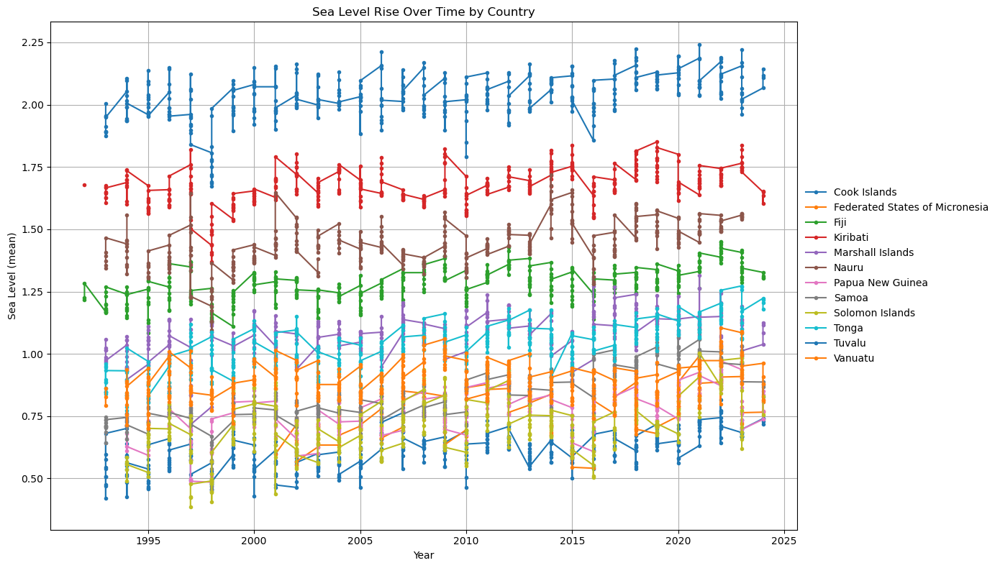

In [ ]:
# Convert 'Year' to integer for plotting purposes
all_countries['Year'] = all_countries['Year'].astype(int)

# Plotting the data for each country
plt.figure(figsize=(14, 8))

# Group by 'Country' and iterate over each group to plot sea level data
for country, group in all_countries.groupby('Country'):
    plt.plot(group['Year'], group['Sea_Level_Mean'], marker='.', linestyle='-', label=country)

plt.title('Sea Level Rise Over Time by Country')
plt.xlabel('Year')
plt.ylabel('Sea Level (mean)')
plt.grid(True)

# Place legend outside the plot box
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), frameon=False)
plt.style.use('tableau-colorblind10')
plt.tight_layout()
plt.show()

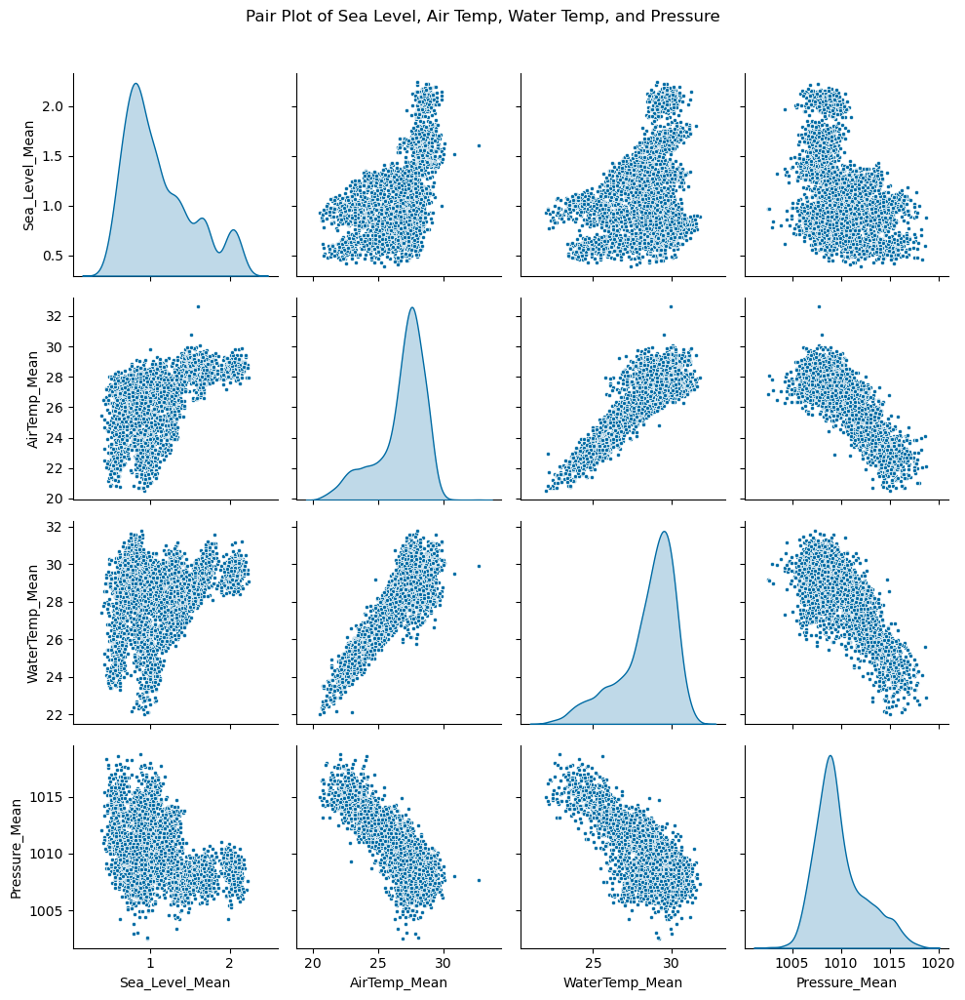

In [ ]:
# Selecting columns for pair plot
cols = ['Sea_Level_Mean', 'AirTemp_Mean', 'WaterTemp_Mean', 'Pressure_Mean']

# Creating pair plot
sns.pairplot(all_countries[cols], diag_kind='kde', markers='.')

# Adjusting layout
plt.suptitle('Pair Plot of Sea Level, Air Temp, Water Temp, and Pressure', y=1.02)
plt.tight_layout()
plt.show()

### Time Series

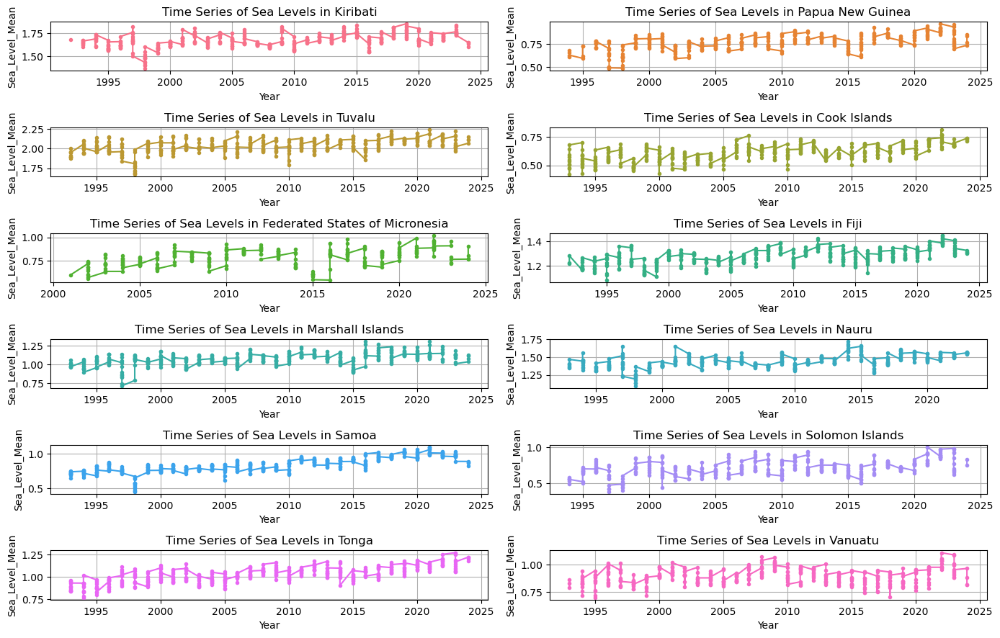

In [ ]:
# Plotting time series for Sea_Level_Mean for each country with different colors
plt.figure(figsize=(14, 10))

# Define a color palette
colors = sns.color_palette('husl', n_colors=len(all_countries['Country'].unique()))

for i, country in enumerate(all_countries['Country'].unique(), 1):
    plt.subplot(len(all_countries['Country'].unique()) // 2 + 1, 2, i)
    plt.plot(all_countries[all_countries['Country'] == country]['Year'], all_countries[all_countries['Country'] == country]['Sea_Level_Mean'], marker='.', linestyle='-', color=colors[i-1])
    plt.title(f'Time Series of Sea Levels in {country}')
    plt.xlabel('Year')
    plt.ylabel('Sea_Level_Mean')
    # plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)

plt.tight_layout()
plt.show()

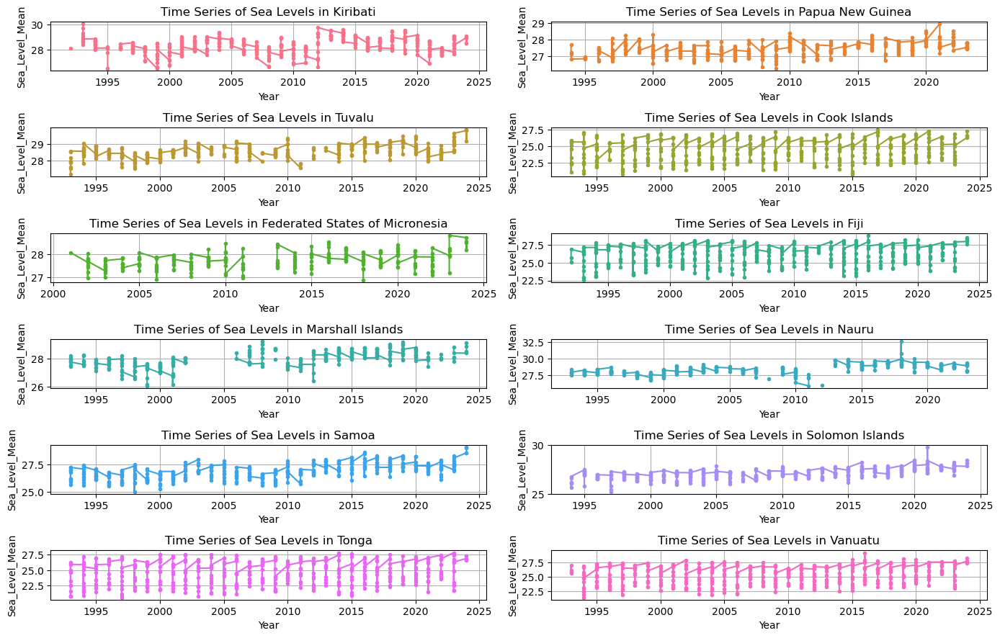

In [ ]:
# Plotting time series for Air_Temp_Mean for each country with different colors
plt.figure(figsize=(14, 10))

# Define a color palette
colors = sns.color_palette('husl', n_colors=len(all_countries['Country'].unique()))

for i, country in enumerate(all_countries['Country'].unique(), 1):
    plt.subplot(len(all_countries['Country'].unique()) // 2 + 1, 2, i)
    plt.plot(all_countries[all_countries['Country'] == country]['Year'], all_countries[all_countries['Country'] == country]['AirTemp_Mean'], marker='.', linestyle='-', color=colors[i-1])
    plt.title(f'Time Series of Sea Levels in {country}')
    plt.xlabel('Year')
    plt.ylabel('Sea_Level_Mean')
    # plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)

plt.tight_layout()
plt.show()

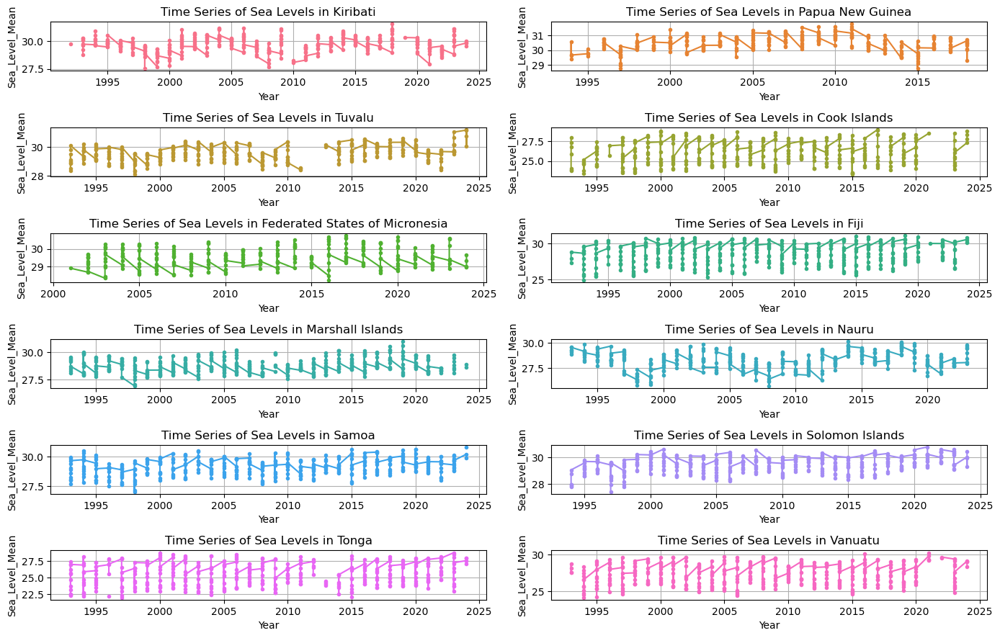

In [ ]:
# Plotting time series for Water_Temp_Mean for each country with different colors
plt.figure(figsize=(14, 10))

# Define a color palette
colors = sns.color_palette('husl', n_colors=len(all_countries['Country'].unique()))

for i, country in enumerate(all_countries['Country'].unique(), 1):
    plt.subplot(len(all_countries['Country'].unique()) // 2 + 1, 2, i)
    plt.plot(all_countries[all_countries['Country'] == country]['Year'], all_countries[all_countries['Country'] == country]['WaterTemp_Mean'], marker='.', linestyle='-', color=colors[i-1])
    plt.title(f'Time Series of Sea Levels in {country}')
    plt.xlabel('Year')
    plt.ylabel('Sea_Level_Mean')
    # plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)

plt.tight_layout()
plt.show()

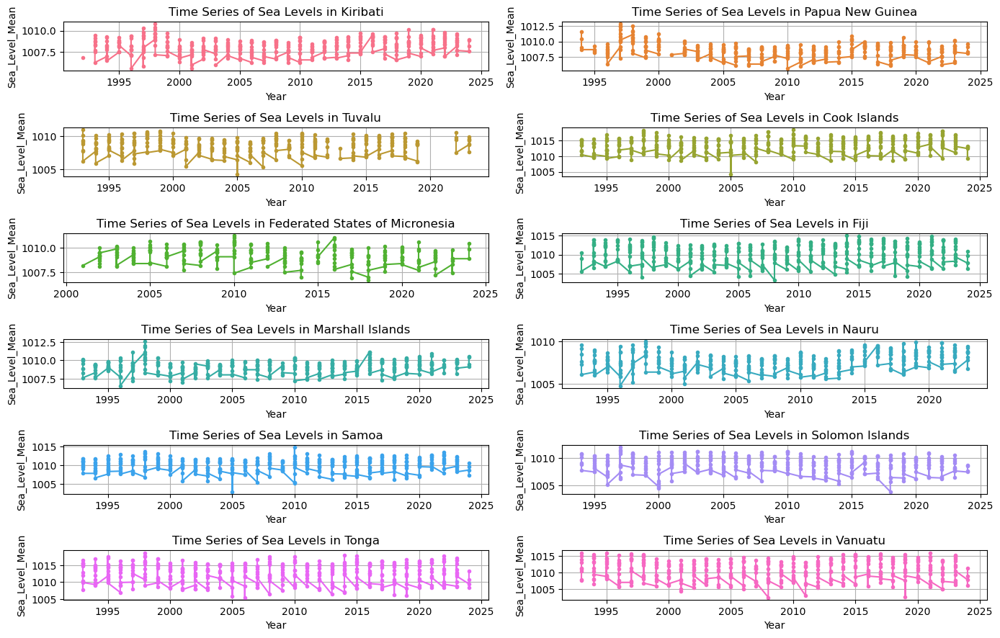

In [ ]:
# Plotting time series for Bar_Pressure_Mean for each country with different colors
plt.figure(figsize=(14, 10))

# Define a color palette
colors = sns.color_palette('husl', n_colors=len(all_countries['Country'].unique()))

for i, country in enumerate(all_countries['Country'].unique(), 1):
    plt.subplot(len(all_countries['Country'].unique()) // 2 + 1, 2, i)
    plt.plot(all_countries[all_countries['Country'] == country]['Year'], all_countries[all_countries['Country'] == country]['Pressure_Mean'], marker='.', linestyle='-', color=colors[i-1])
    plt.title(f'Time Series of Sea Levels in {country}')
    plt.xlabel('Year')
    plt.ylabel('Sea_Level_Mean')
    # plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)

plt.tight_layout()
plt.show()

# Data Augmentation
Use Interpolation.

Linear vs Polynomial ... explain.

https://www.sciencedirect.com/science/article/pii/S1877050920316914

https://arxiv.org/html/2406.06518v1#:~:text=Among%20these%2C%20the%20Synthetic%20Minority,and%20class%20imbalance%20%5B19%5D%20.

https://www.amygb.ai/blog/data-augmentation-techniques-for-numerical-data-analysis

In [ ]:
all_countries

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Kiribati,12.0,1992,0.681,2.734,1.679,0.477,24.9,30.1,28.128,0.824,28.4,30.9,29.718,0.506,1004.6,1010.0,1006.9,1.2
1,Kiribati,1.0,1993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Kiribati,2.0,1993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Kiribati,3.0,1993,0.856,2.424,1.649,0.392,26.2,30.2,28.708,0.933,28.7,30.6,29.647,0.438,1006.1,1010.8,1008.8,1.1
4,Kiribati,4.0,1993,0.515,2.849,1.627,0.501,24.9,31.8,28.567,1.113,27.9,32.2,29.202,0.406,1005.1,1011.9,1008.4,1.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4351,Vanuatu,12.0,2023,0.173,1.544,0.951,0.313,21.2,31.6,26.958,1.809,26.7,28.9,27.567,0.464,1005.1,1015.5,1010.5,2.0
4352,Vanuatu,1.0,2024,0.079,1.576,0.962,0.317,22.7,32.6,27.681,1.912,28.0,30.5,29.070,0.553,1002.7,1013.9,1007.8,2.1
4353,Vanuatu,2.0,2024,0.074,1.595,0.880,0.312,24.8,32.8,28.202,1.550,27.8,30.4,28.980,0.575,997.3,1012.5,1006.1,2.8
4354,Vanuatu,3.0,2024,0.128,1.562,0.815,0.294,21.1,32.7,27.436,1.892,27.8,30.4,28.996,0.491,999.6,1015.1,1008.8,3.1


In [ ]:
all_countries = all_countries.infer_objects()

all_countries_interpolated = all_countries.interpolate(method='linear', limit_direction='both')
all_countries = all_countries_interpolated
all_countries

,Country,Mth,Year,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
0,Kiribati,12.0,1992,0.681000,2.734000,1.679,0.477000,24.900000,30.100000,28.128000,0.824000,28.4,30.9,29.718000,0.506000,1004.6,1010.000000,1006.900000,1.200000
1,Kiribati,1.0,1993,0.739333,2.630667,1.669,0.448667,25.333333,30.133333,28.321333,0.860333,28.5,30.8,29.694333,0.483333,1005.1,1010.266667,1007.533333,1.166667
2,Kiribati,2.0,1993,0.797667,2.527333,1.659,0.420333,25.766667,30.166667,28.514667,0.896667,28.6,30.7,29.670667,0.460667,1005.6,1010.533333,1008.166667,1.133333
3,Kiribati,3.0,1993,0.856000,2.424000,1.649,0.392000,26.200000,30.200000,28.708000,0.933000,28.7,30.6,29.647000,0.438000,1006.1,1010.800000,1008.800000,1.100000
4,Kiribati,4.0,1993,0.515000,2.849000,1.627,0.501000,24.900000,31.800000,28.567000,1.113000,27.9,32.2,29.202000,0.406000,1005.1,1011.900000,1008.400000,1.400000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4351,Vanuatu,12.0,2023,0.173000,1.544000,0.951,0.313000,21.200000,31.600000,26.958000,1.809000,26.7,28.9,27.567000,0.464000,1005.1,1015.500000,1010.500000,2.000000
4352,Vanuatu,1.0,2024,0.079000,1.576000,0.962,0.317000,22.700000,32.600000,27.681000,1.912000,28.0,30.5,29.070000,0.553000,1002.7,1013.900000,1007.800000,2.100000
4353,Vanuatu,2.0,2024,0.074000,1.595000,0.880,0.312000,24.800000,32.800000,28.202000,1.550000,27.8,30.4,28.980000,0.575000,997.3,1012.500000,1006.100000,2.800000
4354,Vanuatu,3.0,2024,0.128000,1.562000,0.815,0.294000,21.100000,32.700000,27.436000,1.892000,27.8,30.4,28.996000,0.491000,999.6,1015.100000,1008.800000,3.100000


### Data augmentation and feature engineering for all countries

In [ ]:
label_encoder = LabelEncoder()

In [ ]:
solomon_islands_interpolated = solomon_islands.interpolate(method='linear', limit_direction='both')
solomon_islands = solomon_islands_interpolated

In [ ]:
# Handle categorical data
solomon_islands_dat = solomon_islands
solomon_islands_dat['Country'] = label_encoder.fit_transform(solomon_islands_dat['Country'])

# if 'Mth' in solomon_islands.columns:
solomon_islands_dat.rename(columns={'Mth': 'Month'}, inplace=True)
solomon_islands_dat['Date'] = (solomon_islands_dat['Year'].astype(str) + '-' + solomon_islands_dat['Month'].astype(str)).apply(lambda x: pd.Period(x, freq='M'))

# Set 'Date' as index
solomon_islands_dat = solomon_islands_dat.set_index('Date')

# # Drop original 'Mth' and 'Year' columns
solomon_islands_dat = solomon_islands_dat.drop(columns=['Month', 'Year'])

In [ ]:
solomon_islands['Country'] = label_encoder.fit_transform(solomon_islands['Country'])

# if 'Mth' in solomon_islands.columns:
solomon_islands.rename(columns={'Mth': 'Month'}, inplace=True)
solomon_islands['Date'] = pd.to_datetime(solomon_islands[['Year', 'Month']].assign(DAY=1))
# Set 'Date' as index
solomon_islands = solomon_islands.set_index('Date')

# # Drop original 'Mth' and 'Year' columns
solomon_islands = solomon_islands.drop(columns=['Month', 'Year'])

In [ ]:
kiribati_interpolated = kiribati.interpolate(method='linear', limit_direction='both')
kiribati = kiribati_interpolated

In [ ]:
# Handle categorical data
kiribati['Country'] = label_encoder.fit_transform(kiribati['Country'])

# if 'Mth' in solomon_islands.columns:
kiribati.rename(columns={'Mth': 'Month'}, inplace=True)
# Convert 'Mth' and 'Year' to datetime
kiribati['Date'] = pd.to_datetime(kiribati[['Year', 'Month']].assign(DAY=1))
kiribati = kiribati.set_index('Date')

# # Drop original 'Mth' and 'Year' columns
kiribati = kiribati.drop(columns=['Month', 'Year'])

In [ ]:
png_interpolated = png.interpolate(method='linear', limit_direction='both')
png = png_interpolated

In [ ]:
# Handle categorical data
png['Country'] = label_encoder.fit_transform(png['Country'])

# if 'Mth' in solomon_islands.columns:
png.rename(columns={'Mth': 'Month'}, inplace=True)
# Convert 'Mth' and 'Year' to datetime
png['Date'] = pd.to_datetime(png[['Year', 'Month']].assign(DAY=1))
png = png.set_index('Date')

# # Drop original 'Mth' and 'Year' columns
png = png.drop(columns=['Month', 'Year'])

In [ ]:
tuvalu_interpolated = tuvalu.interpolate(method='linear', limit_direction='both')
tuvalu = tuvalu_interpolated

In [ ]:
# Handle categorical data
tuvalu['Country'] = label_encoder.fit_transform(tuvalu['Country'])

# if 'Mth' in solomon_islands.columns:
tuvalu.rename(columns={'Mth': 'Month'}, inplace=True)
# Convert 'Mth' and 'Year' to datetime
tuvalu['Date'] = pd.to_datetime(tuvalu[['Year', 'Month']].assign(DAY=1))
tuvalu = tuvalu.set_index('Date')

# # Drop original 'Mth' and 'Year' columns
tuvalu = tuvalu.drop(columns=['Month', 'Year'])

In [ ]:
fiji_interpolated = fiji.interpolate(method='linear', limit_direction='both')
fiji = fiji_interpolated

In [ ]:
# Handle categorical data
fiji['Country'] = label_encoder.fit_transform(fiji['Country'])

# if 'Mth' in solomon_islands.columns:
fiji.rename(columns={'Mth': 'Month'}, inplace=True)
# Convert 'Mth' and 'Year' to datetime
fiji['Date'] = pd.to_datetime(fiji[['Year', 'Month']].assign(DAY=1))
fiji = fiji.set_index('Date')

# # Drop original 'Mth' and 'Year' columns
fiji = fiji.drop(columns=['Month', 'Year'])

In [ ]:
cook_islands_interpolated = cook_islands.interpolate(method='linear', limit_direction='both')
cook_islands = cook_islands_interpolated

In [ ]:
# Handle categorical data
cook_islands['Country'] = label_encoder.fit_transform(cook_islands['Country'])

# if 'Mth' in solomon_islands.columns:
cook_islands.rename(columns={'Mth': 'Month'}, inplace=True)
# Convert 'Mth' and 'Year' to datetime
cook_islands['Date'] = pd.to_datetime(cook_islands[['Year', 'Month']].assign(DAY=1))
cook_islands = cook_islands.set_index('Date')

# # Drop original 'Mth' and 'Year' columns
cook_islands = cook_islands.drop(columns=['Month', 'Year'])

In [ ]:
marshall_islands_interpolated = marshall_islands.interpolate(method='linear', limit_direction='both')
marshall_islands = marshall_islands_interpolated

In [ ]:
# Handle categorical data
marshall_islands['Country'] = label_encoder.fit_transform(marshall_islands['Country'])

# if 'Mth' in solomon_islands.columns:
marshall_islands.rename(columns={'Mth': 'Month'}, inplace=True)
# Convert 'Mth' and 'Year' to datetime
marshall_islands['Date'] = pd.to_datetime(marshall_islands[['Year', 'Month']].assign(DAY=1))
marshall_islands = marshall_islands.set_index('Date')

# # Drop original 'Mth' and 'Year' columns
marshall_islands = marshall_islands.drop(columns=['Month', 'Year'])

In [ ]:
fsm_interpolated = fsm.interpolate(method='linear', limit_direction='both')
fsm = fsm_interpolated

In [ ]:
# Handle categorical data
fsm['Country'] = label_encoder.fit_transform(fsm['Country'])

# if 'Mth' in solomon_islands.columns:
fsm.rename(columns={'Mth': 'Month'}, inplace=True)
# Convert 'Mth' and 'Year' to datetime
fsm['Date'] = pd.to_datetime(fsm[['Year', 'Month']].assign(DAY=1))
fsm = fsm.set_index('Date')

# # Drop original 'Mth' and 'Year' columns
fsm = fsm.drop(columns=['Month', 'Year'])

In [ ]:
nauru_interpolated = nauru.interpolate(method='linear', limit_direction='both')
nauru = fsm_interpolated

In [ ]:
# Handle categorical data
nauru['Country'] = label_encoder.fit_transform(nauru['Country'])

# if 'Mth' in solomon_islands.columns:
nauru.rename(columns={'Mth': 'Month'}, inplace=True)
# Convert 'Mth' and 'Year' to datetime
nauru['Date'] = pd.to_datetime(nauru[['Year', 'Month']].assign(DAY=1))
nauru = nauru.set_index('Date')

# # Drop original 'Mth' and 'Year' columns
nauru = nauru.drop(columns=['Month', 'Year'])

In [ ]:
samoa_interpolated = samoa.interpolate(method='linear', limit_direction='both')
samoa = samoa_interpolated

In [ ]:
# Handle categorical data
samoa['Country'] = label_encoder.fit_transform(samoa['Country'])

# if 'Mth' in solomon_islands.columns:
samoa.rename(columns={'Mth': 'Month'}, inplace=True)
# Convert 'Mth' and 'Year' to datetime
samoa['Date'] = pd.to_datetime(samoa[['Year', 'Month']].assign(DAY=1))
samoa = samoa.set_index('Date')

# # Drop original 'Mth' and 'Year' columns
samoa = samoa.drop(columns=['Month', 'Year'])

In [ ]:
tonga_interpolated = tonga.interpolate(method='linear', limit_direction='both')
tonga = tonga_interpolated

In [ ]:
# Handle categorical data
tonga['Country'] = label_encoder.fit_transform(tonga['Country'])

# if 'Mth' in solomon_islands.columns:
tonga.rename(columns={'Mth': 'Month'}, inplace=True)
# Convert 'Mth' and 'Year' to datetime
tonga['Date'] = pd.to_datetime(tonga[['Year', 'Month']].assign(DAY=1))
tonga = tonga.set_index('Date')

# # Drop original 'Mth' and 'Year' columns
tonga = tonga.drop(columns=['Month', 'Year'])

In [ ]:
vanuatu_interpolated = vanuatu.interpolate(method='linear', limit_direction='both')
vanuatu = vanuatu_interpolated

In [ ]:
# Handle categorical data
vanuatu['Country'] = label_encoder.fit_transform(vanuatu['Country'])

# if 'Mth' in solomon_islands.columns:
vanuatu.rename(columns={'Mth': 'Month'}, inplace=True)
# Convert 'Mth' and 'Year' to datetime
vanuatu['Date'] = pd.to_datetime(vanuatu[['Year', 'Month']].assign(DAY=1))
vanuatu = vanuatu.set_index('Date')

# # Drop original 'Mth' and 'Year' columns
vanuatu = vanuatu.drop(columns=['Month', 'Year'])


# Feature Distributions and Transformation
The transformation is only done for the linear regression model but this might not happen, we will see.

## Solomon Islands

In [ ]:
solomon_islands2 = solomon_islands.applymap(lambda x: x if x >= 0 else None).dropna()
solomon_islands2.drop(columns=['Country'], inplace=True)

In [ ]:
df_numeric = solomon_islands2

# Summary statistics for the numerical columns
df_numeric.describe()

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
count,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000,356.000000
mean,0.256188,1.119569,0.711079,0.195574,23.394803,31.812921,27.075153,1.827100,28.676685,30.579213,29.465253,0.347067,1004.032303,1012.948315,1008.736517,1.710393
std,0.121467,0.133828,0.111336,0.027401,0.801513,1.161420,0.540684,0.170922,0.636919,0.726852,0.609543,0.107098,2.111764,1.497721,1.480192,0.336140
min,0.015000,0.719000,0.387000,0.131000,20.100000,28.800000,25.223000,1.427000,26.500000,28.400000,27.398000,0.178000,994.700000,1008.900000,1003.800000,1.100000
25%,0.162750,1.033750,0.640750,0.174000,22.900000,31.000000,26.746500,1.710500,28.300000,30.100000,29.053500,0.268500,1002.800000,1012.000000,1007.775000,1.500000
50%,0.245500,1.128000,0.705000,0.196000,23.500000,31.600000,27.069500,1.814000,28.700000,30.700000,29.543500,0.326000,1004.200000,1013.100000,1008.900000,1.600000
75%,0.335500,1.213000,0.781000,0.216250,23.981250,32.400000,27.405500,1.917750,29.100000,31.100000,29.922000,0.401500,1005.700000,1013.900000,1009.925000,1.900000
max,0.616000,1.407000,1.004000,0.259000,25.300000,36.000000,29.805000,2.444000,30.000000,31.900000,30.784000,0.846000,1007.900000,1016.600000,1012.000000,3.200000


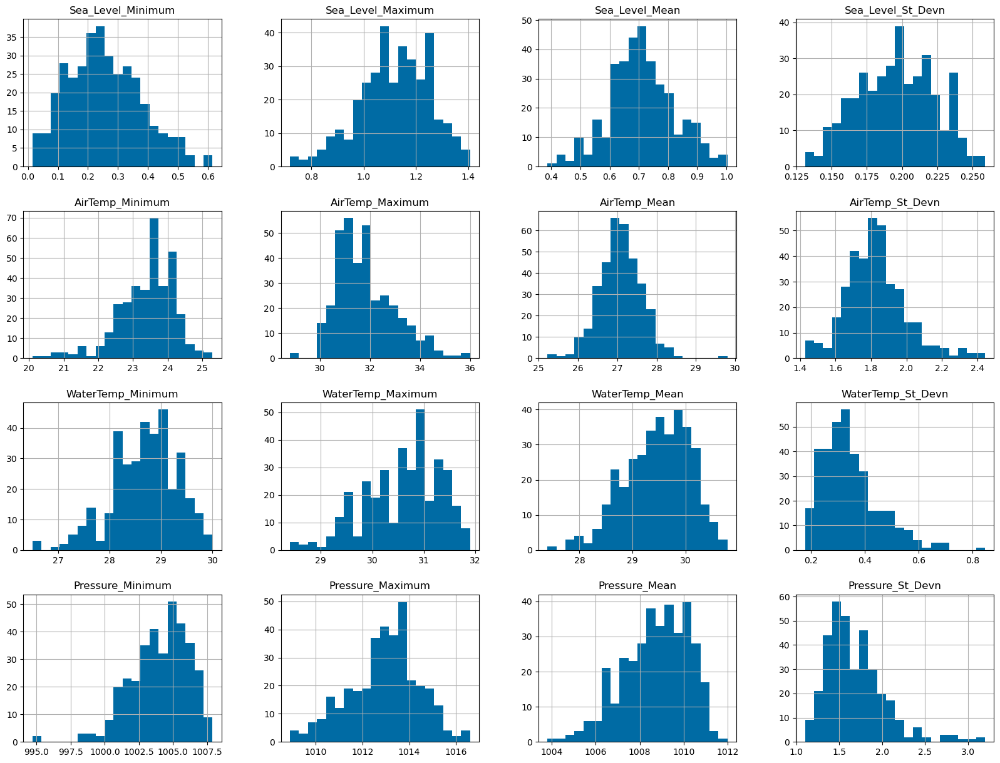

In [ ]:
# Plot histograms for each numerical column
df_numeric.hist(bins=20, figsize=(20, 15))
plt.show()

In [ ]:
SI_cols = solomon_islands2.columns
SI_cols

Index(['Sea_Level_Minimum', 'Sea_Level_Maximum', 'Sea_Level_Mean',
       'Sea_Level_St_Devn', 'AirTemp_Minimum', 'AirTemp_Maximum',
       'AirTemp_Mean', 'AirTemp_St_Devn', 'WaterTemp_Minimum',
       'WaterTemp_Maximum', 'WaterTemp_Mean', 'WaterTemp_St_Devn',
       'Pressure_Minimum', 'Pressure_Maximum', 'Pressure_Mean',
       'Pressure_St_Devn'],
      dtype='object')

In [ ]:
SI_cols = solomon_islands2.columns
lambda_values = []

for col in SI_cols:
    SI_vals = solomon_islands2[col].values
    fitted_data, fitted_lambda = stats.boxcox(SI_vals.ravel())

    # # creating axes to draw plots
    # fig, ax = plt.subplots(1, 2)

    # # plotting the original data(non-normal) and
    # # fitted data (normal)
    # sns.distplot(SI_vals, hist = False, kde = True,
    #             kde_kws = {'shade': True, 'linewidth': 2},
    #             label = "Non-Normal", color ="green", ax = ax[0])

    # sns.distplot(fitted_data, hist = False, kde = True,
    #             kde_kws = {'shade': True, 'linewidth': 2},
    #             label = "Normal", color ="green", ax = ax[1])

    # # adding legends to the subplots
    # plt.legend(loc = "upper right")

    # # rescaling the subplots
    # fig.set_figheight(5)
    # fig.set_figwidth(10)
    lambda_values.append(fitted_lambda)

    print(f"Lambda value used for Transformation: {fitted_lambda}")

Lambda value used for Transformation: 0.6458478599112378
Lambda value used for Transformation: 2.020055551802043
Lambda value used for Transformation: 0.857501762758421
Lambda value used for Transformation: 1.0716806811597879
Lambda value used for Transformation: 9.084483070418976
Lambda value used for Transformation: -6.4869678349828
Lambda value used for Transformation: -1.3714302643074405
Lambda value used for Transformation: -0.7269956202999818
Lambda value used for Transformation: 9.413831651269964
Lambda value used for Transformation: 10.810292013867532
Lambda value used for Transformation: 10.156357537348375
Lambda value used for Transformation: -0.3690771219700603
Lambda value used for Transformation: 101.97157080462797
Lambda value used for Transformation: 85.03321217508041
Lambda value used for Transformation: 101.91166160174582
Lambda value used for Transformation: -1.2438520221690488


In [ ]:
print(lambda_values)

[0.6458478599112378, 2.020055551802043, 0.857501762758421, 1.0716806811597879, 9.084483070418976, -6.4869678349828, -1.3714302643074405, -0.7269956202999818, 9.413831651269964, 10.810292013867532, 10.156357537348375, -0.3690771219700603, 101.97157080462797, 85.03321217508041, 101.91166160174582, -1.2438520221690488]


In [ ]:
def custom_round(arr):
    arr = np.array(arr)

    arr_rounded = np.where((arr >= 0) & (arr <= 1), np.round(arr * 2) / 2, np.round(arr))
    return arr_rounded

rounded_arr = custom_round(lambda_values)
print(rounded_arr)

[  0.5   2.    1.    1.    9.   -6.   -1.   -1.    9.   11.   10.   -0.
 102.   85.  102.   -1. ]


### Apply lambda functions based on their values

In [ ]:
print(solomon_islands2.head())
# Function to apply Box-Cox transformation to each column based on lambda values
def apply_boxcox_to_column(column, lambda_value):
    if lambda_value == 0:
        return np.log(column)
    elif lambda_value == 0.5:
        return np.sqrt(column)
    elif lambda_value == -0.5:
        return 1/np.sqrt(column)
    elif lambda_value == 1:
        return column
    elif lambda_value == -1:
        return 1/column
    elif lambda_value == 2:
        return column**2
    elif lambda_value == -2:
        return 1/column**2
    else:
        if lambda_value > 0:
            return column**lambda_value
        else:
            column**(-lambda_value)

# Apply transformations to each column in the DataFrame
for col, lam in zip(solomon_islands2.columns, lambda_values):
    solomon_islands2[col] = apply_boxcox_to_column(solomon_islands2[col], lam)

# Print the transformed DataFrame
print(solomon_islands2.head())

            Sea_Level_Minimum  Sea_Level_Maximum  Sea_Level_Mean  \
Date                                                               
1994-07-01              0.335              0.871           0.586   
1994-08-01              0.181              0.875           0.568   
1994-09-01              0.162              0.840           0.489   
1994-10-01              0.193              0.919           0.537   
1994-11-01              0.130              0.943           0.560   

            Sea_Level_St_Devn  AirTemp_Minimum  AirTemp_Maximum  AirTemp_Mean  \
Date                                                                            
1994-07-01              0.131             23.5             28.8        26.141   
1994-08-01              0.172             22.2             30.3        26.097   
1994-09-01              0.153             21.1             30.9        25.632   
1994-10-01              0.159             21.3             30.1        26.065   
1994-11-01              0.194        

## Kiribati

In [ ]:
kiribati2 = kiribati.applymap(lambda x: x if x >= 0 else None).dropna()
kiribati2.drop(columns=['Country'], inplace=True)
kiribati2

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
Date,,,,,,,,,,,,,,,,
1992-12-01,0.681000,2.734000,1.679,0.477000,24.900000,30.100000,28.128000,0.824000,28.4,30.9,29.718000,0.506000,1004.6,1010.000000,1006.900000,1.200000
1993-01-01,0.739333,2.630667,1.669,0.448667,25.333333,30.133333,28.321333,0.860333,28.5,30.8,29.694333,0.483333,1005.1,1010.266667,1007.533333,1.166667
1993-02-01,0.797667,2.527333,1.659,0.420333,25.766667,30.166667,28.514667,0.896667,28.6,30.7,29.670667,0.460667,1005.6,1010.533333,1008.166667,1.133333
1993-03-01,0.856000,2.424000,1.649,0.392000,26.200000,30.200000,28.708000,0.933000,28.7,30.6,29.647000,0.438000,1006.1,1010.800000,1008.800000,1.100000
1993-04-01,0.515000,2.849000,1.627,0.501000,24.900000,31.800000,28.567000,1.113000,27.9,32.2,29.202000,0.406000,1005.1,1011.900000,1008.400000,1.400000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,0.798000,2.748000,1.730,0.442000,23.300000,31.000000,28.351000,1.226000,27.8,31.0,29.542000,0.567000,1003.5,1012.600000,1007.700000,2.000000
2024-01-01,0.658000,2.795000,1.650,0.464000,24.300000,31.300000,28.953000,1.136000,27.9,31.3,29.835000,0.590000,1002.4,1012.200000,1007.600000,1.900000
2024-02-01,0.496000,2.907000,1.652,0.505000,25.100000,31.100000,29.096000,0.981000,28.7,30.9,29.886000,0.473000,1005.5,1012.600000,1009.000000,1.400000


In [ ]:
df_numeric = kiribati2

# Summary statistics for the numerical columns
df_numeric.describe()

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
count,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000
mean,0.596634,2.832566,1.671943,0.495581,24.677586,29.884483,28.290507,0.752469,28.384881,30.886340,29.704805,0.439151,1003.942042,1012.140716,1008.140981,1.597745
std,0.104436,0.109482,0.073384,0.025011,0.792364,1.078178,0.658676,0.231781,0.806578,0.769992,0.686614,0.123550,1.303423,1.134485,0.923878,0.286680
min,0.167000,2.424000,1.370000,0.388000,22.200000,27.300000,26.495000,0.296000,26.200000,28.800000,27.527000,0.249000,998.800000,1009.500000,1005.600000,1.100000
25%,0.538000,2.760000,1.632000,0.479000,24.166667,29.100000,27.891000,0.558733,27.800000,30.400000,29.303000,0.343000,1003.100000,1011.300000,1007.500000,1.400000
50%,0.593000,2.842000,1.671000,0.498000,24.700000,29.900000,28.328000,0.719000,28.300000,31.000000,29.703000,0.415000,1004.000000,1012.100000,1008.200000,1.600000
75%,0.661000,2.909000,1.720000,0.513000,25.100000,30.600000,28.780000,0.938000,29.000000,31.400000,30.170000,0.510000,1004.900000,1012.900000,1008.800000,1.700000
max,0.872000,3.146000,1.851000,0.624000,27.300000,33.500000,30.051000,1.295000,30.800000,32.700000,31.559000,0.904000,1006.900000,1015.500000,1010.800000,3.400000


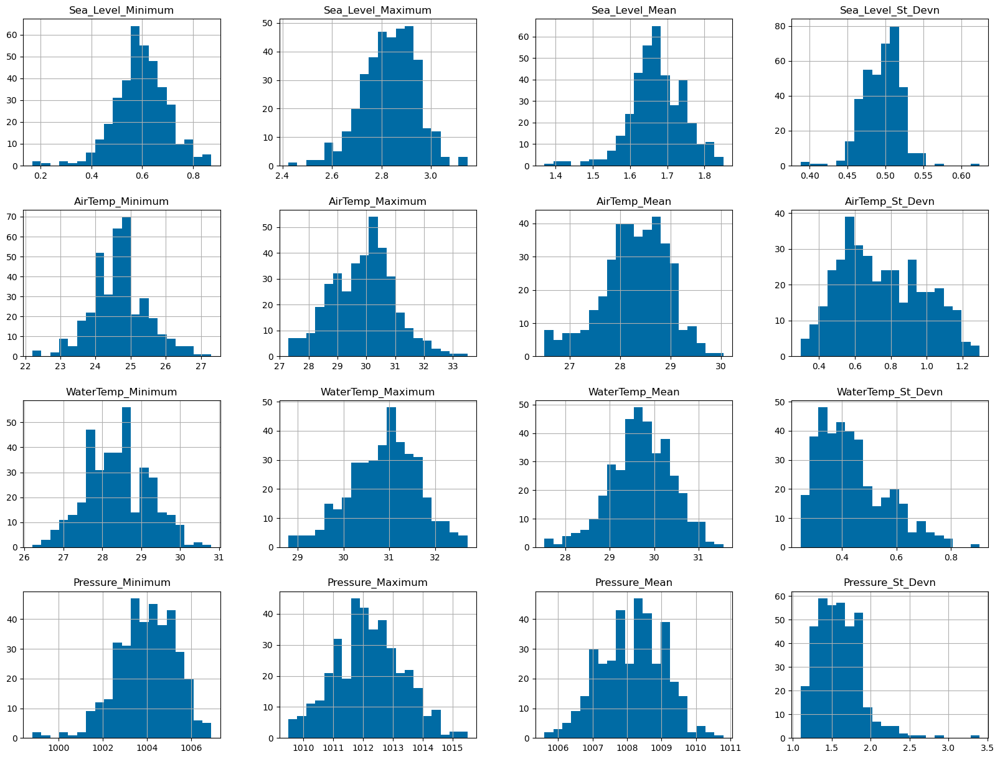

In [ ]:
# Plot histograms for each numerical column
df_numeric.hist(bins=20, figsize=(20, 15))
# plt.ylabel('Frequency/Density')
plt.savefig('images/kiribati-dist.pdf', format = 'pdf')
plt.show()

In [ ]:
SI_cols = kiribati2.columns
SI_cols

Index(['Sea_Level_Minimum', 'Sea_Level_Maximum', 'Sea_Level_Mean',
       'Sea_Level_St_Devn', 'AirTemp_Minimum', 'AirTemp_Maximum',
       'AirTemp_Mean', 'AirTemp_St_Devn', 'WaterTemp_Minimum',
       'WaterTemp_Maximum', 'WaterTemp_Mean', 'WaterTemp_St_Devn',
       'Pressure_Minimum', 'Pressure_Maximum', 'Pressure_Mean',
       'Pressure_St_Devn'],
      dtype='object')

In [ ]:
# SI_cols = kiribati2.columns
# lambda_values = []

# for col in SI_cols:
#     SI_vals = kiribati2[col].values
#     fitted_data, fitted_lambda = stats.boxcox(SI_vals.ravel())

#     # creating axes to draw plots
#     fig, ax = plt.subplots(1, 2)

#     # plotting the original data(non-normal) and
#     # fitted data (normal)
#     sns.distplot(SI_vals, hist = False, kde = True,
#                 kde_kws = {'shade': True, 'linewidth': 2},
#                 label = "Non-Normal", color ="green", ax = ax[0])

#     sns.distplot(fitted_data, hist = False, kde = True,
#                 kde_kws = {'shade': True, 'linewidth': 2},
#                 label = "Normal", color ="green", ax = ax[1])

#     # adding legends to the subplots
#     plt.legend(loc = "upper right")

#     # rescaling the subplots
#     fig.set_figheight(5)
#     fig.set_figwidth(10)
#     lambda_values.append(fitted_lambda)

#     print(f"Lambda value used for Transformation: {fitted_lambda}")

In [ ]:
# print(lambda_values)

In [ ]:
# lambda_values = [round(x * 2) / 2 for x in lambda_values]
# print(lambda_values)

## Papua New Guinea

In [ ]:
png2 = png.applymap(lambda x: x if x >= 0 else None).dropna()
png2.drop(columns=['Country'], inplace=True)

In [ ]:
df_numeric = png2

# Summary statistics for the numerical columns
df_numeric.describe()

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
count,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000,338.000000
mean,0.189994,1.189411,0.776635,0.217880,23.754882,30.419675,27.449981,1.444250,29.515385,31.551479,30.497751,0.381970,1004.522781,1012.500789,1008.566174,1.544428
std,0.094567,0.106540,0.078783,0.031007,0.585762,0.582017,0.403179,0.129461,0.642485,0.502080,0.467275,0.132606,1.460974,1.200149,1.119465,0.241732
min,0.002000,0.815000,0.481000,0.143000,21.500000,28.500000,26.275000,0.832000,27.800000,29.600000,28.762000,0.205000,1000.600000,1008.600000,1005.700000,1.000000
25%,0.118250,1.120250,0.732136,0.195250,23.400000,30.000000,27.180000,1.371000,29.000000,31.300000,30.208250,0.284000,1003.572727,1011.800000,1007.900000,1.400000
50%,0.192000,1.196500,0.772000,0.220000,23.800000,30.486364,27.446000,1.459500,29.500000,31.500000,30.605000,0.369000,1004.600000,1012.500000,1008.600000,1.500000
75%,0.261750,1.257500,0.833750,0.240000,24.100000,30.800000,27.721750,1.522750,30.200000,31.800000,30.729000,0.449000,1005.500000,1013.200000,1009.200000,1.700000
max,0.513000,1.519000,0.972000,0.291000,25.200000,32.100000,28.948000,1.804000,30.800000,33.100000,31.783000,1.033000,1009.700000,1016.400000,1012.500000,2.500000


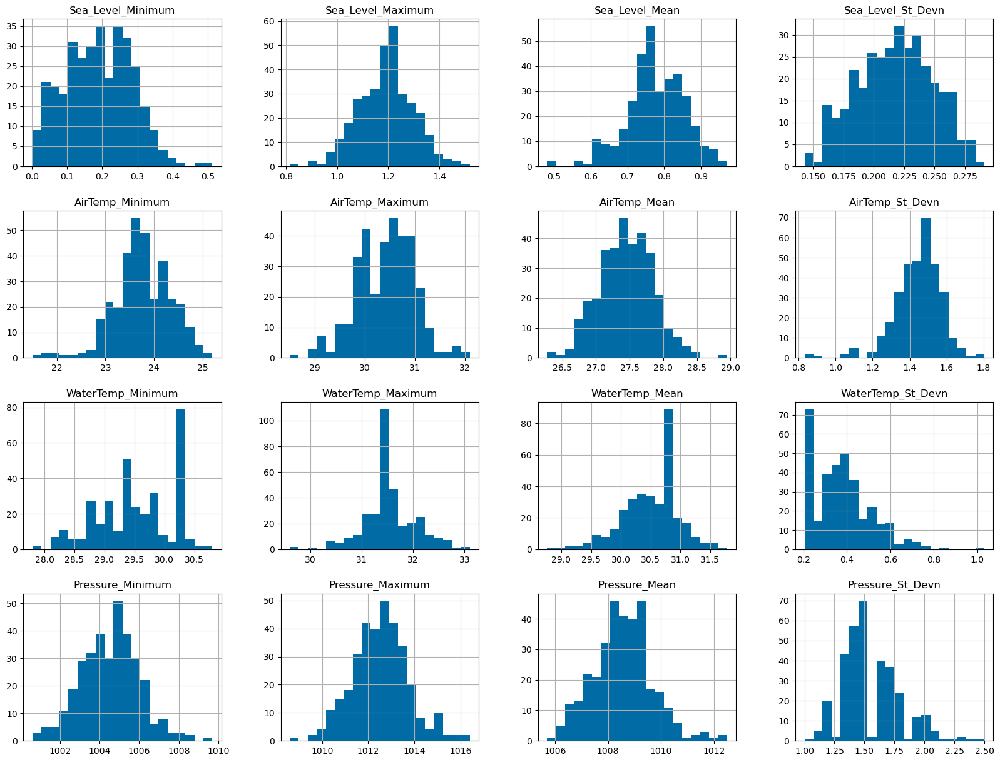

In [ ]:
# Plot histograms for each numerical column
df_numeric.hist(bins=20, figsize=(20, 15))
plt.show()

## FSM

In [ ]:
fsm2 = fsm.applymap(lambda x: x if x >= 0 else None).dropna()
fsm2.drop(columns=['Country'], inplace=True)

In [ ]:
df_numeric = fsm2

# Summary statistics for the numerical columns
df_numeric.describe()

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
count,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000
mean,0.211981,1.537732,0.793151,0.282060,23.960425,31.271815,27.688504,1.490815,28.950965,30.345174,29.547863,0.223127,1005.082625,1013.113514,1009.203282,1.539382
std,0.094064,0.106005,0.086279,0.015883,0.509482,0.680048,0.348412,0.214872,0.641425,0.640997,0.535757,0.063230,1.353461,1.019953,0.813020,0.244938
min,0.013000,1.127000,0.568000,0.172000,22.600000,29.900000,26.886000,0.817000,27.300000,28.900000,28.236000,0.114000,996.700000,1010.000000,1006.700000,0.900000
25%,0.144250,1.466500,0.725000,0.276000,23.600000,30.800000,27.452500,1.364000,28.500000,29.808333,29.130500,0.178875,1004.300000,1012.500000,1008.700000,1.400000
50%,0.216000,1.541000,0.809000,0.284000,24.000000,31.100000,27.662000,1.501000,29.000000,30.300000,29.546000,0.208000,1005.200000,1013.100000,1009.200000,1.500000
75%,0.272000,1.605500,0.851000,0.291000,24.300000,31.700000,27.892500,1.638833,29.500000,30.800000,29.960125,0.258500,1006.000000,1013.800000,1009.800000,1.600000
max,0.601000,1.795000,1.021000,0.320000,26.900000,33.400000,28.829000,1.990000,30.400000,31.800000,30.758000,0.456000,1007.900000,1016.500000,1011.100000,2.800000


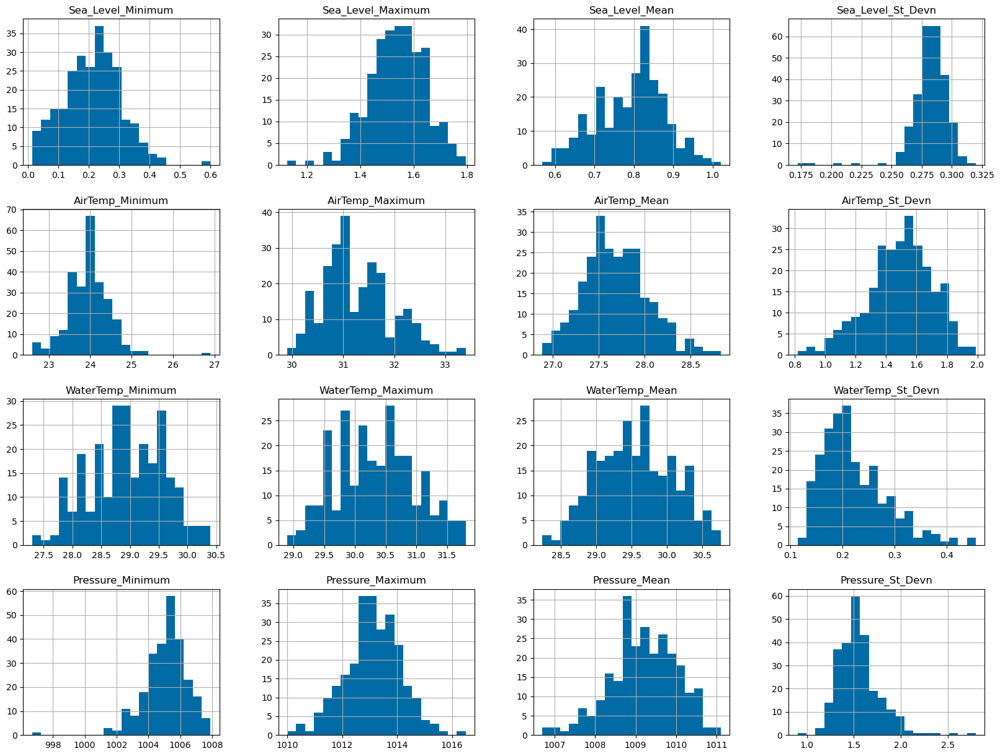

In [ ]:
# Plot histograms for each numerical column
df_numeric.hist(bins=20, figsize=(20, 15))
plt.show()

## Samoa

In [ ]:
samoa2 = samoa.applymap(lambda x: x if x >= 0 else None).dropna()
samoa2.drop(columns=['Country'], inplace=True)

In [ ]:
df_numeric = samoa2

# Summary statistics for the numerical columns
df_numeric.describe()

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
count,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.000000,355.00000,355.000000,355.000000,355.000000,355.000000,355.000000,355.00000,355.000000
mean,0.221189,1.523441,0.852692,0.298769,22.486761,31.268873,26.922369,2.032785,28.18169,30.188169,29.180820,0.364735,1005.215211,1014.346197,1010.08169,1.759437
std,0.114553,0.122793,0.096715,0.018005,1.081911,1.306896,0.680794,0.260735,0.81137,0.720748,0.671552,0.130931,3.265051,1.507029,1.68420,0.506723
min,0.001000,0.961000,0.643000,0.180000,18.600000,28.800000,25.265000,1.453000,25.40000,28.100000,27.488000,0.084000,982.700000,1008.100000,1002.90000,0.900000
25%,0.132500,1.434500,0.770000,0.292500,21.900000,30.200000,26.446000,1.854500,27.60000,29.700000,28.691000,0.266500,1004.100000,1013.400000,1008.95000,1.400000
50%,0.207000,1.510000,0.835000,0.300000,22.600000,31.200000,26.918000,1.991000,28.20000,30.300000,29.201000,0.350000,1006.000000,1014.400000,1010.30000,1.600000
75%,0.292500,1.620000,0.924000,0.308000,23.200000,32.300000,27.373500,2.197750,28.80000,30.700000,29.708500,0.428500,1007.100000,1015.400000,1011.30000,1.900000
max,0.590000,1.841000,1.098000,0.406000,25.300000,34.800000,29.120000,3.050000,30.50000,31.700000,30.787000,0.968000,1012.500000,1017.700000,1014.90000,5.000000


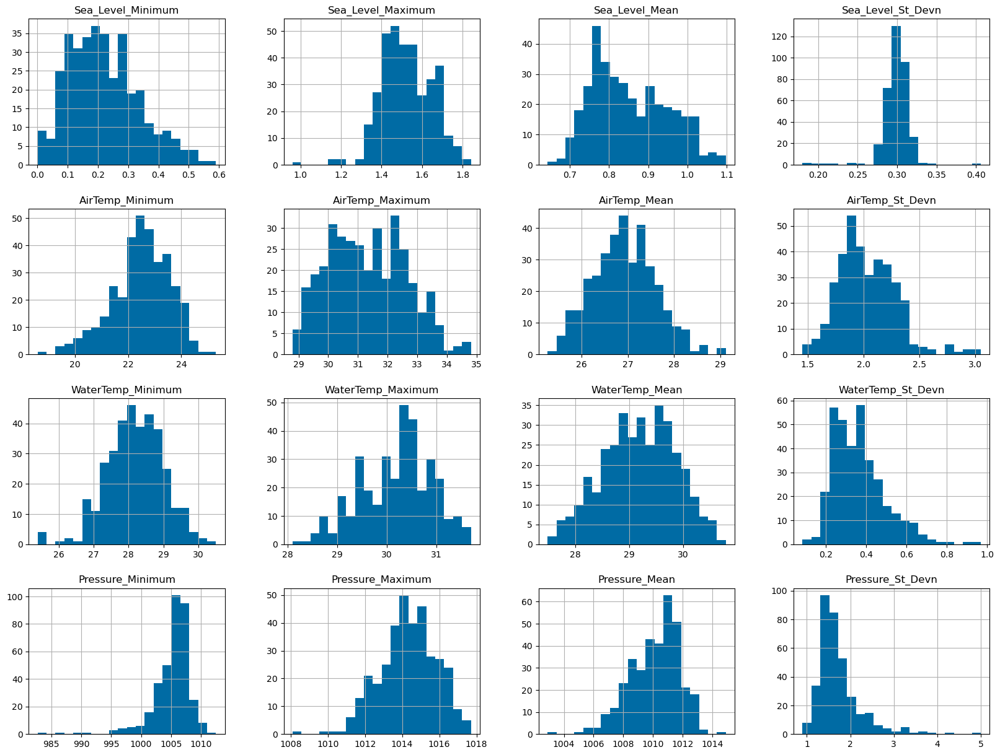

In [ ]:
# Plot histograms for each numerical column
df_numeric.hist(bins=20, figsize=(20, 15))
plt.show()

## Tonga

In [ ]:
tonga2 = tonga.applymap(lambda x: x if x >= 0 else None).dropna()
tonga2.drop(columns=['Country'], inplace=True)

In [ ]:
df_numeric = tonga2

# Summary statistics for the numerical columns
df_numeric.describe()

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
count,369.000000,369.000000,369.000000,369.000000,369.000000,369.000000,369.000000,369.000000,369.000000,369.000000,369.000000,369.000000,369.000000,369.000000,369.000000,369.000000
mean,0.242217,1.821829,1.034003,0.384127,20.153117,28.122764,24.453428,1.511694,24.553388,27.003117,25.524603,0.502412,1004.644986,1018.445528,1012.707588,2.678862
std,0.106633,0.119780,0.087492,0.012862,2.215986,1.912536,1.928472,0.249677,1.577588,1.896586,1.662025,0.204193,6.259365,2.892529,2.814133,0.728300
min,0.002000,1.463000,0.786000,0.330000,15.300000,23.800000,20.520000,0.933000,20.900000,22.600000,22.001000,0.047000,956.200000,1011.300000,1005.500000,1.300000
25%,0.167000,1.746000,0.969000,0.375000,18.300000,26.600000,22.794000,1.349000,23.200000,25.400000,24.064000,0.368000,1003.100000,1016.000000,1010.600000,2.200000
50%,0.243000,1.821000,1.039000,0.385000,20.000000,28.100000,24.512000,1.488000,24.600000,26.900000,25.527000,0.481000,1006.000000,1018.700000,1013.000000,2.600000
75%,0.321000,1.888000,1.093000,0.393000,22.100000,29.700000,26.267000,1.685000,25.900000,28.700000,26.974000,0.596000,1008.000000,1020.700000,1015.100000,3.100000
max,0.554000,2.715000,1.273000,0.425000,24.200000,32.200000,27.843000,2.348000,27.400000,31.300000,28.769000,1.483000,1013.600000,1024.600000,1018.700000,6.000000


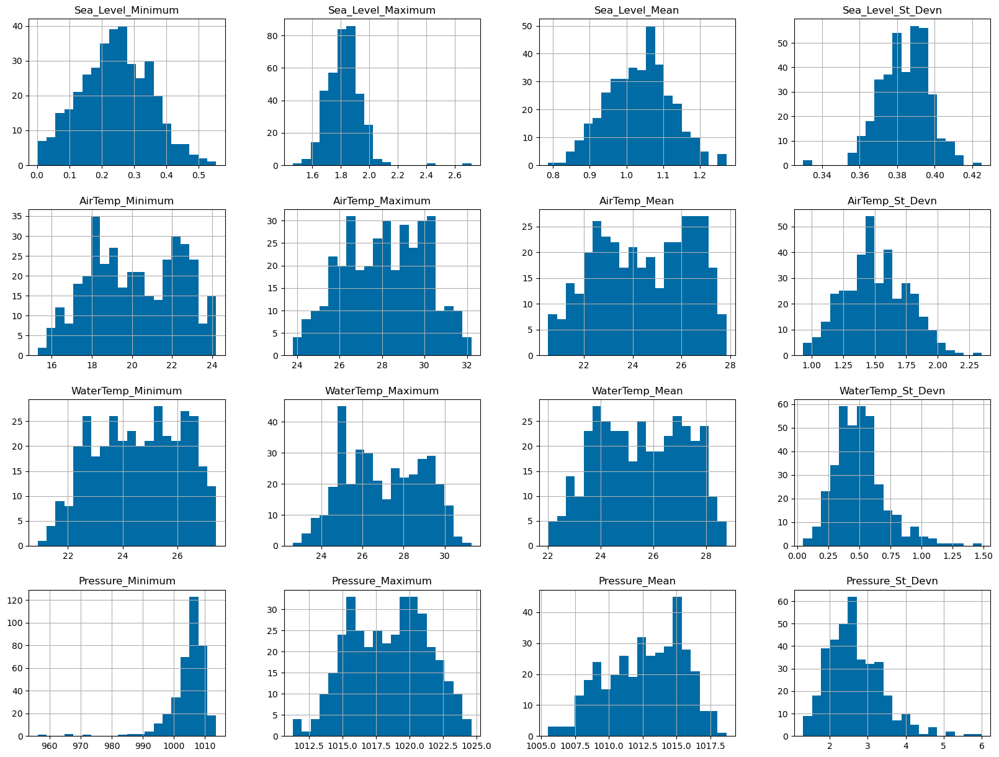

In [ ]:
# Plot histograms for each numerical column
df_numeric.hist(bins=20, figsize=(20, 15))
plt.show()

## Tuvalu

In [ ]:
tuvalu2 = tuvalu.applymap(lambda x: x if x >= 0 else None).dropna()
tuvalu2.drop(columns=['Country'], inplace=True)

In [ ]:
df_numeric = tuvalu2

# Summary statistics for the numerical columns
df_numeric.describe()

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
count,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000,374.000000
mean,1.012444,3.109997,2.032709,0.467036,24.451738,30.729545,28.537717,0.987531,28.826604,30.549465,29.532306,0.270790,1004.588503,1012.630882,1008.717380,1.563102
std,0.115762,0.129048,0.089320,0.024991,0.619818,0.824118,0.407143,0.144976,0.570658,0.850595,0.531339,0.130507,1.938627,1.223604,1.170344,0.353128
min,0.527000,2.425000,1.673000,0.300000,22.400000,27.800000,27.185000,0.366000,26.900000,28.600000,28.106000,0.071000,994.200000,1008.600000,1004.200000,1.000000
25%,0.945250,3.041250,1.984000,0.454250,24.100000,30.200000,28.284250,0.897750,28.500000,29.900000,29.136500,0.180250,1003.600000,1011.800000,1008.000000,1.300000
50%,1.023500,3.122000,2.035500,0.467000,24.500000,30.688462,28.511000,0.981500,28.800000,30.500000,29.542000,0.246125,1004.900000,1012.700000,1008.900000,1.500000
75%,1.084000,3.184000,2.095000,0.480000,24.800000,31.200000,28.807000,1.077750,29.200000,31.200000,29.926500,0.327750,1006.000000,1013.400000,1009.600000,1.700000
max,1.513000,3.438000,2.240000,0.627000,26.400000,33.700000,29.853000,1.447000,30.800000,32.800000,31.202000,0.893000,1008.000000,1016.400000,1011.000000,4.700000


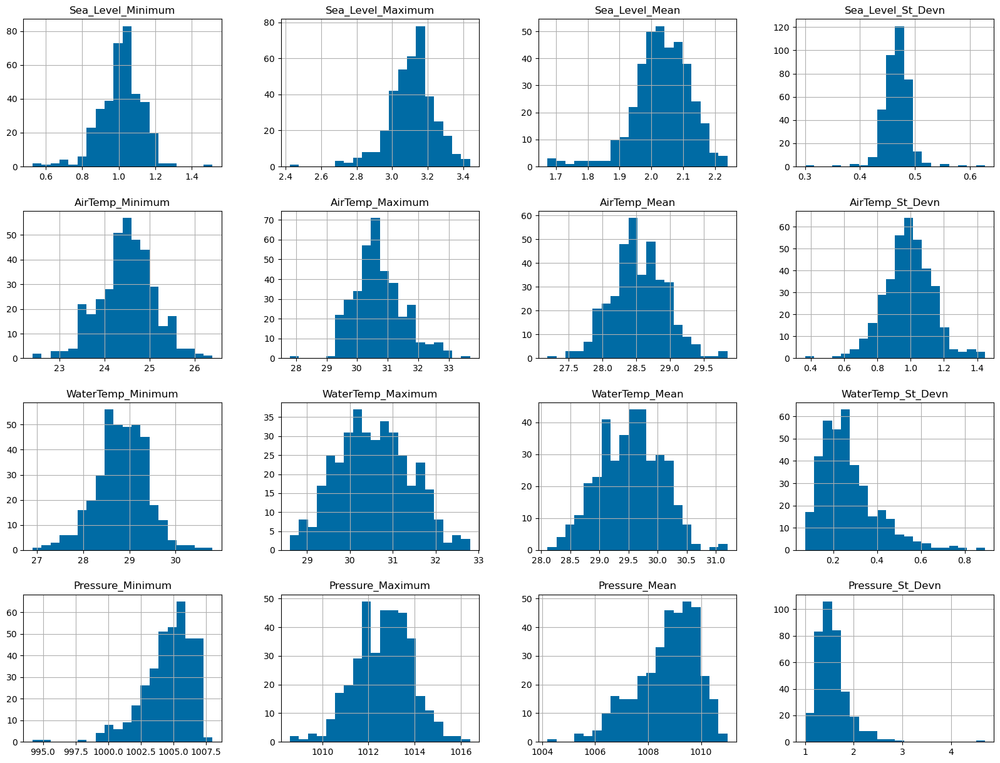

In [ ]:
# Plot histograms for each numerical column
df_numeric.hist(bins=20, figsize=(20, 15))
plt.show()

## Cook Islands

In [ ]:
cook_islands2 = cook_islands.applymap(lambda x: x if x >= 0 else None).dropna()
cook_islands2.drop(columns=['Country'], inplace=True)

In [ ]:
df_numeric = cook_islands2

# Summary statistics for the numerical columns
df_numeric.describe()

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
count,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.000000,365.00000,365.000000,365.000000,365.000000
mean,0.171951,1.075252,0.612536,0.207716,19.152466,28.016849,24.362010,1.641371,25.152354,27.194969,26.197359,0.427838,1006.26589,1018.973562,1013.393425,2.561096
std,0.078720,0.085371,0.068357,0.007565,2.297484,1.507711,1.657271,0.296281,1.603200,1.499332,1.478422,0.146926,3.69760,2.510827,2.316807,0.618016
min,0.000000,0.854000,0.459000,0.186000,14.100000,24.600000,20.755000,0.897000,22.100000,23.500000,23.338000,0.071000,977.30000,1012.200000,1004.200000,1.400000
25%,0.117000,1.015000,0.563000,0.203000,17.300000,26.700000,22.906000,1.451000,23.800000,25.900000,24.902000,0.328000,1004.40000,1017.000000,1011.600000,2.100000
50%,0.169000,1.075000,0.616000,0.208000,19.100000,28.100000,24.532000,1.624000,25.100000,27.300000,26.177091,0.395000,1006.80000,1019.000000,1013.500000,2.500000
75%,0.226000,1.134000,0.660000,0.212000,21.200000,29.300000,25.791000,1.839000,26.500000,28.500000,27.448000,0.501000,1008.70000,1020.800000,1015.200000,2.900000
max,0.381000,1.382000,0.817000,0.235000,23.500000,32.000000,27.530000,2.684000,28.300000,30.200000,28.909000,0.969000,1014.40000,1025.800000,1018.600000,5.500000


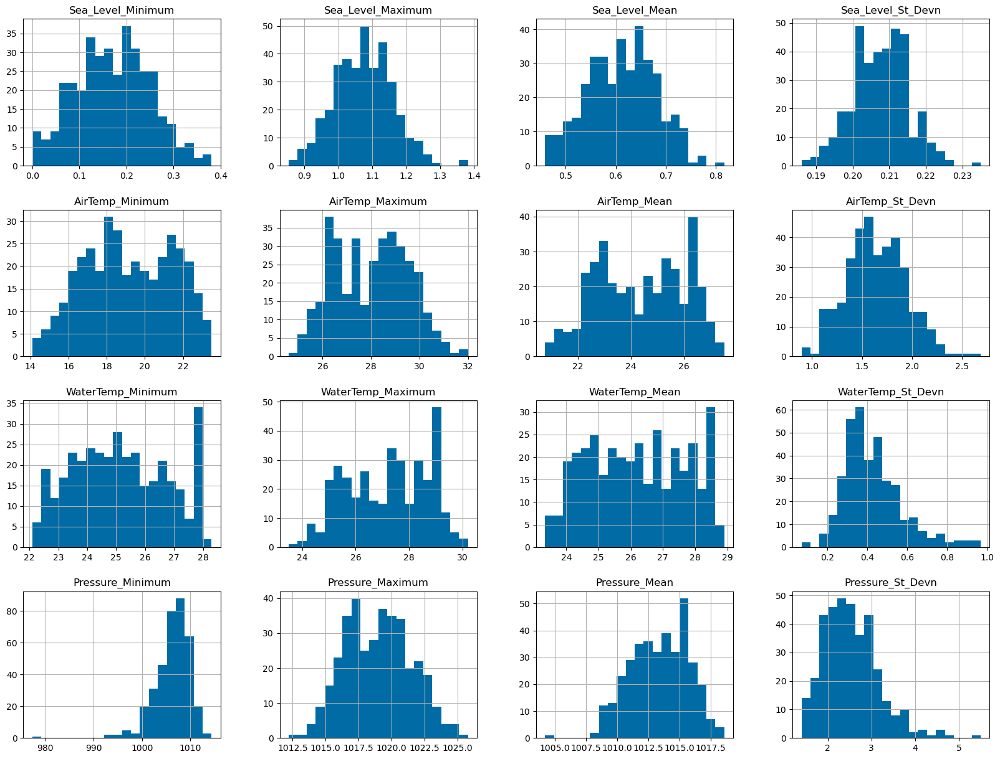

In [ ]:
# Plot histograms for each numerical column
df_numeric.hist(bins=20, figsize=(20, 15))
plt.show()

## Marshall Islands

In [ ]:
marshall_islands2 = marshall_islands.applymap(lambda x: x if x >= 0 else None).dropna()
marshall_islands2.drop(columns=['Country'], inplace=True)

In [ ]:
df_numeric = marshall_islands2

# Summary statistics for the numerical columns
df_numeric.describe()

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
count,348.000000,348.000000,348.000000,348.000000,348.000000,348.000000,348.000000,348.000000,348.000000,348.000000,348.000000,348.000000,348.000000,348.000000,348.000000,348.000000
mean,0.153918,2.115713,1.088555,0.437037,23.819611,30.789370,28.044426,1.156116,28.288075,29.369540,28.757838,0.180999,1005.045977,1013.029598,1009.065517,1.532328
std,0.082068,0.104681,0.068415,0.024388,0.916352,1.142438,0.545924,0.199998,0.546892,0.910220,0.649192,0.084274,1.189627,1.042832,0.826176,0.258294
min,0.003000,1.808000,0.898000,0.307000,17.500000,27.300000,26.043000,0.701000,26.500000,27.400000,26.990000,0.074000,1001.000000,1010.400000,1006.500000,1.100000
25%,0.092000,2.056179,1.044750,0.422000,23.475000,30.000000,27.740000,1.007870,27.900000,28.600000,28.296250,0.112750,1004.200000,1012.300000,1008.600000,1.300000
50%,0.153000,2.122000,1.089000,0.441000,23.900000,30.632000,28.049360,1.142000,28.200000,29.250000,28.645500,0.161500,1005.100000,1013.100000,1009.100000,1.500000
75%,0.206500,2.184000,1.129250,0.452000,24.400000,31.727083,28.414250,1.314250,28.600000,30.016667,29.181625,0.224250,1006.000000,1013.700000,1009.600000,1.700000
max,0.424000,2.405000,1.314000,0.541000,26.100000,33.600000,29.290000,2.141000,30.100000,31.800000,31.019000,0.509000,1008.800000,1016.600000,1012.600000,2.700000


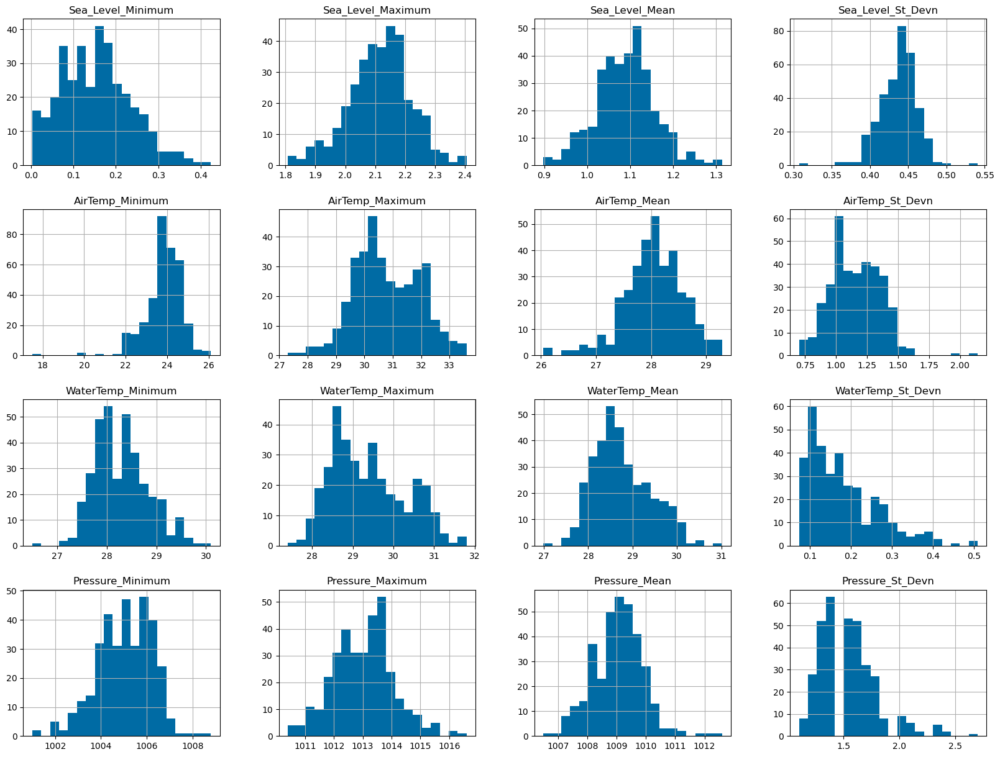

In [ ]:
# Plot histograms for each numerical column
df_numeric.hist(bins=20, figsize=(20, 15))
plt.show()

## Fiji

In [ ]:
fiji2 = fiji.applymap(lambda x: x if x >= 0 else None).dropna()
fiji2.drop(columns=['Country'], inplace=True)

In [ ]:
df_numeric = fiji2

# Summary statistics for the numerical columns
df_numeric.describe()

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
count,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000,377.000000
mean,0.220954,2.304581,1.277901,0.483286,21.440451,30.737931,26.112129,1.758176,27.449469,29.807958,28.541670,0.469906,1003.712997,1015.083422,1010.196950,2.160477
std,0.088394,0.100669,0.064911,0.013927,1.927527,1.496752,1.340034,0.217043,1.330693,1.545494,1.439434,0.177549,5.973110,2.339695,2.529412,0.693896
min,0.022000,2.047000,1.124000,0.422000,16.500000,26.600000,22.567000,0.294000,24.200000,25.600000,24.896000,0.097000,956.000000,1008.900000,1003.400000,1.100000
25%,0.162000,2.239000,1.237000,0.474000,19.900000,29.625000,25.115000,1.660000,26.500000,28.500000,27.347000,0.340000,1002.100000,1013.200000,1008.300000,1.700000
50%,0.216000,2.302000,1.277000,0.484000,21.800000,30.700000,26.422000,1.758000,27.500000,29.900000,28.696000,0.437000,1004.700000,1015.100000,1010.400000,2.000000
75%,0.280000,2.367000,1.323000,0.492000,23.000000,31.900000,27.163000,1.866000,28.500000,31.200000,29.811000,0.566000,1007.200000,1016.900000,1012.400000,2.400000
max,0.466000,2.777000,1.451000,0.556000,26.800000,33.900000,28.798000,2.545000,30.200000,33.000000,31.137000,1.180000,1010.600000,1020.300000,1015.000000,7.100000


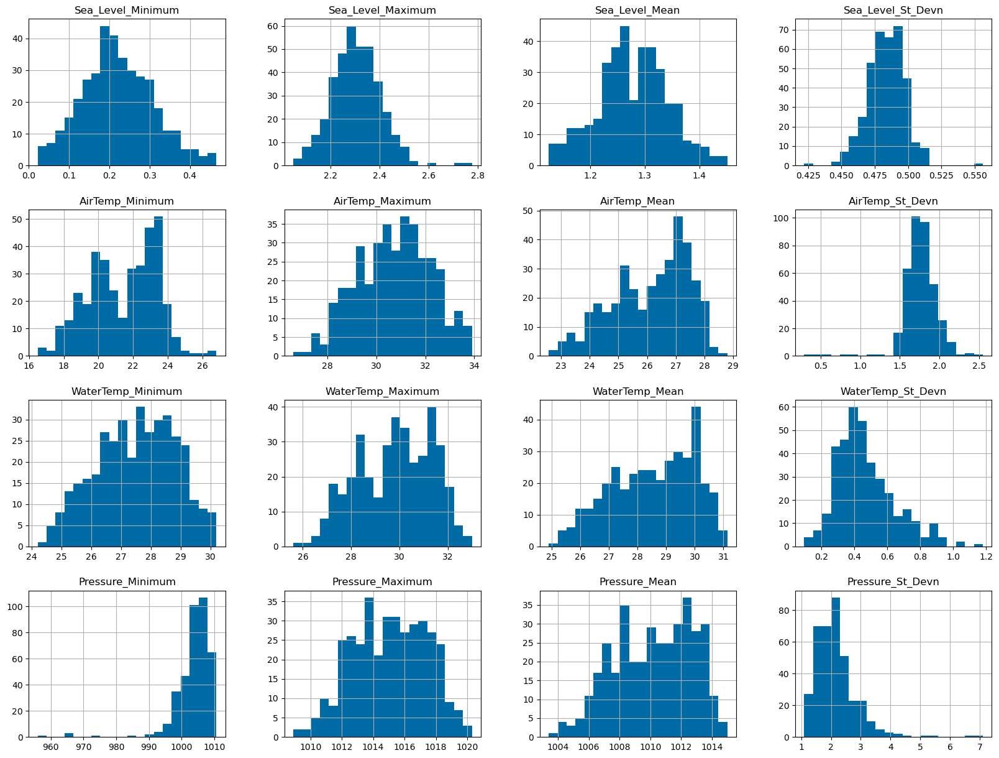

In [ ]:
# Plot histograms for each numerical column
df_numeric.hist(bins=20, figsize=(20, 15))
plt.show()

## Nauru

In [ ]:
nauru2 = nauru.applymap(lambda x: x if x >= 0 else None).dropna()
nauru2.drop(columns=['Country'], inplace=True)

In [ ]:
df_numeric = nauru2

# Summary statistics for the numerical columns
df_numeric.describe()

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
count,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000
mean,0.211981,1.537732,0.793151,0.282060,23.960425,31.271815,27.688504,1.490815,28.950965,30.345174,29.547863,0.223127,1005.082625,1013.113514,1009.203282,1.539382
std,0.094064,0.106005,0.086279,0.015883,0.509482,0.680048,0.348412,0.214872,0.641425,0.640997,0.535757,0.063230,1.353461,1.019953,0.813020,0.244938
min,0.013000,1.127000,0.568000,0.172000,22.600000,29.900000,26.886000,0.817000,27.300000,28.900000,28.236000,0.114000,996.700000,1010.000000,1006.700000,0.900000
25%,0.144250,1.466500,0.725000,0.276000,23.600000,30.800000,27.452500,1.364000,28.500000,29.808333,29.130500,0.178875,1004.300000,1012.500000,1008.700000,1.400000
50%,0.216000,1.541000,0.809000,0.284000,24.000000,31.100000,27.662000,1.501000,29.000000,30.300000,29.546000,0.208000,1005.200000,1013.100000,1009.200000,1.500000
75%,0.272000,1.605500,0.851000,0.291000,24.300000,31.700000,27.892500,1.638833,29.500000,30.800000,29.960125,0.258500,1006.000000,1013.800000,1009.800000,1.600000
max,0.601000,1.795000,1.021000,0.320000,26.900000,33.400000,28.829000,1.990000,30.400000,31.800000,30.758000,0.456000,1007.900000,1016.500000,1011.100000,2.800000


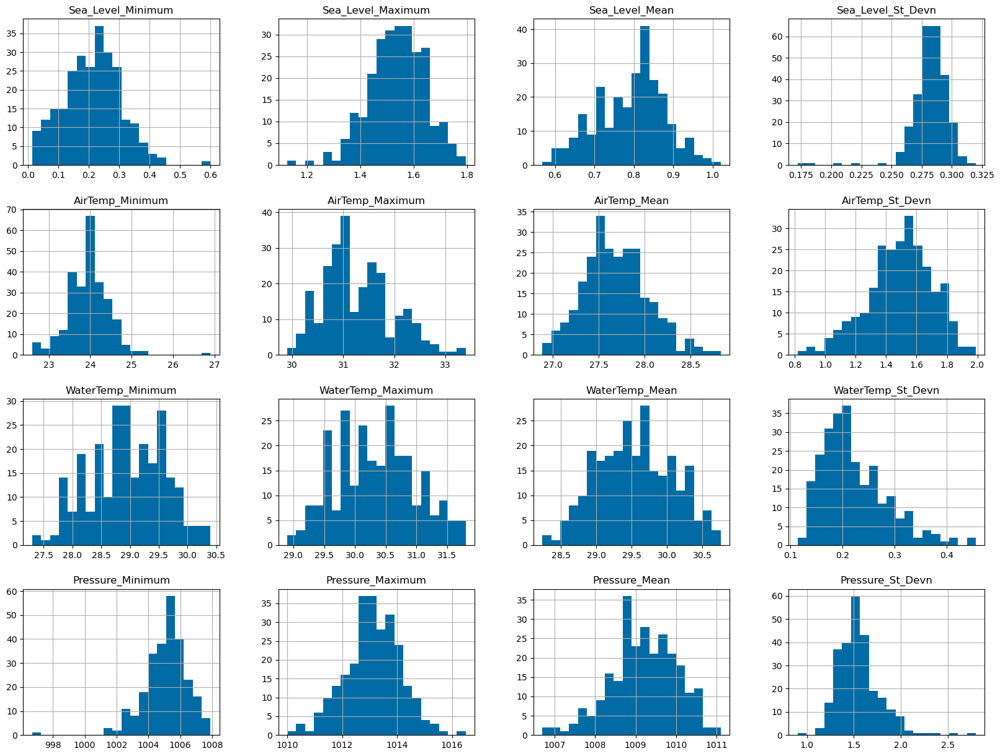

In [ ]:
# Plot histograms for each numerical column
df_numeric.hist(bins=20, figsize=(20, 15))
plt.show()

## Vanuatu

In [ ]:
vanuatu2 = vanuatu.applymap(lambda x: x if x >= 0 else None).dropna()
vanuatu2.drop(columns=['Country'], inplace=True)

In [ ]:
df_numeric = vanuatu2

# Summary statistics for the numerical columns
df_numeric.describe()

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
count,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000
mean,0.127370,1.559224,0.898471,0.311453,20.744543,30.303245,25.438819,1.896302,26.572870,28.533975,27.461881,0.389829,1003.718437,1015.694100,1010.630531,2.294395
std,0.080257,0.082447,0.066336,0.013720,2.021832,1.611534,1.527673,0.230869,1.396676,1.555718,1.444445,0.158141,6.789349,2.807918,2.918569,0.766803
min,0.000000,1.355000,0.742000,0.258000,16.100000,25.800000,21.443000,1.347000,23.300000,25.000000,24.125000,0.160000,942.900000,1009.200000,1002.500000,1.100000
25%,0.066000,1.502600,0.846500,0.302000,19.000000,29.200000,24.177000,1.747000,25.400000,27.200000,26.198500,0.270000,1001.900000,1013.500000,1008.200000,1.800000
50%,0.118000,1.556000,0.896000,0.310000,21.000000,30.400000,25.656000,1.906000,26.700000,28.800000,27.567000,0.374000,1004.900000,1015.600000,1010.800000,2.100000
75%,0.179500,1.615000,0.943500,0.319000,22.450000,31.400000,26.716000,2.040000,27.700000,29.800000,28.712000,0.482500,1007.700000,1017.700000,1013.200000,2.600000
max,0.453000,1.785000,1.105000,0.384000,24.800000,34.600000,29.126000,2.612000,29.300000,32.000000,30.214000,1.036000,1011.700000,1021.800000,1015.900000,8.600000


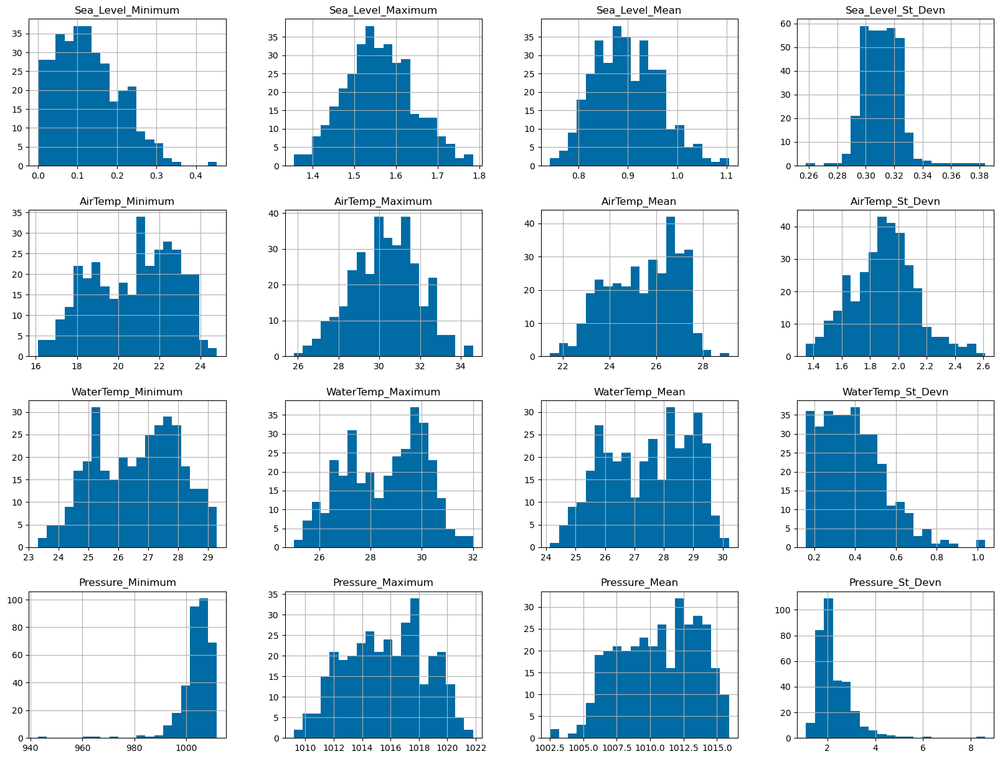

In [ ]:
# Plot histograms for each numerical column
df_numeric.hist(bins=20, figsize=(20, 15))
plt.show()

## All Countries:

In [ ]:
categorical_columns = ['Country', 'Mth', 'Year']
numerical_columns = all_countries.columns.difference(categorical_columns)

df_categorical = all_countries[categorical_columns]
df_numeric = all_countries[numerical_columns]

# Summary statistics for the numerical columns
df_numeric.describe()

,AirTemp_Maximum,AirTemp_Mean,AirTemp_Minimum,AirTemp_St_Devn,Pressure_Maximum,Pressure_Mean,Pressure_Minimum,Pressure_St_Devn,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_Minimum,Sea_Level_St_Devn,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_Minimum,WaterTemp_St_Devn
count,4356.000000,4356.000000,4356.000000,4356.000000,4356.000000,4356.000000,4356.000000,4356.000000,4356.000000,4356.000000,4356.000000,4356.000000,4356.000000,4356.000000,4356.000000,4356.000000
mean,30.391196,26.845534,22.638361,1.492478,1014.275195,1009.808437,1004.535158,1.888705,1.909519,1.103932,0.313118,0.357665,29.588441,28.488595,27.518343,0.391513
std,1.811756,1.798005,2.308350,0.444529,2.999308,2.519633,3.798574,0.641473,0.676054,0.425926,0.272731,0.112764,1.778887,1.767360,1.836840,0.197407
min,23.800000,20.520000,13.100000,0.294000,1008.100000,1002.500000,942.900000,0.900000,0.719000,0.387000,-0.771000,0.131000,22.600000,22.001000,20.900000,0.047000
25%,29.600000,26.211750,21.700000,1.145000,1012.200000,1008.100000,1003.300000,1.500000,1.340000,0.779000,0.138750,0.264750,28.800000,27.747750,26.500000,0.255000
50%,30.500000,27.326929,23.500000,1.526500,1013.500000,1009.200000,1004.800000,1.700000,1.737000,0.979000,0.236000,0.371000,30.000000,28.976000,28.085714,0.362000
75%,31.400000,28.056500,24.200000,1.824000,1015.700000,1011.000000,1006.400000,2.100000,2.457000,1.361250,0.390000,0.468762,30.900000,29.735000,28.877665,0.483000
max,36.400000,32.630000,28.200000,3.050000,1025.800000,1018.700000,1014.400000,8.600000,3.438000,2.240000,1.513000,0.627000,33.100000,31.783000,30.800000,1.672000


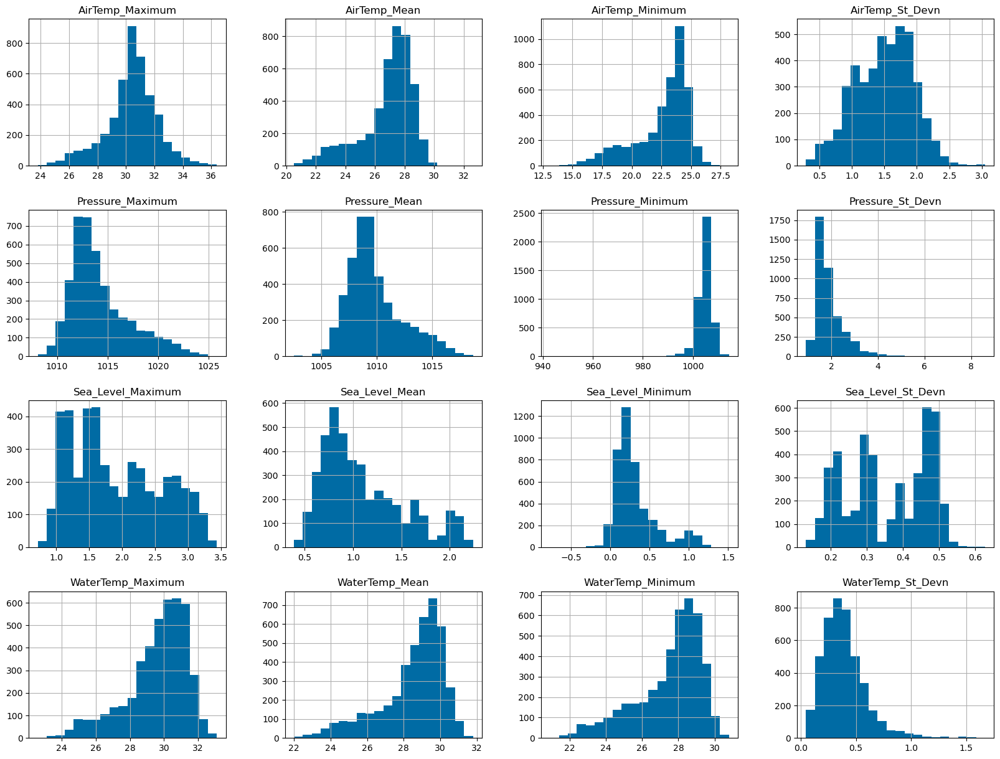

In [ ]:
# Plot histograms for each numerical column
df_numeric.hist(bins=20, figsize=(20, 15))
plt.show()

# Normalise data

In [ ]:
# MinMax Scaler
def normalise_column(col):
    return (col - col.min()) / (col.max() - col.min())

In [ ]:
# Standard Scaler
solomon_islands_std = solomon_islands
solomon_islands_norm = solomon_islands
solomon_islands_rbst = solomon_islands
standard_scaler = StandardScaler()
minmax_scaler = MinMaxScaler()
robust_scaler = RobustScaler()
solomon_islands_std1 = standard_scaler.fit_transform(solomon_islands_std)
solomon_islands_norm1 = minmax_scaler.fit_transform(solomon_islands_norm)
solomon_islands_rbst1 = robust_scaler.fit_transform(solomon_islands_rbst)

## Solomon Islands

In [ ]:
# Apply normalisation to all columns
solomon_islands_norm = solomon_islands.apply(normalise_column)
solomon_islands_norm = solomon_islands_norm.drop('Country', axis=1)
solomon_islands_norm

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
Date,,,,,,,,,,,,,,,,
1994-07-01,0.589181,0.220930,0.322528,0.000000,0.653846,0.000000,0.200349,0.189774,0.285714,0.000000,0.162729,0.002994,0.901515,0.311688,0.646341,0.047619
1994-08-01,0.364035,0.226744,0.293355,0.320312,0.403846,0.208333,0.190746,0.272370,0.314286,0.114286,0.160957,0.065868,0.780303,0.831169,0.768293,0.380952
1994-09-01,0.336257,0.175872,0.165316,0.171875,0.192308,0.291667,0.089262,0.357915,0.228571,0.114286,0.121382,0.185629,0.833333,0.831169,0.853659,0.380952
1994-10-01,0.381579,0.290698,0.243112,0.218750,0.230769,0.180556,0.183763,0.306785,0.171429,0.085714,0.114885,0.206587,0.795455,0.688312,0.829268,0.190476
1994-11-01,0.289474,0.325581,0.280389,0.492188,0.403846,0.194444,0.302052,0.328417,0.342857,0.371429,0.402835,0.456587,0.636364,0.597403,0.609756,0.428571
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,0.318713,0.645349,0.477715,0.755859,0.769231,0.444444,0.573549,0.013766,0.257143,0.657143,0.586828,0.634731,0.568182,0.415584,0.463415,0.380952
2024-01-01,0.366959,0.659884,0.517828,0.675781,0.788462,0.513889,0.567438,0.176008,0.600000,0.828571,0.773774,0.479042,0.545455,0.701299,0.439024,0.523810
2024-02-01,0.415205,0.674419,0.557942,0.595703,0.961538,0.916667,0.646879,0.340216,0.600000,0.542857,0.563497,0.260479,0.606061,0.415584,0.463415,0.333333


## Cook Islands

In [ ]:
# Apply normalisation to all columns
cook_islands_norm = cook_islands.apply(normalise_column)
cook_islands_norm = cook_islands_norm.drop('Country', axis=1)
cook_islands_norm

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
Date,,,,,,,,,,,,,,,,
1993-02-01,0.833333,0.181818,0.559194,0.314815,0.769231,0.513514,0.706421,0.501959,0.809524,0.835821,0.818345,0.177083,0.819407,0.176471,0.513889,0.023256
1993-03-01,0.425926,0.294805,0.317380,0.703704,0.682692,0.689189,0.753210,0.403470,0.714286,0.716418,0.701849,0.314394,0.722372,0.367647,0.520833,0.255814
1993-04-01,0.238683,0.157143,0.221662,0.462963,0.615385,0.554054,0.644280,0.457750,0.619048,0.641791,0.610124,0.203598,0.795148,0.389706,0.534722,0.116279
1993-05-01,0.547325,0.288312,0.390428,0.388889,0.471154,0.364865,0.364280,0.420257,0.412698,0.537313,0.451086,0.601326,0.789757,0.647059,0.763889,0.348837
1993-06-01,0.355967,0.041558,0.125945,0.388889,0.346154,0.243243,0.247675,0.339675,0.190476,0.223881,0.126907,0.305871,0.881402,0.522059,0.770833,0.093023
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,0.872428,0.338961,0.697733,0.185185,0.769231,0.540541,0.633506,0.118075,0.555556,0.507463,0.480704,0.113636,0.840970,0.470588,0.625000,0.232558
2024-01-01,0.905350,0.371429,0.806045,0.240741,0.903846,0.824324,0.820959,0.153330,0.698413,0.776119,0.706157,0.311553,0.808625,0.316176,0.576389,0.139535
2024-02-01,0.808642,0.503896,0.748111,0.500000,0.875000,0.756757,0.876900,0.307219,0.809524,0.776119,0.797523,0.285985,0.444744,0.308824,0.347222,0.534884


## Marshall Islands

In [ ]:
# Apply normalisation to all columns
marshall_islands_norm = marshall_islands.apply(normalise_column)
marshall_islands_norm = marshall_islands_norm.drop('Country', axis=1)
marshall_islands_norm

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
Date,,,,,,,,,,,,,,,,
1993-05-01,0.604230,0.108067,0.418060,0.371795,0.651163,0.380952,0.431167,0.363194,0.361111,0.255319,0.291636,0.017857,0.853448,0.467742,0.590164,0.076923
1993-06-01,0.709970,0.263318,0.516722,0.444444,0.697674,0.428571,0.523868,0.265972,0.416667,0.319149,0.335515,0.070055,0.698276,0.467742,0.491803,0.153846
1993-07-01,0.509063,0.401826,0.501672,0.521368,0.662791,0.523810,0.471512,0.317361,0.416667,0.425532,0.388121,0.097527,0.758621,0.258065,0.377049,0.000000
1993-08-01,0.596677,0.188737,0.434783,0.320513,0.732558,0.476190,0.619341,0.211111,0.555556,0.659574,0.538909,0.391484,0.732759,0.516129,0.573770,0.153846
1993-09-01,0.255287,0.412481,0.451505,0.594017,0.674419,0.603175,0.678472,0.256944,0.638889,0.723404,0.638788,0.284341,0.767241,0.645161,0.557377,0.192308
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,0.651057,0.331811,0.494983,0.405983,0.744186,0.793651,0.734832,0.454861,0.625000,0.617021,0.552364,0.184753,0.629310,0.483871,0.393443,0.307692
2024-01-01,0.504532,0.526636,0.538462,0.487179,0.883721,0.698413,0.730828,0.377083,0.583333,0.553191,0.504566,0.159799,0.594828,0.306452,0.426230,0.269231
2024-02-01,0.450151,0.759513,0.615385,0.628205,0.860465,0.793651,0.772713,0.385417,0.541667,0.489362,0.456768,0.134844,0.818966,0.548387,0.655738,0.115385


## Samoa

In [ ]:
# Apply normalisation to all columns
samoa_norm = samoa.apply(normalise_column)
samoa_norm = samoa_norm.drop('Country', axis=1)
samoa_norm

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
Date,,,,,,,,,,,,,,,,
1993-02-01,0.739444,0.000000,0.300000,0.030973,0.820896,0.266667,0.491258,0.112085,0.803922,0.527778,0.739572,0.032805,0.865772,0.363636,0.600000,0.000000
1993-03-01,0.349125,0.542045,0.400000,0.592920,0.686567,0.316667,0.435891,0.234815,0.588235,0.805556,0.629947,0.340498,0.781879,0.545455,0.566667,0.195122
1993-04-01,0.503605,0.530682,0.424615,0.504425,0.776119,0.416667,0.548567,0.278647,0.725490,0.777778,0.761765,0.306561,0.751678,0.414141,0.508333,0.121951
1993-05-01,0.477858,0.447727,0.396923,0.526549,0.701493,0.200000,0.481302,0.031935,0.509804,0.666667,0.532353,0.452489,0.825503,0.707071,0.683333,0.195122
1993-06-01,0.503605,0.477273,0.407692,0.557522,0.388060,0.133333,0.220495,0.381340,0.470588,0.194444,0.325668,0.092760,0.798658,0.717172,0.691667,0.146341
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,0.705458,0.562500,0.676923,0.438053,0.791045,0.650000,0.750850,0.368190,0.666667,0.694444,0.694920,0.211538,0.664430,0.676768,0.441667,0.414634
2024-01-01,0.642636,0.648864,0.675385,0.473451,0.835821,0.750000,0.866683,0.400751,0.823529,0.833333,0.838235,0.229638,0.738255,0.474747,0.483333,0.146341
2024-02-01,0.619979,0.787500,0.658462,0.588496,0.805970,0.766667,0.867654,0.303068,0.745098,0.722222,0.753476,0.231900,0.533557,0.575758,0.358333,0.585366


## Tonga

In [ ]:
# Apply normalisation to all columns
tonga_norm = tonga.apply(normalise_column)
tonga_norm = tonga_norm.drop('Country', axis=1)
tonga_norm

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
Date,,,,,,,,,,,,,,,,
1993-01-01,0.5648,0.000000,0.249501,0.021053,0.808989,0.416667,0.602349,0.040989,0.692308,0.367816,0.525118,0.027159,0.862369,0.345865,0.371212,0.106383
1993-02-01,0.3280,0.261981,0.345309,0.684211,0.876404,0.642857,0.769357,0.212014,0.738462,0.747126,0.739953,0.467967,0.787456,0.037594,0.174242,0.170213
1993-03-01,0.3568,0.264377,0.373253,0.642105,0.797753,0.702381,0.780281,0.263604,0.846154,0.885057,0.796986,0.463092,0.757840,0.323308,0.363636,0.361702
1993-04-01,0.3312,0.256390,0.357285,0.663158,0.595506,0.571429,0.572989,0.400000,0.615385,0.735632,0.621897,0.633008,0.817073,0.406015,0.500000,0.234043
1993-05-01,0.3200,0.174121,0.133733,0.694737,0.415730,0.369048,0.365151,0.495406,0.384615,0.471264,0.390810,0.538997,0.928571,0.744361,0.772727,0.297872
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,0.8704,0.322684,0.796407,0.347368,0.797753,0.726190,0.791479,0.208481,0.861538,0.712644,0.776596,0.314763,0.796167,0.503759,0.477273,0.468085
2024-01-01,0.8000,0.376997,0.900200,0.305263,0.898876,0.750000,0.871091,0.091873,0.876923,0.678161,0.822695,0.241643,0.796167,0.338346,0.303030,0.340426
2024-02-01,0.8752,0.446486,0.890220,0.389474,0.966292,0.738095,0.930083,0.096113,0.923077,0.758621,0.874704,0.311281,0.803136,0.233083,0.219697,0.319149


## Nauru

In [ ]:
# Apply normalisation to all columns
nauru_norm = nauru.apply(normalise_column)
nauru_norm = nauru_norm.drop('Country', axis=1)
nauru_norm

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
Date,,,,,,,,,,,,,,,,
2001-12-01,0.179191,0.434132,0.116667,0.750000,0.581395,0.416667,0.613999,0.173913,0.34375,0.931034,0.264869,0.350649,0.428571,0.369231,0.326087,0.894737
2002-01-01,0.167630,0.619760,0.366667,0.804054,0.418605,0.194444,0.398353,0.163683,0.12500,0.172414,0.177240,0.395176,0.741071,0.415385,0.521739,0.263158
2002-02-01,0.226879,0.618263,0.406250,0.675676,0.372093,0.194444,0.285641,0.304348,0.28125,0.137931,0.178826,0.133581,0.607143,0.523077,0.543478,0.526316
2002-03-01,0.274566,0.502994,0.381250,0.891892,0.279070,0.138889,0.592383,0.306905,0.40625,0.275862,0.266455,0.150278,0.714286,0.492308,0.543478,0.421053
2002-04-01,0.364162,0.507485,0.422917,0.743243,0.232558,0.138889,0.050437,0.550725,0.46875,0.517241,0.346947,0.179963,0.803571,0.584615,0.543478,0.368421
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,0.369942,0.498503,0.464583,0.925676,0.604651,0.555556,1.000000,0.340153,0.53125,0.379310,0.460349,0.183673,0.660714,0.461538,0.478261,0.421053
2024-01-01,0.328035,0.579341,0.468750,0.804054,0.558140,0.555556,0.949048,0.410060,0.21875,0.310345,0.297780,0.428571,0.714286,0.507692,0.478261,0.526316
2024-02-01,0.333815,0.694611,0.475000,0.912162,0.372093,0.472222,0.672156,0.294970,0.37500,0.310345,0.287074,0.261596,0.875000,0.615385,0.826087,0.315789


## Fiji

In [ ]:
# Apply normalisation to all columns
fiji_norm = fiji.apply(normalise_column)
fiji_norm = fiji_norm.drop('Country', axis=1)
fiji_norm

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
Date,,,,,,,,,,,,,,,,
1992-10-01,0.451923,0.275342,0.385870,1.000000,0.427184,0.356164,0.407158,0.725011,0.383333,0.405405,0.388720,0.296399,0.919414,0.333333,0.482759,0.033333
1992-11-01,0.500000,0.201370,0.366848,0.380597,0.339806,0.520548,0.495908,0.703243,0.383333,0.567568,0.476366,0.577101,0.890110,0.543860,0.612069,0.116667
1992-12-01,0.636538,0.769863,0.543478,0.388060,0.553398,0.698630,0.684481,0.593514,0.316667,0.581081,0.624579,0.484765,0.714286,0.263158,0.198276,0.350000
1993-01-01,0.184615,0.154795,0.233696,0.432836,0.436893,0.616438,0.622853,0.639271,0.450000,0.608108,0.599103,0.565097,0.172161,0.438596,0.362069,0.933333
1993-02-01,0.200000,0.305479,0.309783,0.597015,0.679612,0.602740,0.653988,0.560640,0.550000,0.662162,0.657587,0.364728,0.604396,0.219298,0.275862,0.250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,0.826923,0.261644,0.709239,0.223881,0.611650,0.821918,0.853154,0.705908,0.800000,0.905405,0.844736,0.596491,0.862637,0.473684,0.517241,0.216667
2024-01-01,0.582692,0.382192,0.663043,0.231343,0.699029,0.849315,0.863104,0.645047,0.900000,0.797297,0.908188,0.196676,0.857143,0.491228,0.379310,0.200000
2024-02-01,0.517308,0.568493,0.608696,0.365672,0.825243,0.917808,0.948162,0.597512,0.983333,0.905405,0.954014,0.264081,0.789377,0.403509,0.258621,0.316667


## Kiribati

In [ ]:
# Apply normalisation to all columns
kiribati_norm = kiribati.apply(normalise_column)
kiribati_norm = kiribati_norm.drop('Country', axis=1)
kiribati_norm
kiribati_std = kiribati
standard_scaler.fit_transform(kiribati_std)

array([[ 0.        ,  0.80890198, -0.90149009, ..., -1.88945747,
        -1.34501612, -1.38926357],
       [ 0.        ,  1.3682022 , -1.84657948, ..., -1.65408982,
        -0.65858881, -1.50569179],
       [ 0.        ,  1.92750242, -2.79166887, ..., -1.41872218,
         0.02783849, -1.62212001],
       ...,
       [ 0.        , -0.96487871,  0.68077246, ...,  0.40537706,
         0.93103232, -0.69069422],
       [ 0.        , -2.02914712,  1.15636583, ...,  2.78847446,
         0.82264906,  1.75429847],
       [ 0.        , -0.97446671, -0.36187454, ...,  0.3171142 ,
         0.06396625, -0.34140955]])

## Tuvalu

In [ ]:
# Apply normalisation to all columns
tuvalu_norm = tuvalu.apply(normalise_column)
tuvalu_norm = tuvalu_norm.drop('Country', axis=1)
tuvalu_norm

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
Date,,,,,,,,,,,,,,,,
1993-03-01,0.753550,0.368213,0.587302,0.296636,0.625,0.305085,0.163793,0.587419,0.410256,0.214286,0.316537,0.147202,0.869565,0.384615,0.705882,0.054054
1993-04-01,1.000000,0.000000,0.499118,0.000000,0.875,0.000000,0.000000,0.000000,0.589744,0.285714,0.445413,0.132603,0.884058,0.102564,0.514706,0.000000
1993-05-01,0.521298,0.283317,0.354497,0.330275,0.425,0.423729,0.257871,0.713228,0.410256,0.357143,0.290698,0.155718,0.833333,0.602564,0.764706,0.189189
1993-06-01,0.425963,0.449161,0.386243,0.489297,0.400,0.338983,0.375937,0.468085,0.384615,0.190476,0.236111,0.083942,0.746377,0.564103,0.735294,0.162162
1993-07-01,0.402637,0.526160,0.421517,0.489297,0.325,0.305085,0.122939,0.689177,0.179487,0.071429,0.084625,0.246959,0.818841,0.448718,0.676471,0.054054
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,0.597363,0.534057,0.615520,0.400612,0.775,0.864407,0.917166,0.641998,0.871795,0.880952,0.943152,0.345499,0.862319,0.602564,0.838235,0.162162
2024-01-01,0.520284,0.687068,0.694885,0.437309,0.600,0.898305,0.977511,0.784459,0.948718,0.714286,0.989018,0.048662,0.862319,0.602564,0.838235,0.162162
2024-02-01,0.480730,0.942744,0.781305,0.544343,0.625,0.796610,0.737256,0.554117,0.641026,0.500000,0.633398,0.244526,0.862319,0.602564,0.838235,0.162162


## Vanuatu

In [ ]:
# Apply normalisation to all columns
vanuatu_norm = vanuatu.apply(normalise_column)
vanuatu_norm = vanuatu_norm.drop('Country', axis=1)
vanuatu_norm

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
Date,,,,,,,,,,,,,,,,
1993-01-01,0.800654,0.123239,0.402469,0.000000,0.656250,0.431818,0.547573,0.430685,0.600000,0.457143,0.558877,0.061644,0.930233,0.429630,0.589552,0.053333
1993-02-01,0.691993,0.253521,0.227160,0.309524,0.604167,0.659091,0.609788,0.573209,0.633333,0.657143,0.653966,0.361872,0.873547,0.311111,0.380597,0.080000
1993-03-01,0.644608,0.295775,0.316049,0.420635,0.833333,0.738636,0.720682,0.259346,0.650000,0.700000,0.752012,0.525114,0.585756,0.311111,0.395522,0.226667
1993-04-01,0.654739,0.322359,0.342716,0.478571,0.822917,0.465909,0.578550,0.021028,0.666667,0.400000,0.552800,0.004566,0.875000,0.533333,0.641791,0.186667
1993-05-01,0.664869,0.348944,0.369383,0.536508,0.802083,0.457071,0.576236,0.080305,0.657407,0.400000,0.551833,0.005327,0.886628,0.614815,0.691542,0.213333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,0.771242,0.422535,0.619753,0.436508,0.625000,0.659091,0.717819,0.374611,0.566667,0.557143,0.565282,0.347032,0.904070,0.533333,0.597015,0.120000
2024-01-01,0.694444,0.478873,0.646914,0.468254,0.781250,0.772727,0.811922,0.454829,0.783333,0.785714,0.812120,0.448630,0.869186,0.414815,0.395522,0.133333
2024-02-01,0.690359,0.512324,0.444444,0.428571,1.000000,0.795455,0.879734,0.172897,0.750000,0.771429,0.797339,0.473744,0.790698,0.311111,0.268657,0.226667


## Papua New Guinea

In [ ]:
# Apply normalisation to all columns
png_norm = png.apply(normalise_column)
png_norm = png_norm.drop('Country', axis=1)
png_norm

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
Date,,,,,,,,,,,,,,,,
1994-09-01,0.441275,0.095201,0.264766,0.385135,1.000000,0.111111,0.529368,0.201646,0.400000,0.114286,0.211672,0.100242,1.000000,0.602564,0.830986,0.066667
1994-10-01,0.320470,0.176239,0.362525,0.297297,0.540541,0.444444,0.323232,0.669753,0.366667,0.342857,0.294098,0.241546,0.560440,0.743590,0.661972,0.400000
1994-11-01,0.320470,0.210071,0.405295,0.520270,0.567568,0.555556,0.356528,0.730453,0.700000,0.600000,0.595120,0.123188,0.461538,0.666667,0.464789,0.466667
1994-12-01,0.115772,0.261998,0.299389,0.790541,0.648649,0.722222,0.209502,0.625514,0.333333,0.257143,0.300363,0.161836,0.417582,0.564103,0.422535,0.533333
1995-01-01,0.057047,0.179386,0.228106,0.594595,0.540541,0.444444,0.218107,0.647119,0.200000,0.400000,0.330696,0.368357,0.505495,0.474359,0.422535,0.266667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,0.290268,0.332809,0.439919,0.891892,0.810811,0.694444,0.564908,0.551440,0.833333,0.542857,0.652489,0.020531,0.340659,0.666667,0.366197,0.600000
2024-01-01,0.258389,0.349331,0.521385,0.810811,0.810811,0.694444,0.564908,0.551440,0.833333,0.542857,0.652489,0.020531,0.296703,0.564103,0.338028,0.666667
2024-02-01,0.342282,0.386310,0.588595,0.918919,0.810811,0.694444,0.564908,0.551440,0.833333,0.542857,0.652489,0.020531,0.615385,0.576923,0.549296,0.333333


## FSM

In [ ]:
# Apply normalisation to all columns
fsm_norm = fsm.apply(normalise_column)
fsm_norm = fsm_norm.drop('Country', axis=1)
fsm_norm

,Sea_Level_Minimum,Sea_Level_Maximum,Sea_Level_Mean,Sea_Level_St_Devn,AirTemp_Minimum,AirTemp_Maximum,AirTemp_Mean,AirTemp_St_Devn,WaterTemp_Minimum,WaterTemp_Maximum,WaterTemp_Mean,WaterTemp_St_Devn,Pressure_Minimum,Pressure_Maximum,Pressure_Mean,Pressure_St_Devn
Date,,,,,,,,,,,,,,,,
2001-12-01,0.179191,0.434132,0.116667,0.750000,0.581395,0.416667,0.613999,0.173913,0.34375,0.931034,0.264869,0.350649,0.428571,0.369231,0.326087,0.894737
2002-01-01,0.167630,0.619760,0.366667,0.804054,0.418605,0.194444,0.398353,0.163683,0.12500,0.172414,0.177240,0.395176,0.741071,0.415385,0.521739,0.263158
2002-02-01,0.226879,0.618263,0.406250,0.675676,0.372093,0.194444,0.285641,0.304348,0.28125,0.137931,0.178826,0.133581,0.607143,0.523077,0.543478,0.526316
2002-03-01,0.274566,0.502994,0.381250,0.891892,0.279070,0.138889,0.592383,0.306905,0.40625,0.275862,0.266455,0.150278,0.714286,0.492308,0.543478,0.421053
2002-04-01,0.364162,0.507485,0.422917,0.743243,0.232558,0.138889,0.050437,0.550725,0.46875,0.517241,0.346947,0.179963,0.803571,0.584615,0.543478,0.368421
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-01,0.369942,0.498503,0.464583,0.925676,0.604651,0.555556,1.000000,0.340153,0.53125,0.379310,0.460349,0.183673,0.660714,0.461538,0.478261,0.421053
2024-01-01,0.328035,0.579341,0.468750,0.804054,0.558140,0.555556,0.949048,0.410060,0.21875,0.310345,0.297780,0.428571,0.714286,0.507692,0.478261,0.526316
2024-02-01,0.333815,0.694611,0.475000,0.912162,0.372093,0.472222,0.672156,0.294970,0.37500,0.310345,0.287074,0.261596,0.875000,0.615385,0.826087,0.315789


# Explore Data Again

Check if data augmentation worked well

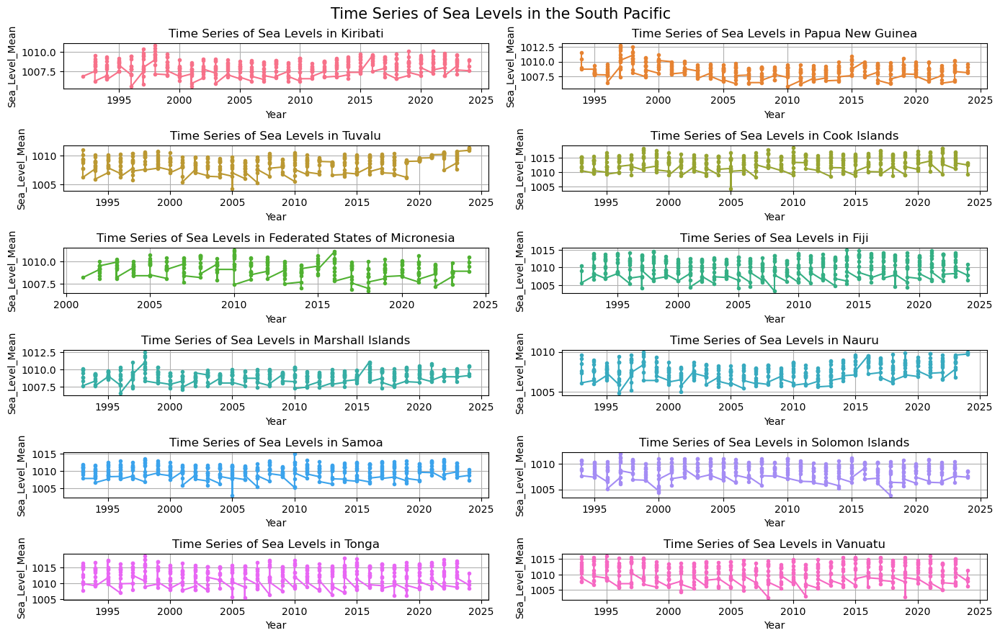

In [ ]:
# Plotting time series for Bar_Pressure_Mean for each country with different colors
plt.figure(figsize=(14, 10))

# Define a color palette
colors = sns.color_palette('husl', n_colors=len(all_countries['Country'].unique()))

for i, country in enumerate(all_countries['Country'].unique(), 1):
    plt.subplot(len(all_countries['Country'].unique()) // 2 + 1, 2, i)
    plt.plot(all_countries[all_countries['Country'] == country]['Year'], all_countries[all_countries['Country'] == country]['Pressure_Mean'], marker='.', linestyle='-', color=colors[i-1])
    plt.title(f'Time Series of Sea Levels in {country}')
    plt.xlabel('Year')
    plt.ylabel('Sea_Level_Mean')
    # plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.grid(True)

plt.suptitle('Time Series of Sea Levels in the South Pacific', fontsize = 15)
plt.tight_layout()
plt.savefig('images/time-series-SLT.png')

plt.show()
plt.close()

In [ ]:
# # Filter to include only the first month of each year
# first_month_data = solomon_islands[solomon_islands['Mth'] == 1]

# # Plot sea level trend with dots for the first month of each year
# plt.figure(figsize=(8, 4))
# plt.plot(first_month_data['Year'], first_month_data['Sea_Level_Mean'], marker='o', linestyle='-', color='b', label='Sea Level Mean')

# # Fit a linear trend line using np.polyfit
# slope, intercept = np.polyfit(first_month_data['Year'], first_month_data['Sea_Level_Mean'], 1)

# # Plot trend line
# plt.plot(first_month_data['Year'], slope * first_month_data['Year'] + intercept, linestyle='--', color='r', label='Line of best fit')

# # Add titles and labels
# plt.title('Sea Level Trend in Solomon Islands with Trend Line')
# plt.xlabel('Year')
# plt.ylabel('Sea Level (m)')

# # Add grid and legend
# plt.grid(True)
# plt.legend()

# # Ensure tight layout for better presentation
# plt.tight_layout()

# # Display the plot
# plt.show()

### All Countries
#### Sea Level

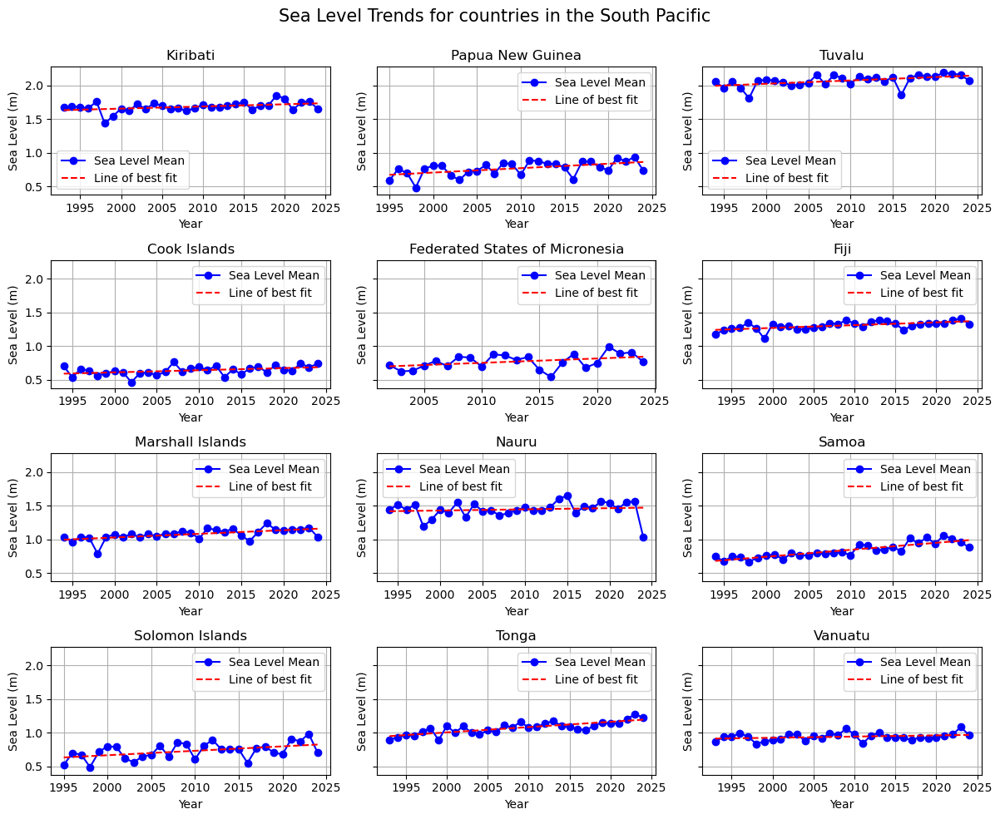

In [ ]:
# Filter to include only the first month of each year
first_month_data = all_countries[all_countries['Mth'] == 1]

# Get list of unique countries
countries = first_month_data['Country'].unique()

# Set up the figure and subplots
n_countries = len(countries)
n_cols = 3
n_rows = int(np.ceil(n_countries / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 2.5 * n_rows), sharey=True)
axes = axes.flatten()

for i, country in enumerate(countries):
    country_data = first_month_data[first_month_data['Country'] == country]

    axes[i].plot(country_data['Year'], country_data['Sea_Level_Mean'], marker='o', linestyle='-', color='b', label='Sea Level Mean')

    # Fit a linear trend line using np.polyfit
    if not country_data.empty and len(country_data) > 1:  # Ensure there is enough data to fit a line
        slope, intercept = np.polyfit(country_data['Year'], country_data['Sea_Level_Mean'], 1)
        axes[i].plot(country_data['Year'], slope * country_data['Year'] + intercept, linestyle='--', color='r', label='Line of best fit')

    axes[i].set_title(f'{country}')
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('Sea Level (m)')
    axes[i].grid(True)
    axes[i].legend()

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
fig.suptitle("Sea Level Trends for countries in the South Pacific", fontsize=15)
# plt.subplots_adjust(top=0.9)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.savefig('images/SLT.png')

plt.show()

#### Water Temperature Levels

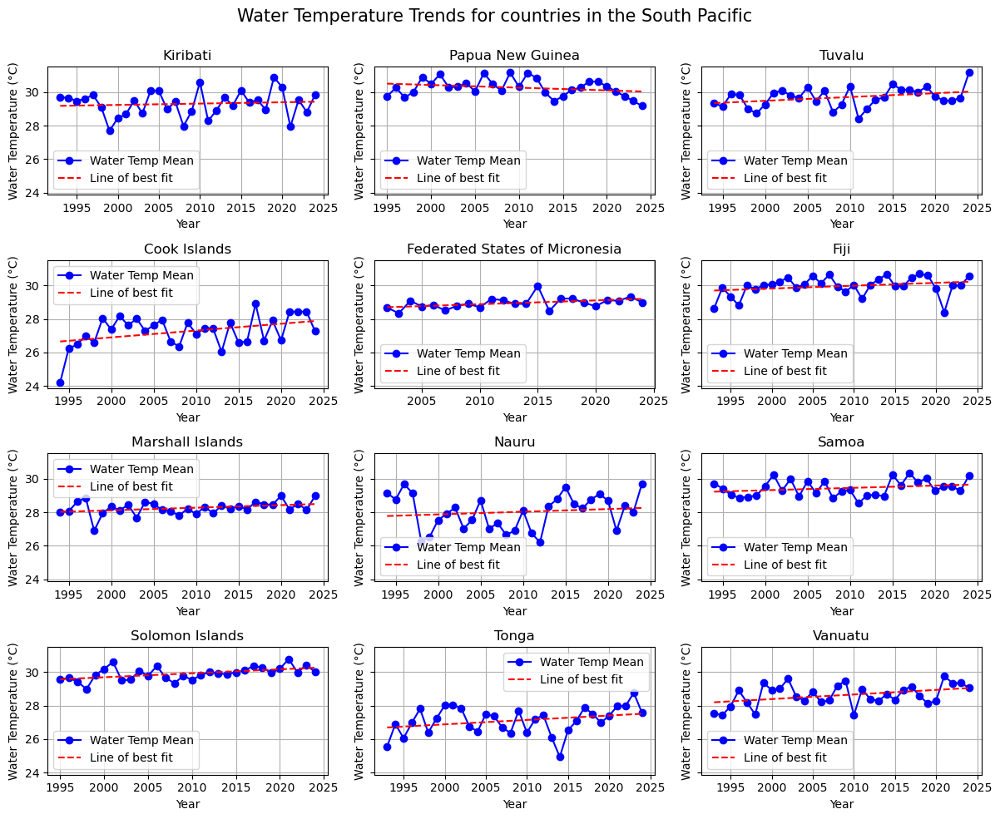

In [ ]:
# Filter to include only the first month of each year
# first_month_data = all_countries[all_countries['Mth'] == 1]

# Get list of unique countries
# countries = first_month_data['Country'].unique()

# Set up the figure and subplots
n_countries = len(countries)
n_cols = 3
n_rows = int(np.ceil(n_countries / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 2.5 * n_rows), sharey=True)
axes = axes.flatten()

for i, country in enumerate(countries):
    country_data = first_month_data[first_month_data['Country'] == country]

    axes[i].plot(country_data['Year'], country_data['WaterTemp_Mean'], marker='o', linestyle='-', color='b', label='Water Temp Mean')

    # Fit a linear trend line using np.polyfit
    if not country_data.empty and len(country_data) > 1:  # Ensure there is enough data to fit a line
        slope, intercept = np.polyfit(country_data['Year'], country_data['WaterTemp_Mean'], 1)
        axes[i].plot(country_data['Year'], slope * country_data['Year'] + intercept, linestyle='--', color='r', label='Line of best fit')

    axes[i].set_title(f'{country}')
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('Water Temperature (°C)')
    axes[i].grid(True)
    axes[i].legend()

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
fig.suptitle("Water Temperature Trends for countries in the South Pacific", fontsize=15)
# plt.subplots_adjust(top=0.9)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.savefig('images/WLT.png')
plt.show()

Changes in ocean temperatures and currents brought about by climate change will lead to alterations in climate patterns around the world. For example, warmer waters may promote the development of stronger storms in the tropics, which can cause property damage and loss of life.

#### Air Temperature Levels

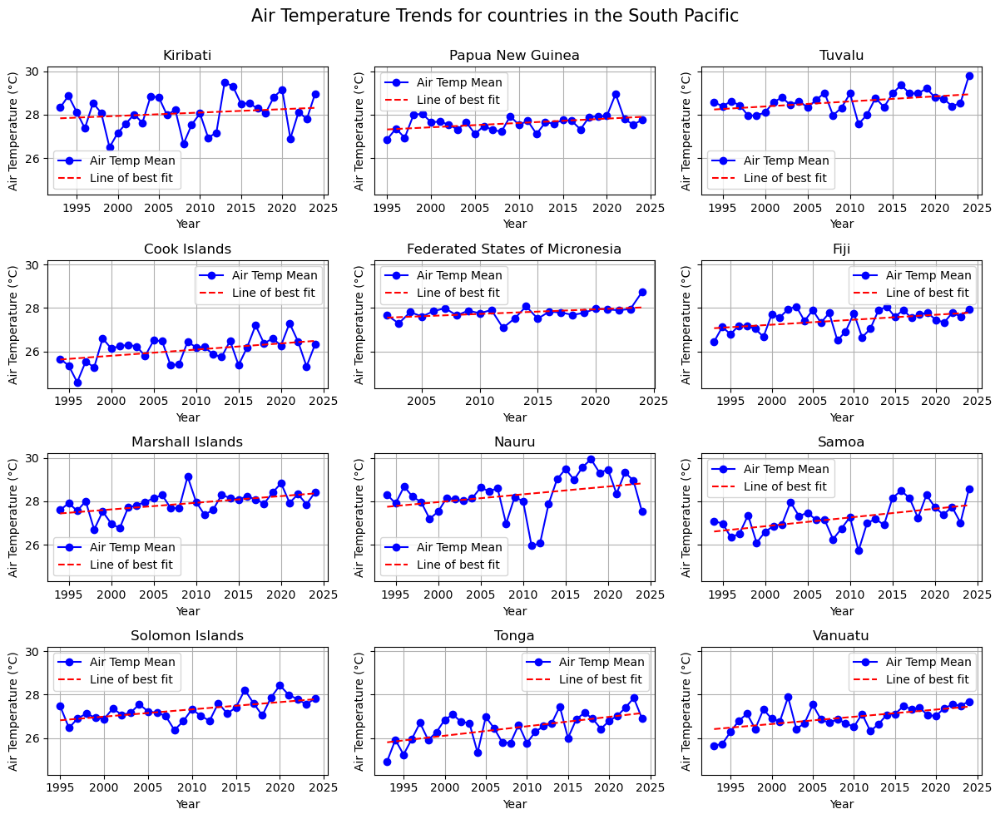

In [ ]:
# Filter to include only the first month of each year
# first_month_data = all_countries[all_countries['Mth'] == 1]

# Get list of unique countries
# countries = first_month_data['Country'].unique()

# Set up the figure and subplots
n_countries = len(countries)
n_cols = 3
n_rows = int(np.ceil(n_countries / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 2.5 * n_rows), sharey=True)
axes = axes.flatten()

for i, country in enumerate(countries):
    country_data = first_month_data[first_month_data['Country'] == country]

    axes[i].plot(country_data['Year'], country_data['AirTemp_Mean'], marker='o', linestyle='-', color='b', label='Air Temp Mean')

    # Fit a linear trend line using np.polyfit
    if not country_data.empty and len(country_data) > 1:  # Ensure there is enough data to fit a line
        slope, intercept = np.polyfit(country_data['Year'], country_data['AirTemp_Mean'], 1)
        axes[i].plot(country_data['Year'], slope * country_data['Year'] + intercept, linestyle='--', color='r', label='Line of best fit')

    axes[i].set_title(f'{country}')
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('Air Temperature (°C)')
    axes[i].grid(True)
    axes[i].legend()

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
fig.suptitle("Air Temperature Trends for countries in the South Pacific", fontsize=15)
# plt.subplots_adjust(top=0.9)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.savefig('images/ALT.png')
plt.show()

Higher temperatures increase the evaporation of water, which – together with the lack of precipitation – increases the risks of severe droughts.

#### Barometric Pressure Levels

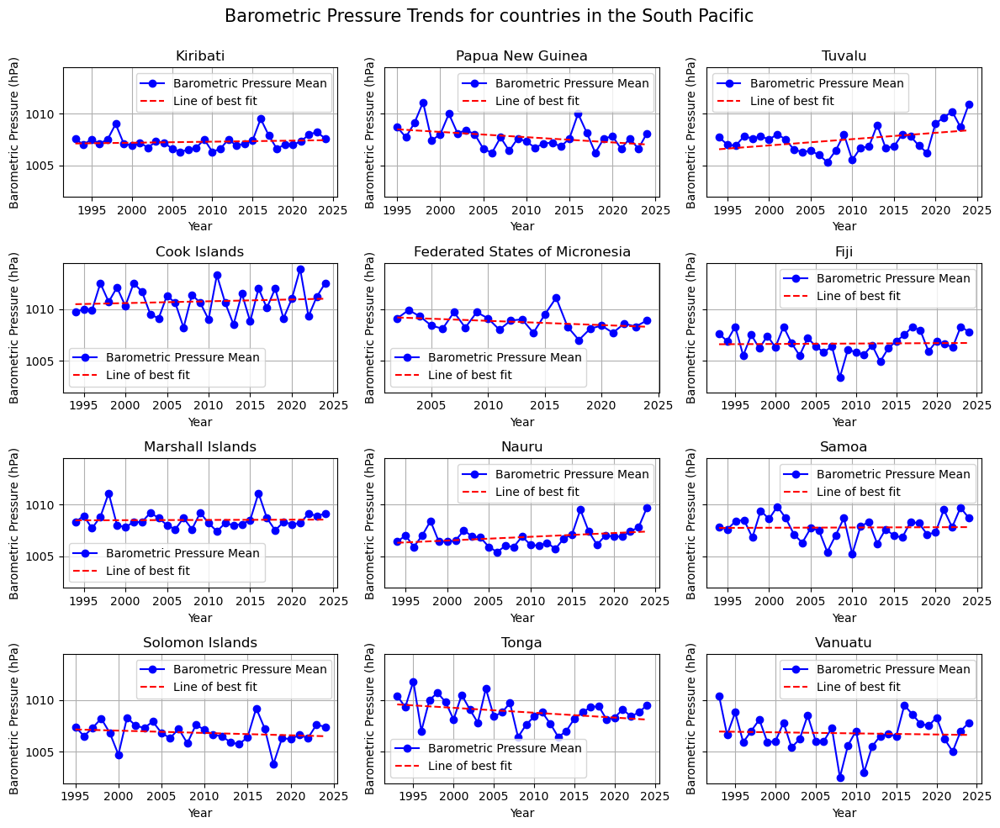

In [ ]:
# Filter to include only the first month of each year
# first_month_data = all_countries[all_countries['Mth'] == 1]

# Get list of unique countries
# countries = first_month_data['Country'].unique()

# Set up the figure and subplots
n_countries = len(countries)
n_cols = 3
n_rows = int(np.ceil(n_countries / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 2.5 * n_rows), sharey=True)
axes = axes.flatten()

for i, country in enumerate(countries):
    country_data = first_month_data[first_month_data['Country'] == country]

    axes[i].plot(country_data['Year'], country_data['Pressure_Mean'], marker='o', linestyle='-', color='b', label='Barometric Pressure Mean')

    # Fit a linear trend line using np.polyfit
    if not country_data.empty and len(country_data) > 1:  # Ensure there is enough data to fit a line
        slope, intercept = np.polyfit(country_data['Year'], country_data['Pressure_Mean'], 1)
        axes[i].plot(country_data['Year'], slope * country_data['Year'] + intercept, linestyle='--', color='r', label='Line of best fit')

    axes[i].set_title(f'{country}')
    axes[i].set_xlabel('Year')
    axes[i].set_ylabel('Barometric Pressure (hPa)')
    axes[i].grid(True)
    axes[i].legend()

# Remove any empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
fig.suptitle("Barometric Pressure Trends for countries in the South Pacific", fontsize=15)
# plt.subplots_adjust(top=0.9)
plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.savefig('images/BPT.png')
plt.show()

A rise in barometric pressure is generally considered an improvement in the weather, while a fall in barometric pressure may mean worsening weather.

### Correlation between features

In [ ]:
# Handle categorical data
label_encoder = LabelEncoder()
all_countries['Country'] = label_encoder.fit_transform(all_countries['Country'])

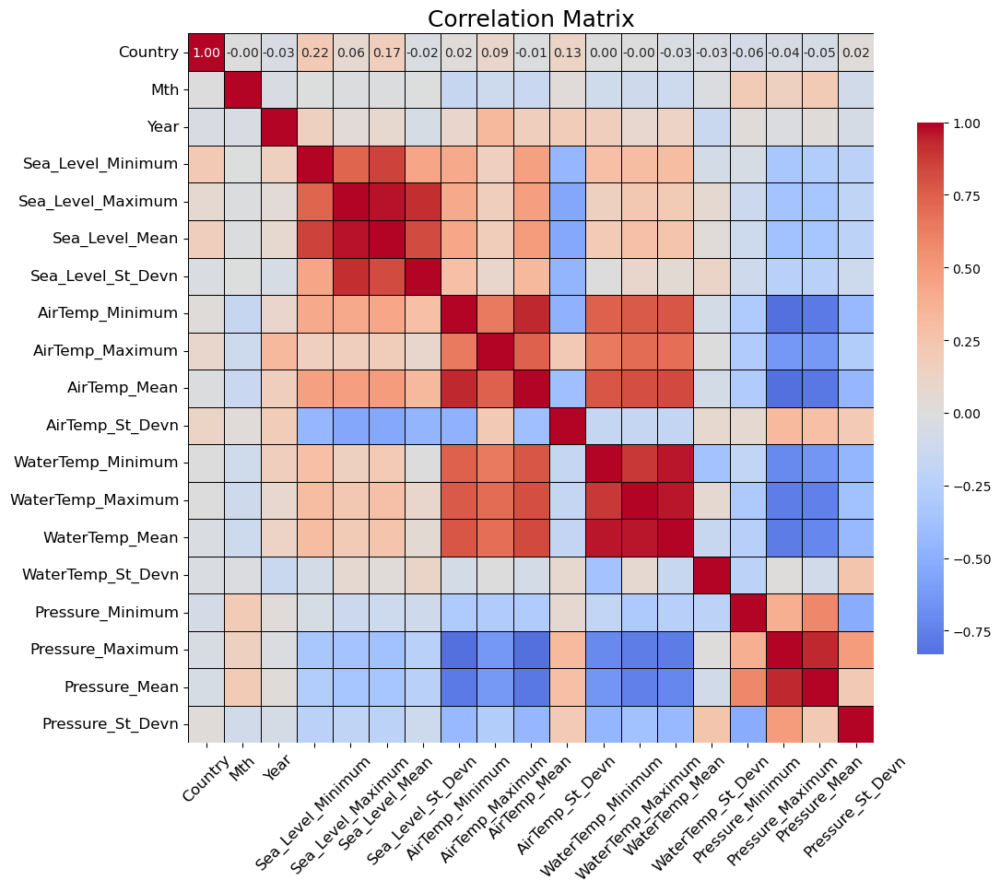

In [ ]:
corr_matrix = all_countries.corr()

plt.figure(figsize=(12, 10))

# Create the heatmap
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', center=0,
            linewidths=0.5, linecolor='black', cbar_kws={"shrink": 0.75})

# Customize the plot
plt.title('Correlation Matrix', fontsize=18)
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12, rotation=0)
plt.show()

In [ ]:
specific_feature = 'Sea_Level_Mean'
correlations_with_specific_feature = corr_matrix[specific_feature]

sorted_correlations = correlations_with_specific_feature.sort_values(ascending=False)

# Print the correlations
print(f"Correlations with {specific_feature}:")
print(sorted_correlations)

Correlations with Sea_Level_Mean:
Sea_Level_Mean       1.000000
Sea_Level_Maximum    0.968213
Sea_Level_Minimum    0.854022
Sea_Level_St_Devn    0.820396
AirTemp_Mean         0.486359
AirTemp_Minimum      0.430801
WaterTemp_Maximum    0.274412
WaterTemp_Mean       0.252068
WaterTemp_Minimum    0.211114
AirTemp_Maximum      0.170844
Country              0.166031
Year                 0.071180
WaterTemp_St_Devn    0.033478
Mth                 -0.015100
Pressure_Minimum    -0.112223
Pressure_St_Devn    -0.217736
Pressure_Mean       -0.349277
Pressure_Maximum    -0.374113
AirTemp_St_Devn     -0.540020
Name: Sea_Level_Mean, dtype: float64


In [ ]:
kiribati_corr = kiribati.drop(['Country'], axis = 1)
corr_matrix_kiribati = kiribati_corr.corr()

specific_feature = 'Sea_Level_Mean'
correlations_with_specific_feature = corr_matrix_kiribati[specific_feature]

sorted_correlations = correlations_with_specific_feature.sort_values(ascending=False)

correlation_table = pd.DataFrame(sorted_correlations).reset_index()
correlation_table.columns = ['Feature', 'Correlation']
correlation_table['Correlation'] = correlation_table['Correlation'].round(2)

# print("Correlations with target_feature:")
# print(correlation_table)
print(tabulate(correlation_table, headers='keys', tablefmt='pretty'))

+----+-------------------+-------------+
|    |      Feature      | Correlation |
+----+-------------------+-------------+
| 0  |  Sea_Level_Mean   |     1.0     |
| 1  | Sea_Level_Maximum |    0.69     |
| 2  | Sea_Level_Minimum |    0.66     |
| 3  |  WaterTemp_Mean   |    0.51     |
| 4  |  AirTemp_Maximum  |    0.51     |
| 5  | WaterTemp_Maximum |    0.47     |
| 6  |   AirTemp_Mean    |    0.44     |
| 7  |  AirTemp_St_Devn  |    0.43     |
| 8  | WaterTemp_Minimum |    0.34     |
| 9  | WaterTemp_St_Devn |    0.16     |
| 10 | Pressure_St_Devn  |    0.11     |
| 11 | Sea_Level_St_Devn |    0.02     |
| 12 |  AirTemp_Minimum  |    -0.11    |
| 13 | Pressure_Maximum  |    -0.13    |
| 14 |   Pressure_Mean   |    -0.21    |
| 15 | Pressure_Minimum  |    -0.24    |
+----+-------------------+-------------+


## Seasonality

### Kiribati

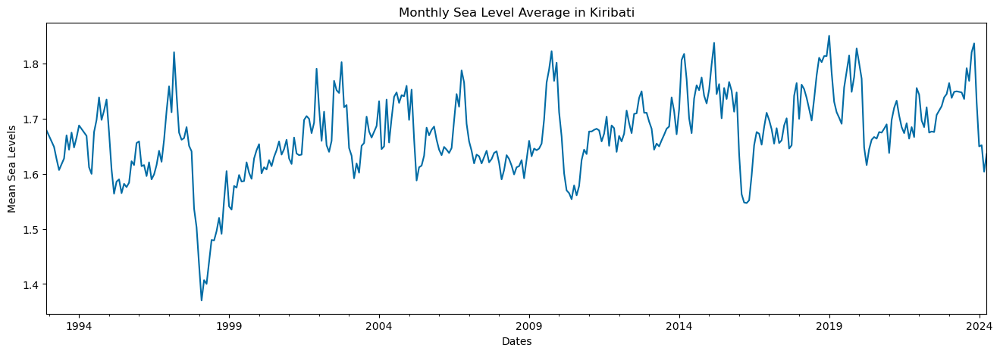

In [ ]:
kiribati.index.freq = 'MS'
ax = kiribati['Sea_Level_Mean'].plot(figsize = (16,5), title = "Monthly Sea Level Average in Kiribati")
ax.set(xlabel='Dates', ylabel='Mean Sea Levels');
plt.savefig('images/Kiribati-SLA.png')

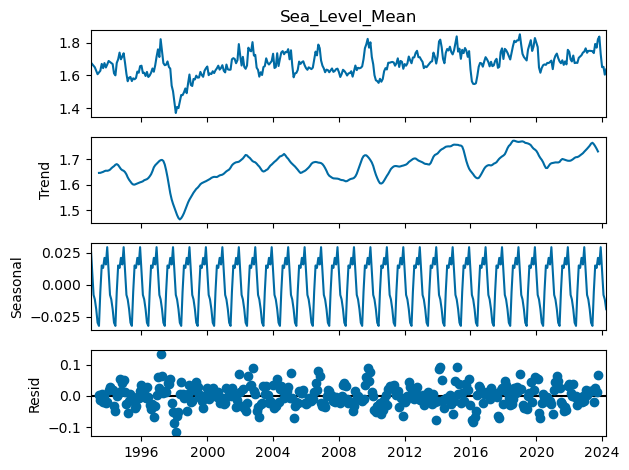

In [ ]:
decomposition = sm.tsa.seasonal_decompose(kiribati["Sea_Level_Mean"],period =12)
figure = decomposition.plot()
plt.savefig('images/Kiribati-season-decomp.png')
plt.show()

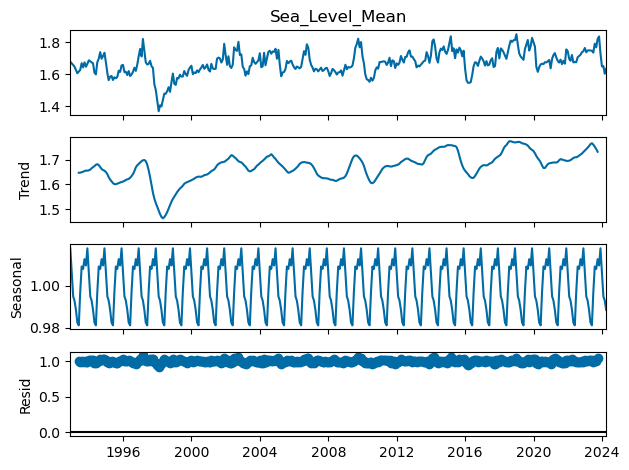

In [ ]:
decomposition = sm.tsa.seasonal_decompose(kiribati["Sea_Level_Mean"],period =12, model = 'multiplicative')
figure = decomposition.plot()
plt.show()

### Solomon Islands

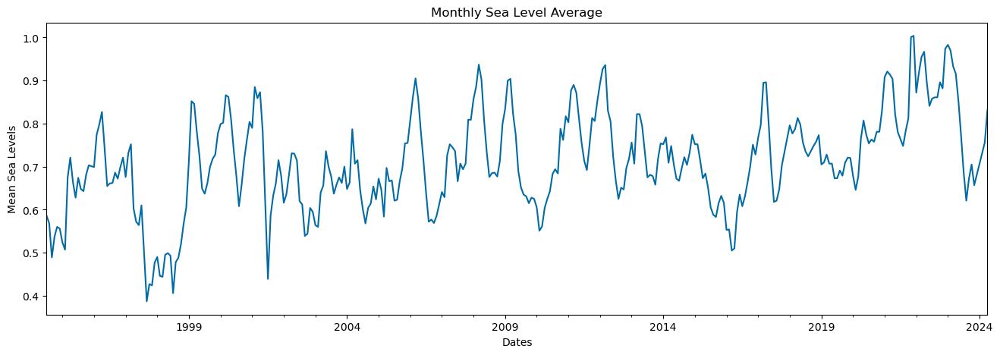

In [ ]:
solomon_islands.index.freq = 'MS'
ax = solomon_islands['Sea_Level_Mean'].plot(figsize = (16,5), title = "Monthly Sea Level Average")
ax.set(xlabel='Dates', ylabel='Mean Sea Levels');

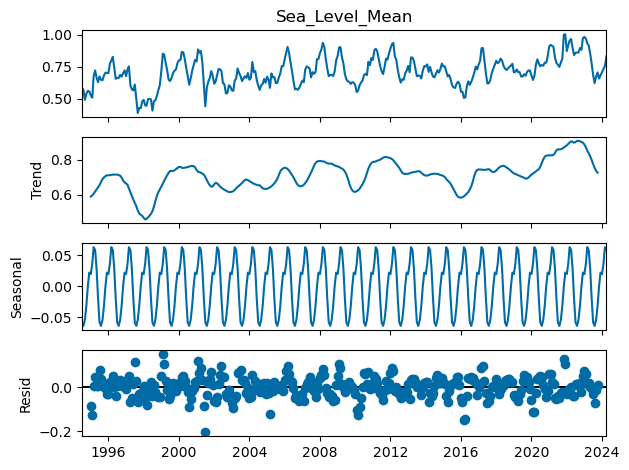

In [ ]:
decomposition = sm.tsa.seasonal_decompose(solomon_islands["Sea_Level_Mean"],period =12)
figure = decomposition.plot()
plt.show()

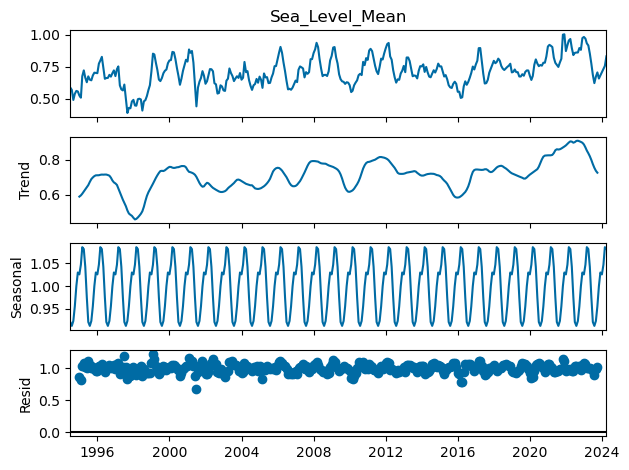

In [ ]:
decomposition = sm.tsa.seasonal_decompose(solomon_islands["Sea_Level_Mean"],period =12, model = 'multiplicative')
figure = decomposition.plot()
plt.show()

### Fiji

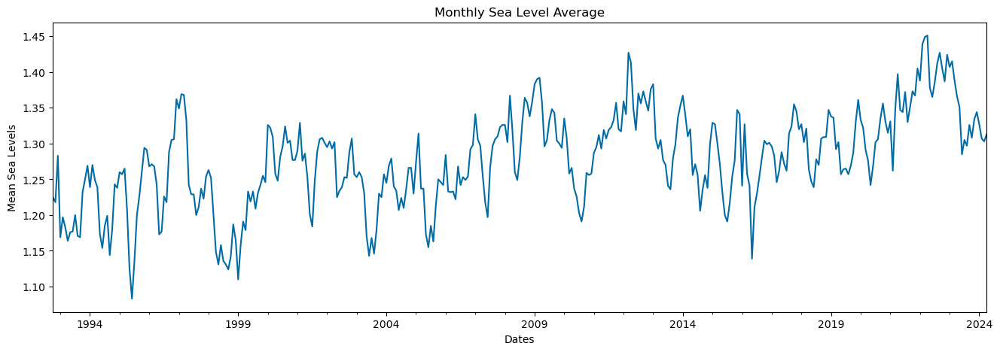

In [ ]:
fiji.index.freq = 'MS'
ax = fiji['Sea_Level_Mean'].plot(figsize = (16,5), title = "Monthly Sea Level Average")
ax.set(xlabel='Dates', ylabel='Mean Sea Levels');

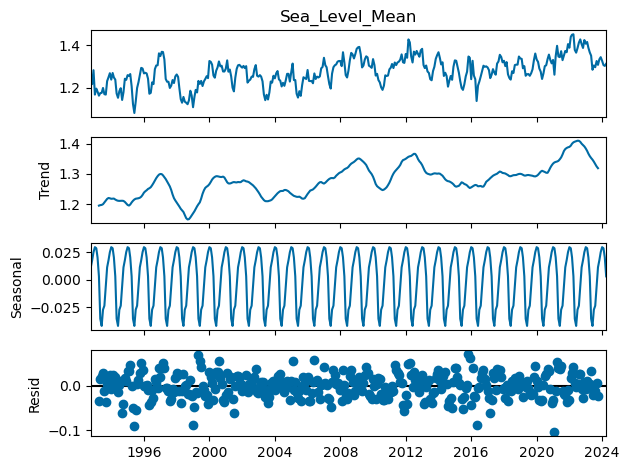

In [ ]:
decomposition = sm.tsa.seasonal_decompose(fiji["Sea_Level_Mean"],period =12)
figure = decomposition.plot()
plt.show()

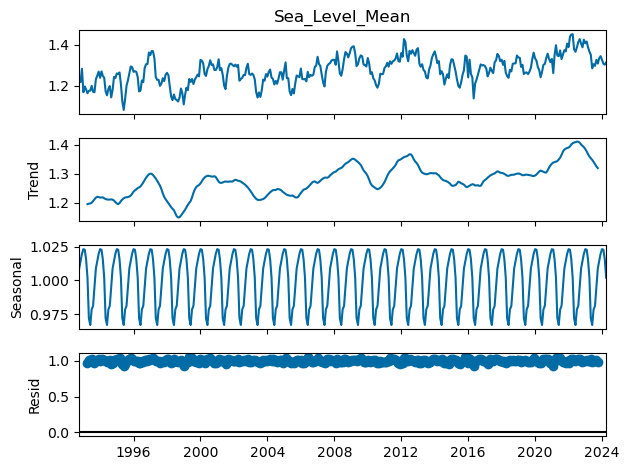

In [ ]:
decomposition = sm.tsa.seasonal_decompose(fiji["Sea_Level_Mean"],period =12, model = 'multiplicative')
figure = decomposition.plot()
plt.show()

### Papua New Guinea

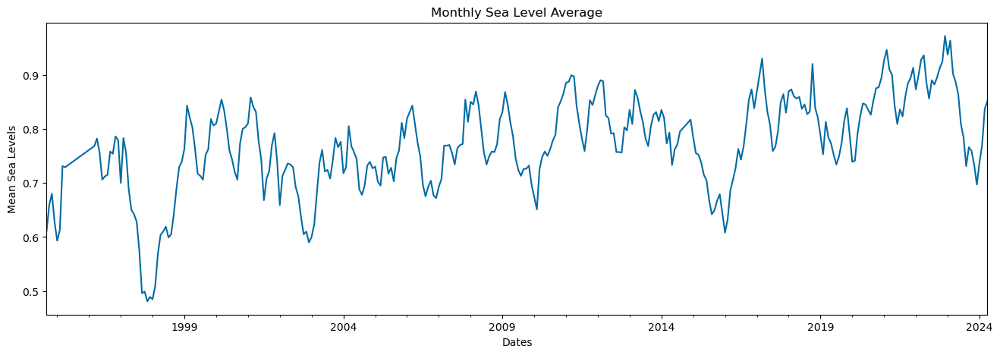

In [ ]:
png.index.freq = 'MS'
ax = png['Sea_Level_Mean'].plot(figsize = (16,5), title = "Monthly Sea Level Average")
ax.set(xlabel='Dates', ylabel='Mean Sea Levels');

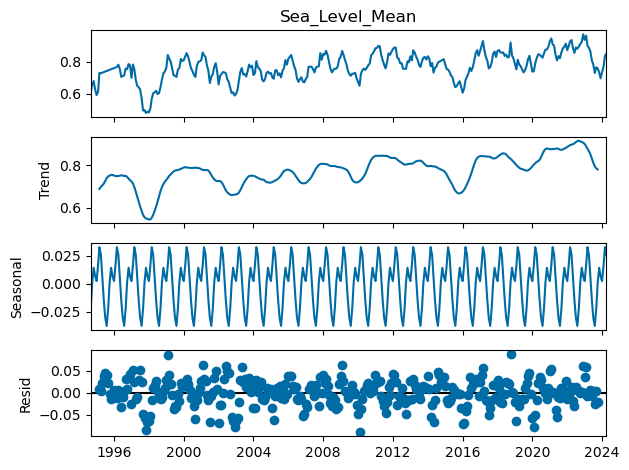

In [ ]:
decomposition = sm.tsa.seasonal_decompose(png["Sea_Level_Mean"],period =12)
figure = decomposition.plot()
plt.show()

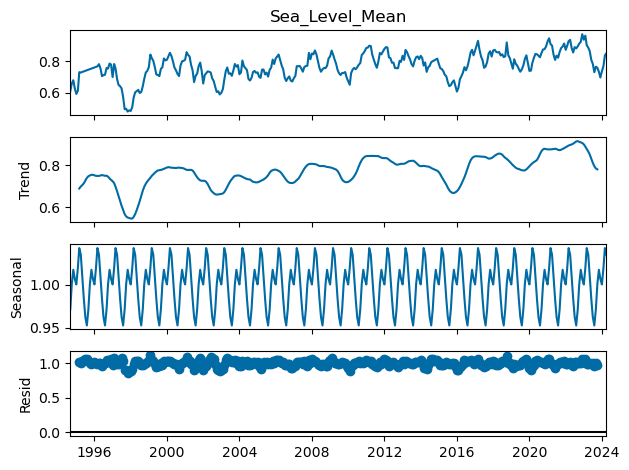

In [ ]:
decomposition = sm.tsa.seasonal_decompose(png["Sea_Level_Mean"],period =12, model = 'multiplicative')
figure = decomposition.plot()
plt.show()

### FSM

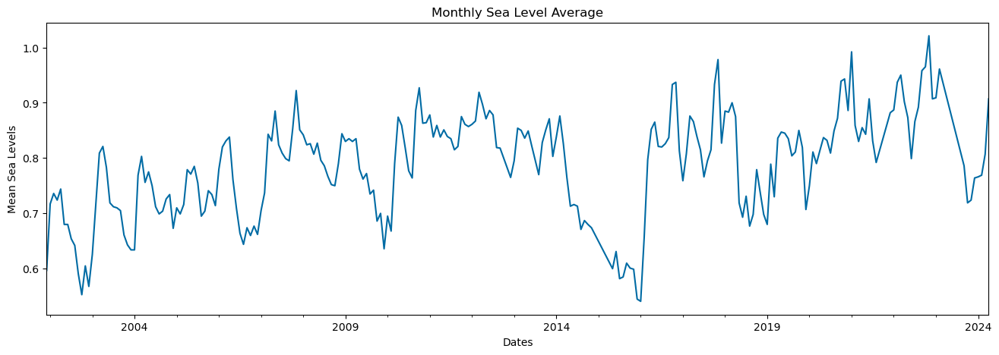

In [ ]:
fsm.index.freq = 'MS'
ax = fsm['Sea_Level_Mean'].plot(figsize = (16,5), title = "Monthly Sea Level Average")
ax.set(xlabel='Dates', ylabel='Mean Sea Levels');

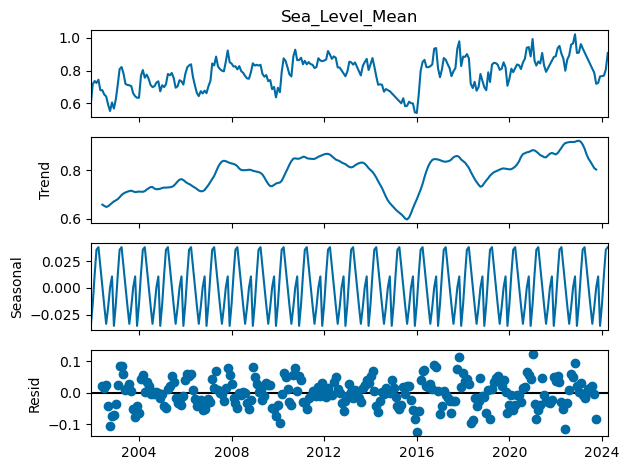

In [ ]:
decomposition = sm.tsa.seasonal_decompose(fsm["Sea_Level_Mean"],period =12)
figure = decomposition.plot()
plt.show()

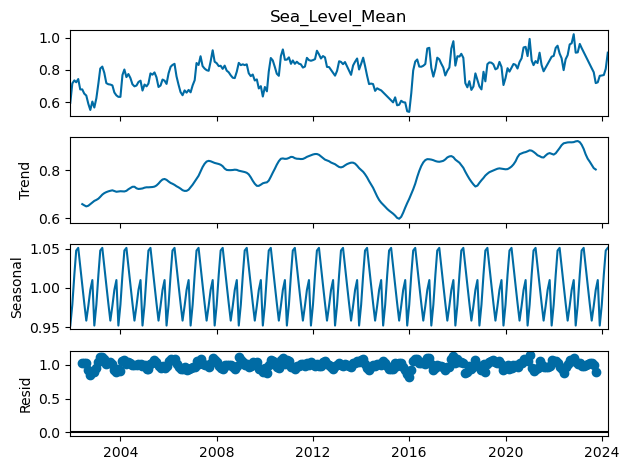

In [ ]:
decomposition = sm.tsa.seasonal_decompose(fsm["Sea_Level_Mean"],period =12, model = 'multiplicative')
figure = decomposition.plot()
plt.show()

### All Countries

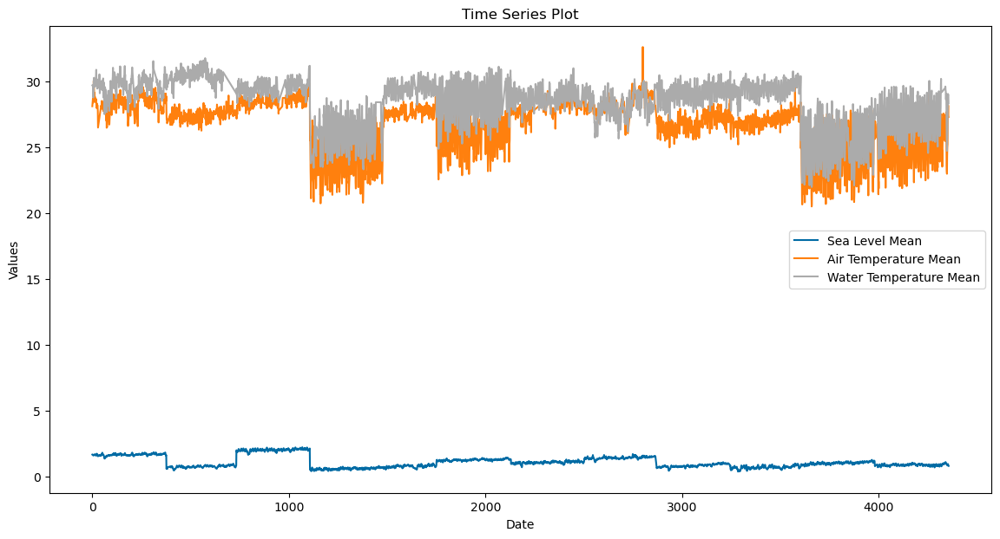

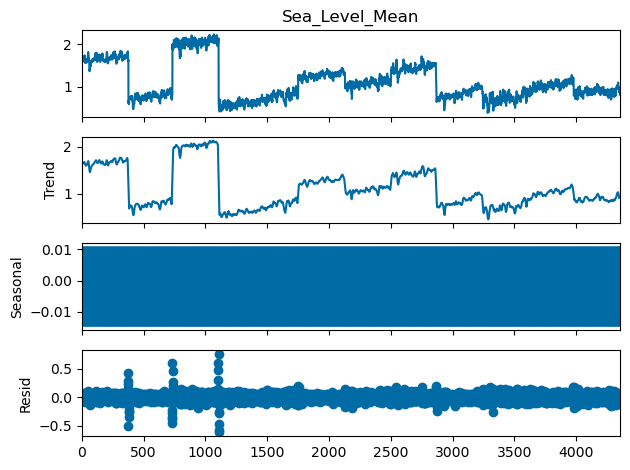

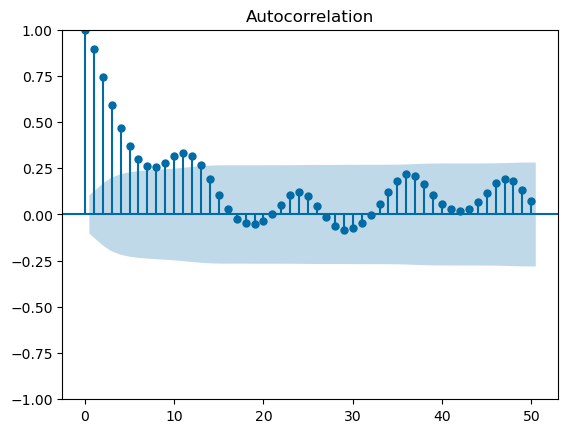

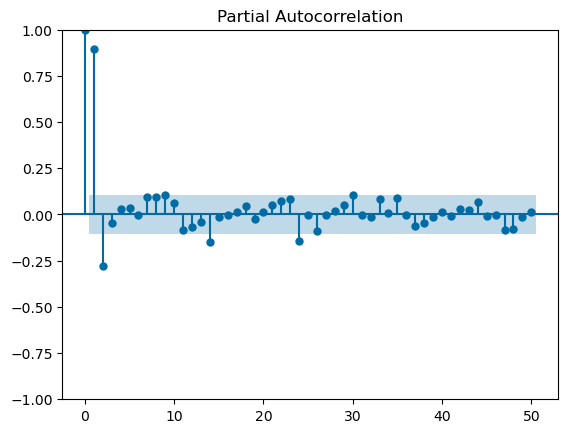

In [ ]:
# Plot the time series
plt.figure(figsize=(14, 7))
plt.plot(all_countries['Sea_Level_Mean'], label='Sea Level Mean')
plt.plot(all_countries['AirTemp_Mean'], label='Air Temperature Mean')
plt.plot(all_countries['WaterTemp_Mean'], label='Water Temperature Mean')
# plt.plot(all_countries['Pressure_Mean'], label='Bariometric Pressure Mean')
plt.xlabel('Date')
plt.ylabel('Values')
plt.title('Time Series Plot')
plt.legend()
plt.show()

# Decompose the time series
result = seasonal_decompose(all_countries['Sea_Level_Mean'].dropna(), model='additive', period=12)
result.plot()
plt.show()

# Plot the autocorrelation function
plot_acf(solomon_islands['Sea_Level_Mean'].dropna(), lags=50)
plt.savefig('images/autocorrelation.png')
plt.show()

# Plot the partial autocorrelation function
plot_pacf(solomon_islands['Sea_Level_Mean'].dropna(), lags=50)
plt.savefig('images/partial-autocorrelation.png')
plt.show()

In [ ]:
if 'Mth' in all_countries.columns:
    all_countries.rename(columns={'Mth': 'Month'}, inplace=True)

# Convert 'Mth' and 'Year' to datetime
all_countries['Date'] = pd.to_datetime(all_countries[['Year', 'Month']].assign(DAY=1))
all_countries = all_countries.set_index('Date')

# Drop original 'Mth' and 'Year' columns
all_countries = all_countries.drop(columns=['Month', 'Year'])

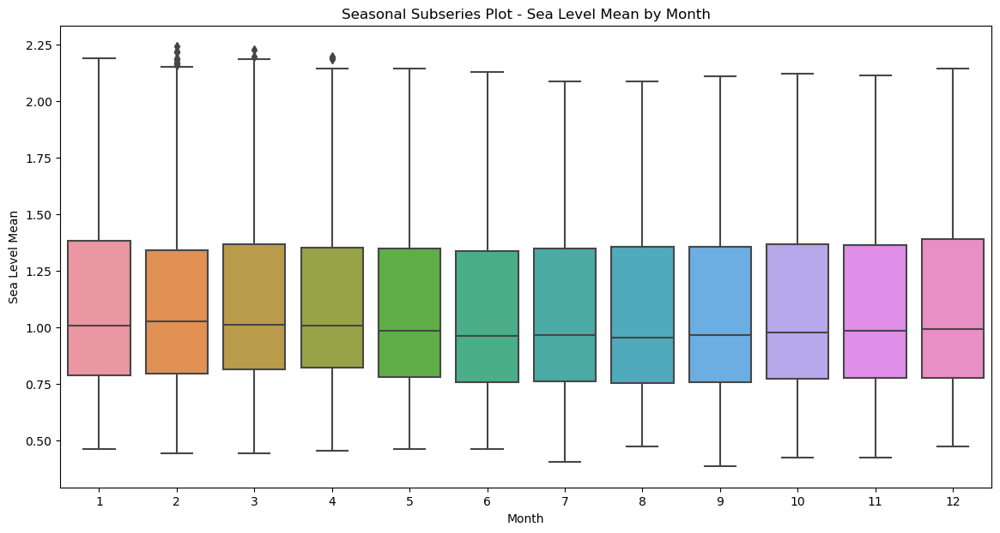

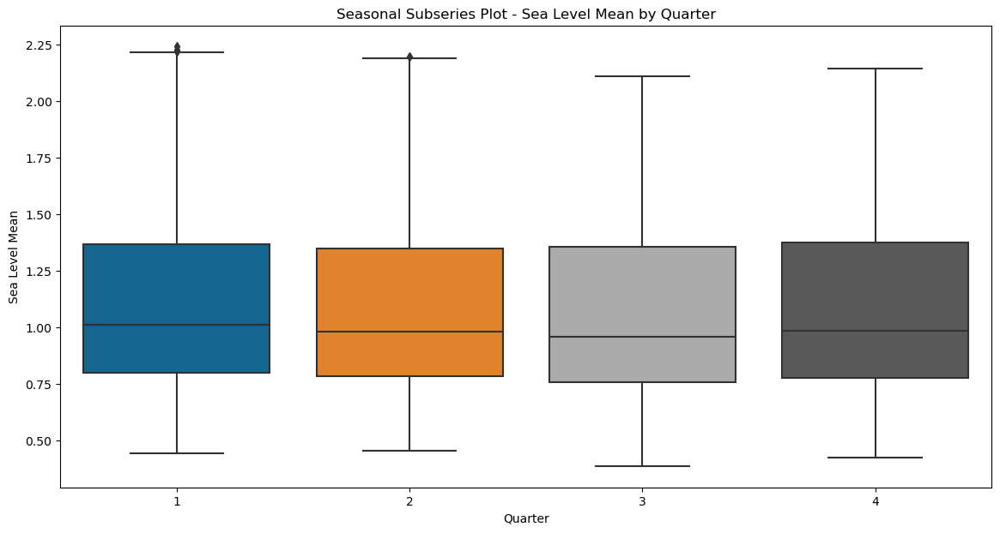

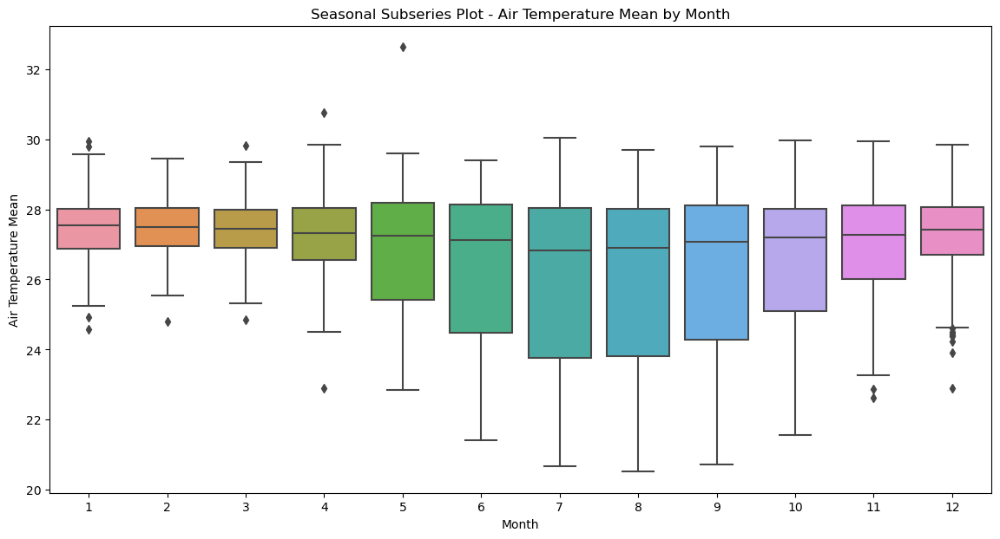

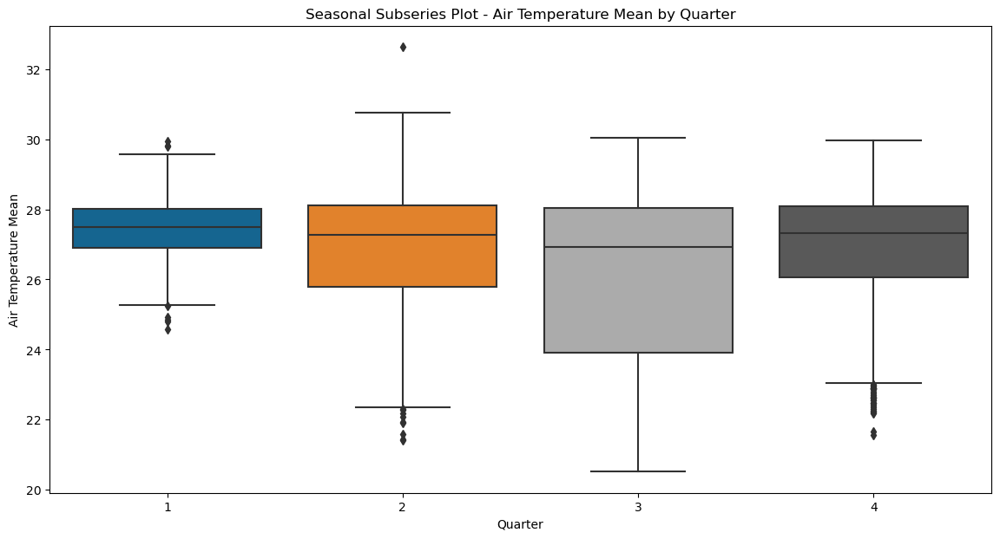

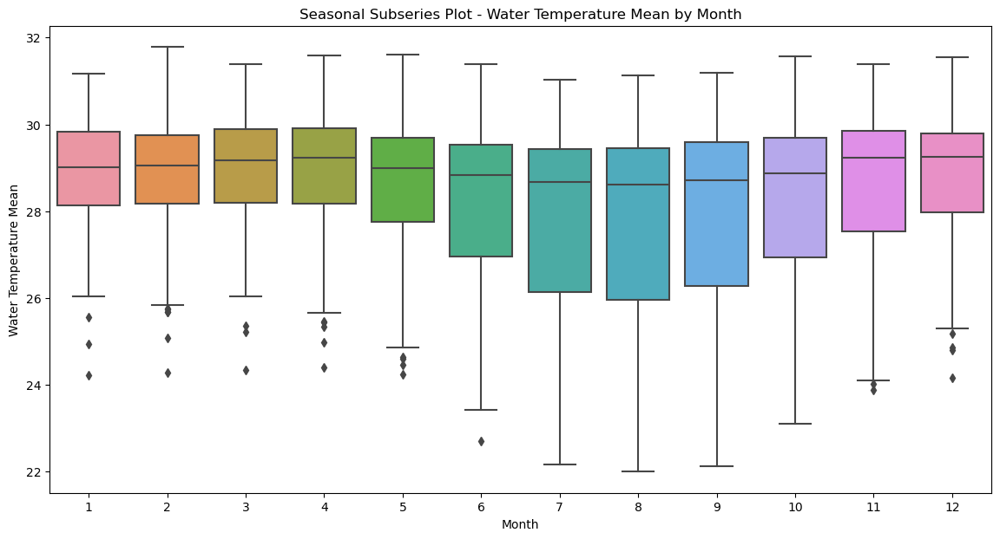

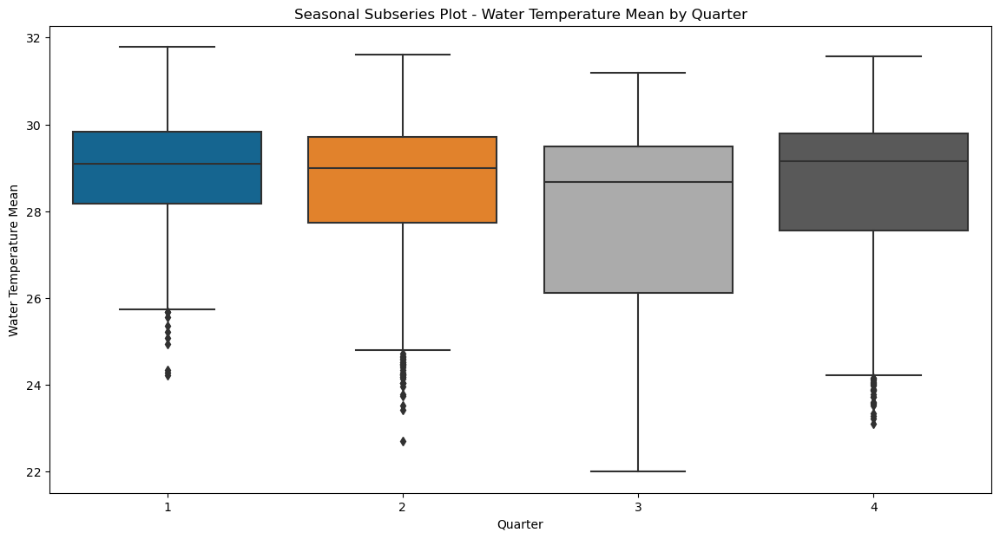

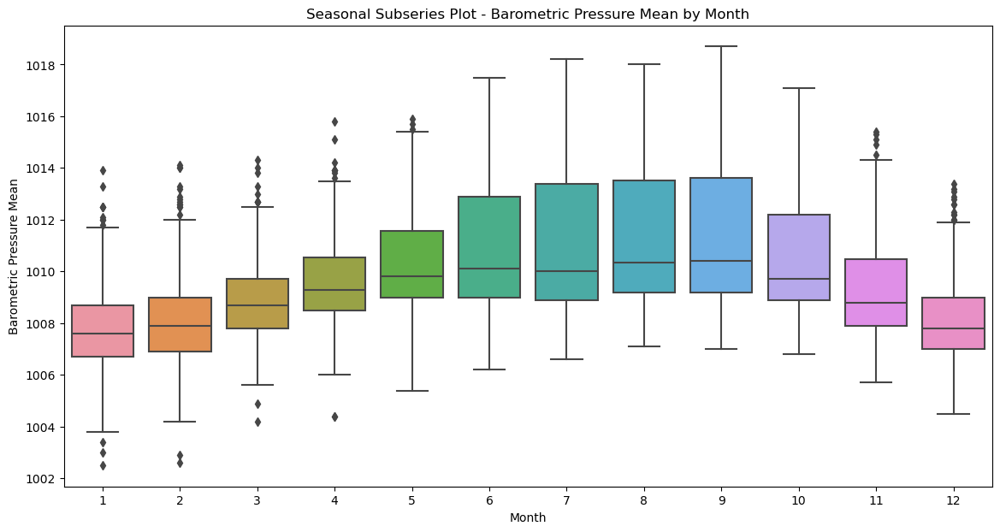

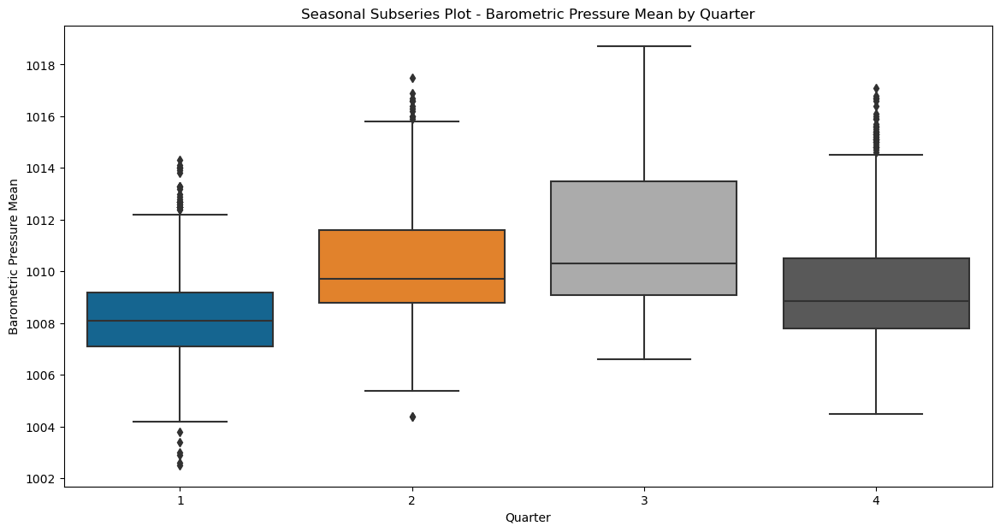

In [ ]:
# Extract seasonal information
all_countries['Month'] = all_countries.index.month
all_countries['Quarter'] = all_countries.index.quarter

# Seasonal Subseries Plot for Monthly Data
plt.figure(figsize=(14, 7))
sns.boxplot(x='Month', y='Sea_Level_Mean', data=all_countries)
plt.xlabel('Month')
plt.ylabel('Sea Level Mean')
plt.title('Seasonal Subseries Plot - Sea Level Mean by Month')
plt.show()

# Seasonal Subseries Plot for Quarterly Data
plt.figure(figsize=(14, 7))
sns.boxplot(x='Quarter', y='Sea_Level_Mean', data=all_countries)
plt.xlabel('Quarter')
plt.ylabel('Sea Level Mean')
plt.title('Seasonal Subseries Plot - Sea Level Mean by Quarter')
plt.show()

# Similarly for Air Temperature Mean
plt.figure(figsize=(14, 7))
sns.boxplot(x='Month', y='AirTemp_Mean', data=all_countries)
plt.xlabel('Month')
plt.ylabel('Air Temperature Mean')
plt.title('Seasonal Subseries Plot - Air Temperature Mean by Month')
plt.show()

plt.figure(figsize=(14, 7))
sns.boxplot(x='Quarter', y='AirTemp_Mean', data=all_countries)
plt.xlabel('Quarter')
plt.ylabel('Air Temperature Mean')
plt.title('Seasonal Subseries Plot - Air Temperature Mean by Quarter')
plt.show()

# Similarly for Water Temperature Mean
plt.figure(figsize=(14, 7))
sns.boxplot(x='Month', y='WaterTemp_Mean', data=all_countries)
plt.xlabel('Month')
plt.ylabel('Water Temperature Mean')
plt.title('Seasonal Subseries Plot - Water Temperature Mean by Month')
plt.show()

plt.figure(figsize=(14, 7))
sns.boxplot(x='Quarter', y='WaterTemp_Mean', data=all_countries)
plt.xlabel('Quarter')
plt.ylabel('Water Temperature Mean')
plt.title('Seasonal Subseries Plot - Water Temperature Mean by Quarter')
plt.show()

# Similarly for Barometric Pressure Mean
plt.figure(figsize=(14, 7))
sns.boxplot(x='Month', y='Pressure_Mean', data=all_countries)
plt.xlabel('Month')
plt.ylabel('Barometric Pressure Mean')
plt.title('Seasonal Subseries Plot - Barometric Pressure Mean by Month')
plt.show()

plt.figure(figsize=(14, 7))
sns.boxplot(x='Quarter', y='Pressure_Mean', data=all_countries)
plt.xlabel('Quarter')
plt.ylabel('Barometric Pressure Mean')
plt.title('Seasonal Subseries Plot - Barometric Pressure Mean by Quarter')
plt.show()

# Machine Learning Models

**Time-Series:**

ARIMA/SARIMA: Good for univariate time series.

LSTM/GRU (Recurrent Neural Networks): For capturing long-term dependencies in time-series data.

**Regression:**

Linear Regression: Simple and interpretable.

Random Forest Regressor: Handles non-linear relationships well.

Gradient Boosting (e.g., XGBoost, LightGBM): Powerful for capturing complex patterns.

Neural Networks: For complex, non-linear relationships.

## Solomon Islands

### Train and Test Split

In [ ]:
from pandas import DataFrame
# solomon_islands_norm2 = pd.DataFrame(solomon_islands_norm1, columns=solomon_islands.columns)
X = solomon_islands_std.drop(columns=['Sea_Level_Mean'])
y = solomon_islands_std['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=46)
X_train, X_test = temporal_train_test_split(X, test_size=46)

### Basic models

#### Linear Regression - Baseline

In [ ]:
np.random.seed(42)
# from matplotlib import pyplot
model = LinearRegression()
model.fit(X_train, y_train)

# Predictions
y_pred = model.predict(X_test)

# Model evaluation
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error: {rmse}')

mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

r2 = r2_score(y_test, y_pred)
print(f"R-squared: {r2:.6f}")

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape = mean_absolute_percentage_error(y_test, y_pred)
print(f"Mean Absolute Percentage Error: {mape:.2f}%")

mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae:.2f}%")

Root Mean Squared Error: 0.03674189352884388
Mean Squared Error: 0.0013499667400849
R-squared: 0.863127
Mean Absolute Percentage Error: 3.57%
Mean Absolute Error: 0.03%


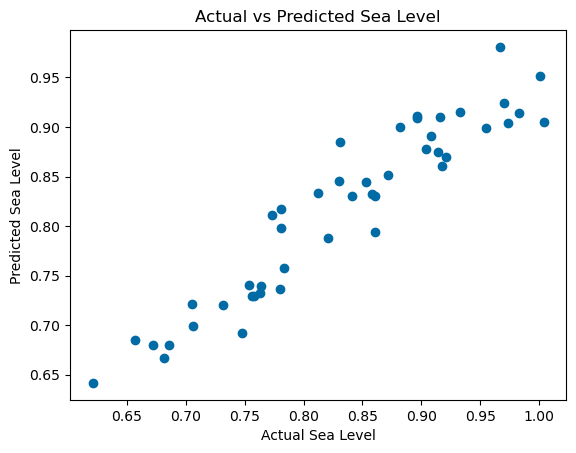

In [ ]:
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Sea Level')
plt.ylabel('Predicted Sea Level')
plt.title('Actual vs Predicted Sea Level')
plt.show()

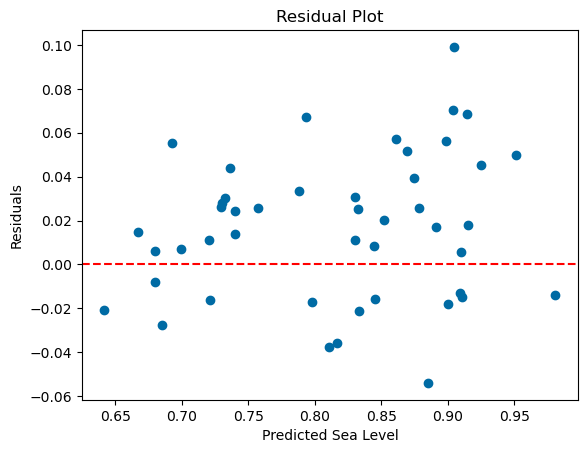

In [ ]:
residuals = y_test - y_pred
plt.scatter(y_pred, residuals)
plt.xlabel('Predicted Sea Level')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

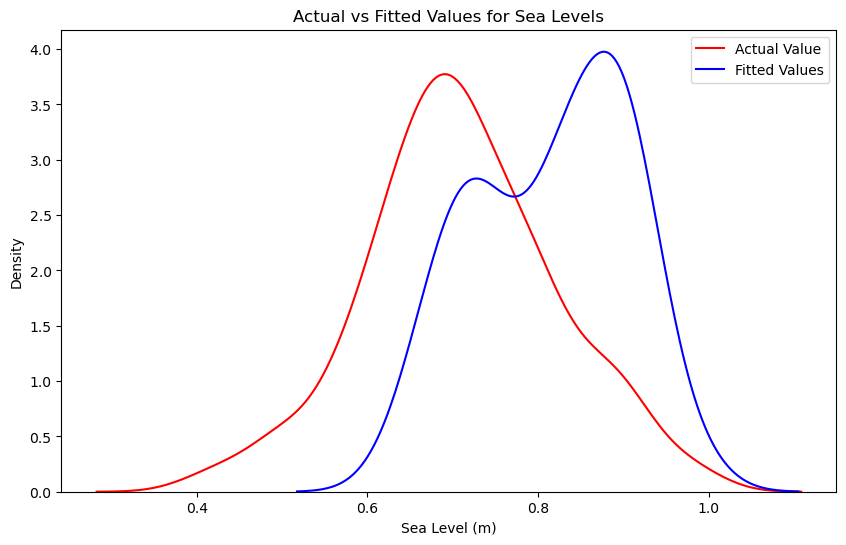

In [ ]:
plt.figure(figsize=(10, 6))

ax1 = sns.kdeplot(y, color="r", label="Actual Value")
sns.kdeplot(y_pred, color="b", label="Fitted Values", ax=ax1)

plt.title('Actual vs Fitted Values for Sea Levels')
plt.xlabel('Sea Level (m)')
plt.ylabel('Density')

plt.legend()
plt.show()
plt.close()

<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
MAPE: 0.1951


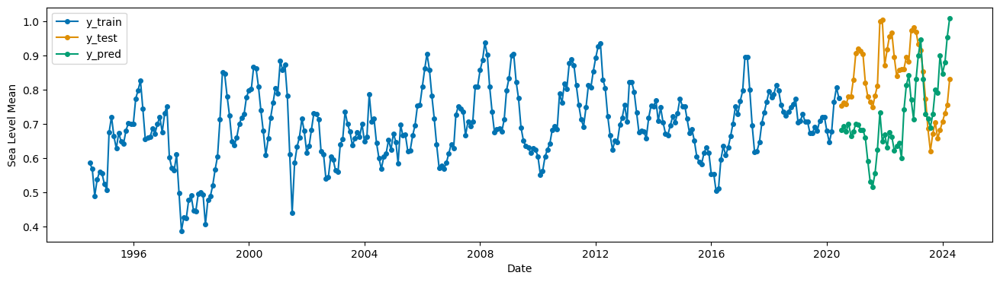

In [ ]:
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.forecasting.base import ForecastingHorizon
from sktime.forecasting.compose import make_reduction
from sktime.utils.plotting import plot_series
from sktime.performance_metrics.forecasting import mean_absolute_percentage_error

from sklearn.linear_model import LinearRegression

X = solomon_islands_dat.drop(columns=['Sea_Level_Mean'])
y = solomon_islands_dat['Sea_Level_Mean']
print(type(y))

y_train, y_test = temporal_train_test_split(y, test_size=46)
X_train, X_test = temporal_train_test_split(X, test_size=46)

# date_rng = pd.date_range(start='2024-05', end='2025-04', freq='M')
# # date_rng_str = date_rng.strftime('%Y-%m')
# df = pd.Series(index=date_rng_str)
# # y_test = pd.Series([None]*len(date_rng_str), index=date_rng_str)
# # df_filled = pd.Series([1]*len(date_rng_str), index=date_rng_str)

# # Concatenate y_test and df_filled
# y_test = pd.concat([y_test, df_filled])

# Print the type of y_test to confirm it's a Series
print(type(y_test))

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# Linear regression forecaster
regressor = LinearRegression()
forecaster = make_reduction(regressor, window_length=180, strategy="recursive")

# Fit and predict
forecaster.fit(y_train)
y_pred = forecaster.predict(fh=fh)

# Plot predictions with training and test data
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], x_label='Date', y_label='Sea Level Mean');

# Evaluate
print('MAPE: %.4f' % mean_absolute_percentage_error(y_test, y_pred, symmetric=False))

MAPE: 0.1038


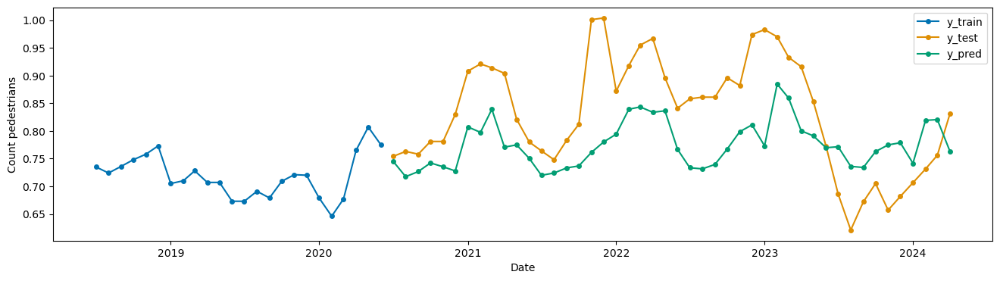

In [ ]:
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.forecasting.base import ForecastingHorizon
from sktime.forecasting.compose import make_reduction
from sktime.utils.plotting import plot_series
from sktime.performance_metrics.forecasting import mean_absolute_percentage_error

from xgboost import XGBRegressor

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# XGBoost forecaster
regressor = XGBRegressor(objective='reg:squarederror', random_state=42)
forecaster = make_reduction(regressor, window_length=195, strategy="recursive")

# Fit and predict
forecaster.fit(y=y_train, X=X_train)
y_pred = forecaster.predict(fh=fh, X=X_test)

# Plot predictions with training and test data
plot_series(y_train['2018-07-01':], y_test, y_pred, labels=["y_train", "y_test", "y_pred"], x_label='Date', y_label='Count pedestrians');

# Evaluate
print('MAPE: %.4f' % mean_absolute_percentage_error(y_test, y_pred, symmetric=False))

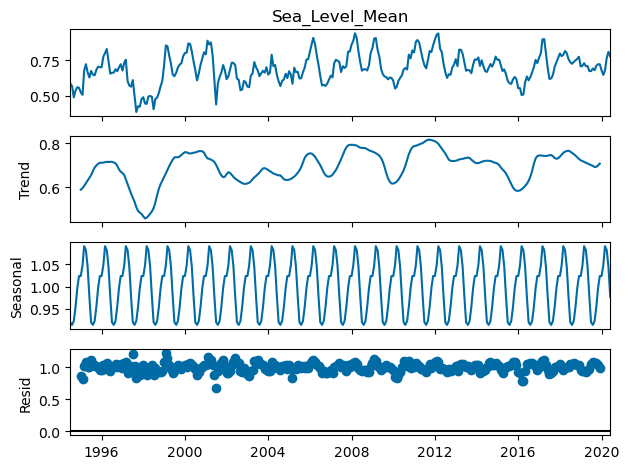

MAPE: 0.1350


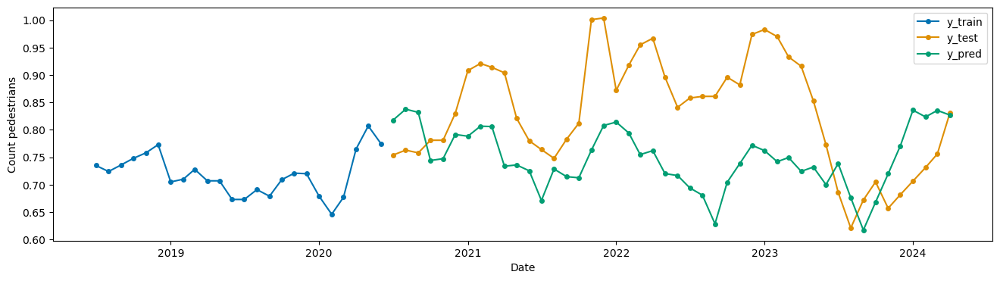

In [ ]:
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.split import SingleWindowSplitter
from sktime.forecasting.model_selection import ForecastingRandomizedSearchCV
from sktime.forecasting.base import ForecastingHorizon
from sktime.forecasting.compose import make_reduction, TransformedTargetForecaster
from sktime.utils.plotting import plot_series
from sktime.performance_metrics.forecasting import mean_absolute_percentage_error
from sktime.transformations.series.detrend import Deseasonalizer, Detrender
from sktime.forecasting.trend import PolynomialTrendForecaster

from xgboost import XGBRegressor

from statsmodels.tsa.seasonal import seasonal_decompose

X = solomon_islands_std.drop(columns=['Sea_Level_Mean'])
y = solomon_islands_std['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=46)
X_train, X_test = temporal_train_test_split(X, test_size=46)

# Seasonal decomposition
result = seasonal_decompose(y_train, model='multiplicative')
result.plot()
plt.show()

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# Window for cross-validation
validation_size = 26
cv = SingleWindowSplitter(window_length=len(y)-validation_size, fh=validation_size)

# XGBoost forecaster with grid of parameters and detrender and deseasonaliser
regressor = XGBRegressor(objective='reg:squarederror', random_state=42)
forecaster = TransformedTargetForecaster(
    [
        ("deseasonalize", Deseasonalizer(model="multiplicative", sp=52)),
        ("detrend", Detrender(forecaster=PolynomialTrendForecaster(degree=1))),
        ("forecast", make_reduction(regressor, window_length=195, strategy="recursive"),
        ),
    ]
)

# Param grid
param_grid = {
    'deseasonalize__model': ['multiplicative', 'additive'],
    'detrend__forecaster__degree': [1, 2, 3],
    'forecast__estimator__max_depth': [3, 5, 6, 10, 15, 20],
    'forecast__estimator__learning_rate': [0.01, 0.1, 0.2, 0.3],
    'forecast__estimator__subsample': np.arange(0.5, 1.0, 0.1),
    'forecast__estimator__colsample_bytree': np.arange(0.4, 1.0, 0.1),
    'forecast__estimator__colsample_bylevel': np.arange(0.4, 1.0, 0.1),
    'forecast__estimator__n_estimators': [100, 500, 1000]
}

# Randomised search
gscv = ForecastingRandomizedSearchCV(forecaster, cv=cv, param_distributions=param_grid, n_iter=100, random_state=42)

# Fit and predict
gscv.fit(y=y_train, X=X_train)
y_pred = gscv.predict(fh=fh, X=X_test)

# Plot predictions with training and test data
plot_series(y_train['2018-07-01':], y_test, y_pred, labels=["y_train", "y_test", "y_pred"], x_label='Date', y_label='Count pedestrians');

# Evaluate
print('MAPE: %.4f' % mean_absolute_percentage_error(y_test, y_pred, symmetric=False))

#### Random Forest Regressor

In [ ]:
np.random.seed(42)
rf_model = RandomForestRegressor()
rf_model.fit(X_train, y_train)

# Predictions
y_pred_rf = rf_model.predict(X_test)

# Model evaluation
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
print(f'Root Mean Squared Error (Random Forest): {rmse_rf}')

mse_rf = mean_squared_error(y_test, y_pred_rf)
print(f'Mean Squared Error (Random Forest): {mse_rf}')

r2_rf = r2_score(y_test, y_pred_rf)
print(f"R-squared (Random Forest): {r2_rf:.6f}")

mape_rf = mean_absolute_percentage_error(y_test, y_pred_rf)
print(f"Mean Absolute Percentage Error (Random Forest): {mape_rf:.2f}%")

Root Mean Squared Error (Random Forest): 0.05363712372326038
Mean Squared Error (Random Forest): 0.002876941041304341
R-squared (Random Forest): 0.708307
Mean Absolute Percentage Error (Random Forest): 0.05%


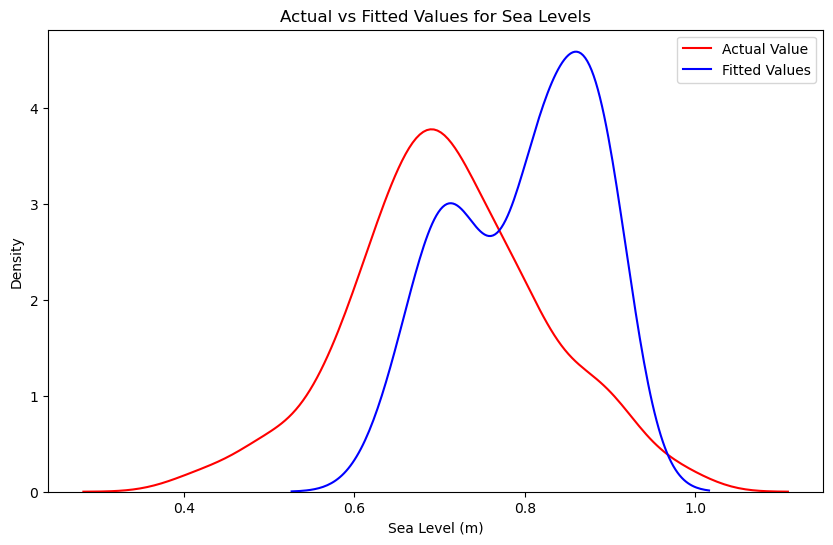

In [ ]:
plt.figure(figsize=(10, 6))

ax1 = sns.kdeplot(y, color="r", label="Actual Value")
sns.kdeplot(y_pred_rf, color="b", label="Fitted Values", ax=ax1)

plt.title('Actual vs Fitted Values for Sea Levels')
plt.xlabel('Sea Level (m)')
plt.ylabel('Density')

plt.legend()
plt.show()
plt.close()

MAPE: 0.1350
Root Mean Squared Error (Random Forest): 0.1379052759340076
Mean Squared Error (Random Forest): 0.01901786513043477
R-squared (Random Forest): -0.928224
Mean Absolute Percentage Error (Random Forest): 0.13%


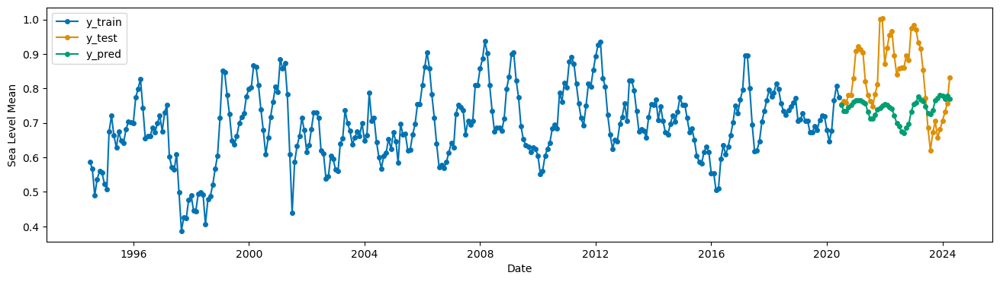

In [ ]:
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.forecasting.base import ForecastingHorizon
from sktime.forecasting.compose import make_reduction
from sktime.utils.plotting import plot_series
from sktime.performance_metrics.forecasting import mean_absolute_percentage_error

X = solomon_islands_dat.drop(columns=['Sea_Level_Mean'])
y = solomon_islands_dat['Sea_Level_Mean']

y_train, y_test = temporal_train_test_split(y, test_size=46)
X_train, X_test = temporal_train_test_split(X, test_size=46)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# Linear regression forecaster
regressor = RandomForestRegressor()
forecaster = make_reduction(regressor, window_length=170, strategy="recursive")

# Fit and predict
forecaster.fit(y_train)
y_pred_rf = forecaster.predict(fh=fh)

# Plot predictions with training and test data
plot_series(y_train, y_test, y_pred_rf, labels=["y_train", "y_test", "y_pred"], x_label='Date', y_label='Sea Level Mean');

# Evaluate
print('MAPE: %.4f' % mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
print(f'Root Mean Squared Error (Random Forest): {rmse_rf}')

mse_rf = mean_squared_error(y_test, y_pred_rf)
print(f'Mean Squared Error (Random Forest): {mse_rf}')

r2_rf = r2_score(y_test, y_pred_rf)
print(f"R-squared (Random Forest): {r2_rf:.6f}")

mape_rf = mean_absolute_percentage_error(y_test, y_pred_rf)
print(f"Mean Absolute Percentage Error (Random Forest): {mape_rf:.2f}%")

MAPE: 0.1613
Root Mean Squared Error (Random Forest): 0.1379052759340076
Mean Squared Error (Random Forest): 0.01901786513043477
R-squared (Random Forest): -0.928224
Mean Absolute Percentage Error (Random Forest): 0.13%


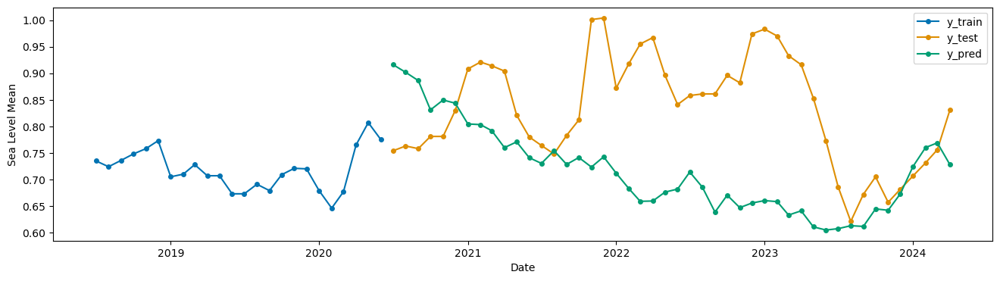

In [ ]:
X = solomon_islands_std.drop(columns=['Sea_Level_Mean'])
y = solomon_islands_std['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=46)
X_train, X_test = temporal_train_test_split(X, test_size=46)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# Window for cross-validation
validation_size = 26
cv = SingleWindowSplitter(window_length=len(y)-validation_size, fh=validation_size)

# XGBoost forecaster with grid of parameters and detrender and deseasonaliser
regressor = RandomForestRegressor()
forecaster = TransformedTargetForecaster(
    [
        ("deseasonalize", Deseasonalizer(model="multiplicative", sp=52)),
        ("detrend", Detrender(forecaster=PolynomialTrendForecaster(degree=1))),
        ("forecast", make_reduction(regressor, window_length=195, strategy="recursive"),
        ),
    ]
)

# Param grid
param_grid = {
    'deseasonalize__model': ['multiplicative', 'additive'],
    'detrend__forecaster__degree': [1, 2, 3],
    'forecast__estimator__max_depth': [3, 5, 6, 10, 15, 20],
    'forecast__estimator__n_estimators': [100, 200, 300]
}

# Randomised search
gscv = ForecastingRandomizedSearchCV(forecaster, cv=cv, param_distributions=param_grid, n_iter=100, random_state=42)

# Fit and predict
gscv.fit(y=y_train, X=X_train)
y_pred = gscv.predict(fh=fh, X=X_test)

# Plot predictions with training and test data
plot_series(y_train['2018-07-01':], y_test, y_pred, labels=["y_train", "y_test", "y_pred"], x_label='Date', y_label='Sea Level Mean');

# Evaluate
print('MAPE: %.4f' % mean_absolute_percentage_error(y_test, y_pred, symmetric=False))
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
print(f'Root Mean Squared Error (Random Forest): {rmse_rf}')

mse_rf = mean_squared_error(y_test, y_pred_rf)
print(f'Mean Squared Error (Random Forest): {mse_rf}')

r2_rf = r2_score(y_test, y_pred_rf)
print(f"R-squared (Random Forest): {r2_rf:.6f}")

mape_rf = mean_absolute_percentage_error(y_test, y_pred_rf)
print(f"Mean Absolute Percentage Error (Random Forest): {mape_rf:.2f}%")

### Neural Networks

In [ ]:
X = solomon_islands_std.drop(columns=['Sea_Level_Mean'])
y = solomon_islands_std['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=36)
X_train, X_test = temporal_train_test_split(X, test_size=36)

#### ARIMA

In [ ]:
# pip install pmdarima

In [ ]:
from pmdarima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
import warnings
from sklearn.metrics import mean_squared_error
from statsmodels.tools.eval_measures import rmse
warnings.filterwarnings("ignore")
auto_arima(solomon_islands['Sea_Level_Mean'], seasonal=True, m=12,max_p=7, max_d=5,max_q=7, max_P=4, max_D=4,max_Q=4).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  358
Model:               SARIMAX(0, 1, 1)   Log Likelihood                 565.595
Date:                Wed, 14 Aug 2024   AIC                          -1127.191
Time:                        17:03:47   BIC                          -1119.435
Sample:                    07-01-1994   HQIC                         -1124.106
                         - 04-01-2024                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.2316      0.046      4.983      0.000       0.141       0.323
sigma2         0.0025      0.000     16.520      0.000       0.002       0.003
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                18.37
Prob(Q):                              0.90   Prob(JB):                         0.00
Heteroskedasticity (H):               0.54   Skew:                             0.18
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.05
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [ ]:
X = solomon_islands_std.drop(columns=['Sea_Level_Mean'])
y = solomon_islands_std['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=46)
X_train, X_test = temporal_train_test_split(X, test_size=46)

arima_model = SARIMAX(y_train, order = (2,1,1), seasonal_order = (6,2,3,12)) # 4,0,3,12
arima_result = arima_model.fit()
arima_result.summary()

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.69767D-01    |proj g|=  4.60036D+00


 This problem is unconstrained.



At iterate    5    f= -1.02167D+00    |proj g|=  1.80459D+00

At iterate   10    f= -1.20624D+00    |proj g|=  3.33889D-01

At iterate   15    f= -1.22010D+00    |proj g|=  1.34882D+00

At iterate   20    f= -1.23859D+00    |proj g|=  4.07177D-01

At iterate   25    f= -1.28696D+00    |proj g|=  2.02266D-01

At iterate   30    f= -1.32209D+00    |proj g|=  1.30746D+00

At iterate   35    f= -1.34606D+00    |proj g|=  2.79764D-02

At iterate   40    f= -1.35207D+00    |proj g|=  1.82162D-01

At iterate   45    f= -1.35341D+00    |proj g|=  2.30005D-02

At iterate   50    f= -1.35427D+00    |proj g|=  2.01555D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

<class 'statsmodels.iolib.summary.Summary'>
"""
                                         SARIMAX Results                                          
==================================================================================================
Dep. Variable:                             Sea_Level_Mean   No. Observations:                  312
Model:             SARIMAX(2, 1, 1)x(6, 2, [1, 2, 3], 12)   Log Likelihood                 422.533
Date:                                    Wed, 14 Aug 2024   AIC                           -819.067
Time:                                            17:04:21   BIC                           -771.493
Sample:                                        07-01-1994   HQIC                          -800.000
                                             - 06-01-2020                                         
Covariance Type:                                      opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0711      1.421      0.754      0.451      -1.714       3.856
ar.L2         -0.0859      0.157     -0.547      0.584      -0.394       0.222
ma.L1         -0.9809      1.324     -0.741      0.459      -3.576       1.614
ar.S.L12      -1.9569      0.251     -7.784      0.000      -2.450      -1.464
ar.S.L24      -2.3591      0.416     -5.675      0.000      -3.174      -1.544
ar.S.L36      -1.8107      0.373     -4.849      0.000      -2.543      -1.079
ar.S.L48      -1.3330      0.298     -4.468      0.000      -1.918      -0.748
ar.S.L60      -0.7531      0.197     -3.829      0.000      -1.139      -0.368
ar.S.L72      -0.3366      0.086     -3.906      0.000      -0.506      -0.168
ma.S.L12       0.1454      1.224      0.119      0.905      -2.254       2.545
ma.S.L24      -0.3914      1.444     -0.271      0.786      -3.222       2.439
ma.S.L36      -0.7343      0.998     -0.736      0.462      -2.690       1.221
sigma2         0.0023      0.003      0.825      0.409      -0.003       0.008
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                 2.13
Prob(Q):                              0.87   Prob(JB):                         0.35
Heteroskedasticity (H):               0.48   Skew:                             0.20
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.11
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [ ]:
arima_pred = arima_result.predict(start = 0, end = len(solomon_islands)+45, typ="levels").rename("ARIMA Predictions")
arima_pred

1994-07-01    0.000000
1994-08-01    0.586000
1994-09-01    0.568000
1994-10-01    0.489000
1994-11-01    0.537000
                ...   
2027-10-01    1.013312
2027-11-01    1.033010
2027-12-01    1.034799
2028-01-01    0.996625
2028-02-01    0.966504
Freq: MS, Name: ARIMA Predictions, Length: 404, dtype: float64

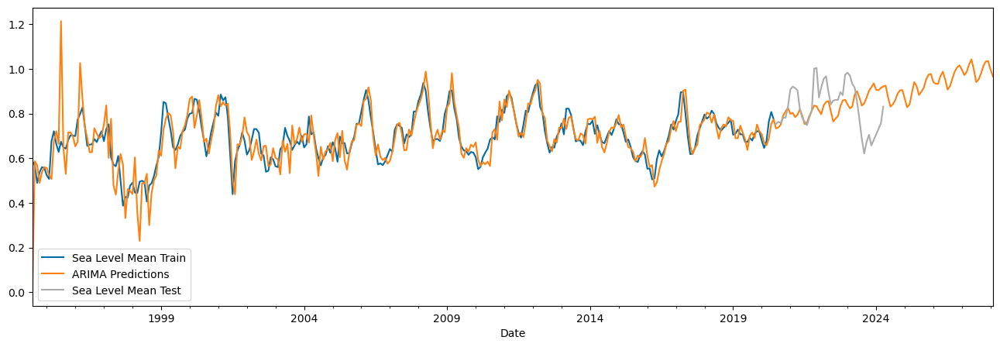

In [ ]:
y_train.plot(figsize = (16,5), legend=True, label = 'Sea Level Mean Train')
arima_pred.plot(legend = True)
y_test.plot(legend=True, label = 'Sea Level Mean Test')
plt.savefig('images/SARIMAX.png')

In [ ]:
# Model evaluation
dates = y_test.index
arima_pred_series = pd.Series(arima_pred, index=dates)

# Slice arima_pred to match the dates in y_test
arima_pred_slice = arima_pred_series.loc[y_test.index]

# Calculate RMSE
rmse_arima = mean_squared_error(y_test, arima_pred_slice, squared=False)
print(f'Root Mean Squared Error: {rmse_arima}')

mse_arima = mean_squared_error(y_test, arima_pred_slice)
print(f'Mean Squared Error: {mse_arima}')

r2_arima = r2_score(y_test, arima_pred_slice)
print(f"R-squared: {r2_arima:.6f}")

mape_arima = mean_absolute_percentage_error(y_test, arima_pred_slice)
print(f"Mean Absolute Percentage Error: {mape_arima:.2f}%")

mae_arima = mean_absolute_error(y_test, arima_pred_slice)
print(f"Mean Absolute Error: {mae_arima:.2f}%")

Root Mean Squared Error: 0.11895227527528696
Mean Squared Error: 0.014149643793167646
R-squared: -0.434634
Mean Absolute Percentage Error: 0.12%
Mean Absolute Error: 0.09%


In [ ]:
# Model evaluation
dates = y_train.index
arima_pred_series = pd.Series(arima_pred, index=dates)

# Slice arima_pred to match the dates in y_test
arima_pred_slice = arima_pred_series.loc[y_train.index]

# Calculate RMSE
rmse_arima = mean_squared_error(y_train, arima_pred_slice, squared=False)
print(f'Root Mean Squared Error: {rmse_arima}')

mse_arima = mean_squared_error(y_train, arima_pred_slice)
print(f'Mean Squared Error: {mse_arima}')

r2_arima = r2_score(y_train, arima_pred_slice)
print(f"R-squared: {r2_arima:.6f}")

mape_arima = mean_absolute_percentage_error(y_train, arima_pred_slice)
print(f"Mean Absolute Percentage Error: {mape_arima:.2f}%")

mae_arima = mean_absolute_error(y_train, arima_pred_slice)
print(f"Mean Absolute Error: {mae_arima:.2f}%")

Root Mean Squared Error: 0.07587511848115705
Mean Squared Error: 0.005757033604529621
R-squared: 0.458520
Mean Absolute Percentage Error: 0.07%
Mean Absolute Error: 0.05%


In [ ]:
y_test['ARIMA_Predictions'] = arima_pred

#### LSTM

In [ ]:
X = solomon_islands
y = solomon_islands['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=46)
X_train, X_test = temporal_train_test_split(X, test_size=46)

In [ ]:
scaler = MinMaxScaler()
scaler.fit(X_train)
scaler_test = MinMaxScaler()
scaler_test.fit(X_test)
scaled_train_data = scaler.transform(X_train)
scaled_test_data = scaler.transform(X_test)

In [ ]:
timesteps = 12  # Number of time steps to use in each sequence
features = scaled_train_data.shape[1]

# Create sequences using TimeseriesGenerator
generator = TimeseriesGenerator(scaled_train_data, scaled_train_data,
                                length=timesteps, batch_size=32)

In [ ]:
# Define the model
model = Sequential()
model.add(LSTM(200, activation='relu', input_shape=(timesteps, features)))
model.add(Dense(features))

model.compile(optimizer='adam', loss='mean_squared_error')
# model = Sequential()
# model.add(LSTM(200, activation='relu', return_sequences=True, input_shape=(timesteps, features)))
# model.add(Dropout(0.2))  # 20% dropout
# model.add(LSTM(100, activation='relu'))
# model.add(Dropout(0.2))
# model.add(Dense(features))

model.compile(optimizer='adam', loss='mean_squared_error')

In [ ]:
history = model.fit(generator, epochs=245, verbose=1)

Epoch 1/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.1779
Epoch 2/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0378
Epoch 3/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0316
Epoch 4/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0308
Epoch 5/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0318
Epoch 6/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0293 
Epoch 7/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0273
Epoch 8/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0275
Epoch 9/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0275
Epoch 10/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0252
Epoch 11/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0235
Epoch 12/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0236
Epoch 13/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0219
Epoch 14/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0209
Epoch 15/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0187
Epo

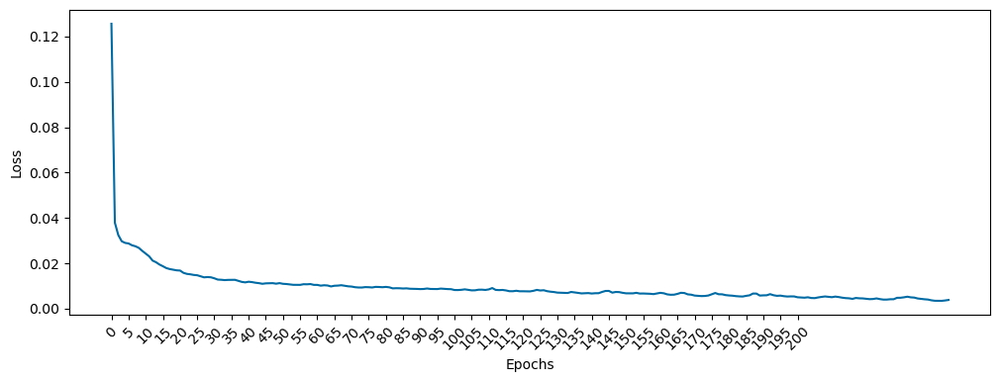

In [ ]:
losses_lstm = history.history['loss']
plt.figure(figsize=(12,4))
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.xticks(np.arange(0,201,5), rotation = 45)
plt.plot(range(len(losses_lstm)),losses_lstm);

In [ ]:
import numpy as np
import pandas as pd

np.random.seed(42)

# Function to predict all data including training and test
def predict_all_data(scaled_train_data, scaled_test_data, model, timesteps, features, scaler):
    # Predicting training data
    training_predictions = []
    forecast_input = scaled_train_data[:timesteps]  # Use the start of the training data as the initial input

    for i in range(len(scaled_train_data)):
        forecast_input_reshaped = forecast_input.reshape((1, timesteps, features))
        prediction = model.predict(forecast_input_reshaped)
        training_predictions.append(prediction[0])

        if i + timesteps < len(scaled_train_data):
            forecast_input = np.append(forecast_input[1:], scaled_train_data[i + timesteps].reshape(1, -1), axis=0)

    # Convert the training predictions back to the original scale
    training_predictions = np.array(training_predictions)
    training_predictions = scaler.inverse_transform(training_predictions)

    # Predicting test data
    test_predictions = []
    forecast_input = scaled_train_data[-timesteps:]  # Use the end of the training data as the initial input

    for _ in range(len(scaled_test_data)):
        forecast_input_reshaped = forecast_input.reshape((1, timesteps, features))
        prediction = model.predict(forecast_input_reshaped)
        test_predictions.append(prediction[0])

        # Update forecast_input to include the latest prediction
        forecast_input = np.append(forecast_input[1:], prediction, axis=0)

    # Convert the test predictions back to the original scale
    test_predictions = np.array(test_predictions)
    test_predictions = scaler.inverse_transform(test_predictions)

    return training_predictions, test_predictions

# Predicting future values
def predict_future_values(scaled_train_data, model, timesteps, features, forecast_length, scaler):
    forecast_input = scaled_train_data[-timesteps:]
    forecast = []

    for _ in range(forecast_length):
        forecast_input_reshaped = forecast_input.reshape((1, timesteps, features))
        prediction = model.predict(forecast_input_reshaped)
        forecast.append(prediction[0])

        # Update forecast_input to include the latest prediction
        forecast_input = np.append(forecast_input[1:], prediction, axis=0)

    # Convert the forecast back to original scale
    forecast = np.array(forecast)
    forecast = scaler.inverse_transform(forecast)

    return forecast

# Perform predictions
training_predictions, test_predictions = predict_all_data(scaled_train_data, scaled_test_data, model, timesteps, features, scaler)
future_forecast = predict_future_values(scaled_train_data, model, timesteps, features, forecast_length=60, scaler=scaler)

# Create date ranges for training, test, and forecast data
train_dates = pd.date_range(start=X.index[0], periods=len(training_predictions), freq='M')
test_dates = pd.date_range(start=X.index[-len(test_predictions)], periods=len(test_predictions), freq='M')
forecast_dates = pd.date_range(start=X.index[-1] + pd.DateOffset(months=1), periods=60, freq='M')

# Convert results to DataFrames
train_predictions_df = pd.DataFrame(training_predictions, index=train_dates, columns=X.columns)
test_predictions_df = pd.DataFrame(test_predictions, index=test_dates, columns=X.columns)
future_forecast_df = pd.DataFrame(future_forecast, index=forecast_dates, columns=X.columns)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━

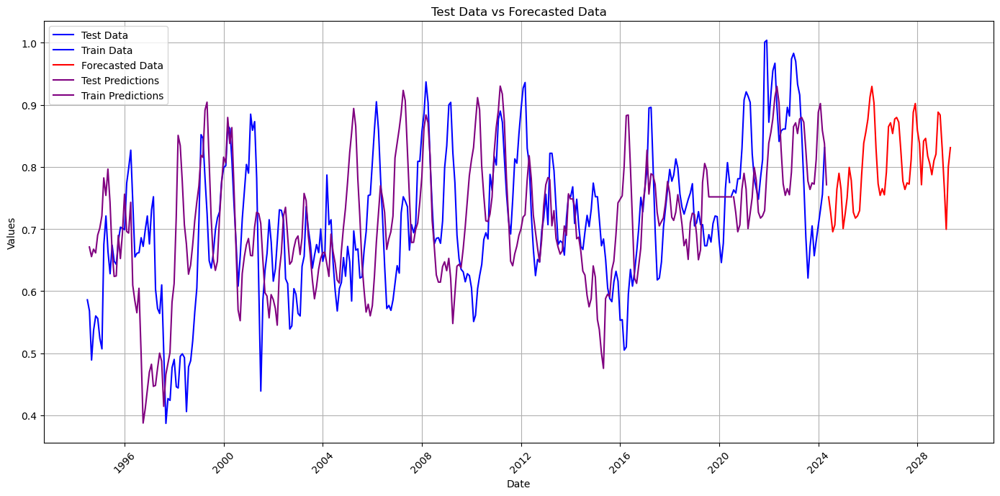

In [ ]:
test_predictions_df = pd.DataFrame(test_predictions, index=test_dates, columns=X.columns)
future_forecast_df = pd.DataFrame(future_forecast, index=forecast_dates, columns=X.columns)

# Plotting
plt.figure(figsize=(14, 7))

# Plot test data
plt.plot(X_test.index, X_test['Sea_Level_Mean'].values, label='Test Data', color='blue')
plt.plot(X_train.index, X_train['Sea_Level_Mean'].values, label='Train Data', color='blue')

# Plot forecast data
plt.plot(future_forecast_df.index, future_forecast_df['Sea_Level_Mean'].values, label='Forecasted Data', color='red')
plt.plot(test_predictions_df.index, test_predictions_df['Sea_Level_Mean'].values, label='Test Predictions', color='purple')
plt.plot(train_predictions_df.index, train_predictions_df['Sea_Level_Mean'].values, label='Train Predictions', color='purple')

plt.title('Test Data vs Forecasted Data')
plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [ ]:
# Calculate RMSE
rmse_lstm = mean_squared_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values, squared=False)
print(f'Root Mean Squared Error: {rmse_lstm}')

mse_lstm = mean_squared_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f'Mean Squared Error: {mse_lstm}')

r2_lstm = r2_score(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f"R-squared: {r2_lstm:.6f}")

mape_lstm = mean_absolute_percentage_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Percentage Error: {mape_lstm:.2f}%")

mae_lstm = mean_absolute_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Error: {mae_lstm:.2f}%")

Root Mean Squared Error: 0.10525139740545383
Mean Squared Error: 0.011077856655800775
R-squared: -0.123186
Mean Absolute Percentage Error: 0.10%
Mean Absolute Error: 0.09%


Evaluate on training data

In [ ]:
# Calculate RMSE
rmse_lstm = mean_squared_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values, squared=False)
print(f'Root Mean Squared Error: {rmse_lstm}')

mse_lstm = mean_squared_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f'Mean Squared Error: {mse_lstm}')

r2_lstm = r2_score(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f"R-squared: {r2_lstm:.6f}")

mape_lstm = mean_absolute_percentage_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Percentage Error: {mape_lstm:.2f}%")

mae_lstm = mean_absolute_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Error: {mae_lstm:.2f}%")

Root Mean Squared Error: 0.12691057915369572
Mean Squared Error: 0.016106295101126464
R-squared: -0.514884
Mean Absolute Percentage Error: 0.15%
Mean Absolute Error: 0.10%


## Kiribati

### Train and Test Split

In [ ]:
X = kiribati.drop(columns=['Sea_Level_Mean'])
y = kiribati['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=46)
X_train, X_test = temporal_train_test_split(X, test_size=46)

### Basic models

#### Linear Regression - Baseline

In [ ]:
np.random.seed(42)
# from matplotlib import pyplot
model = LinearRegression()
model.fit(X_train, y_train)

# Predictions
y_pred = model.predict(X_test)

# Model evaluation
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error: {rmse}')

mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

r2 = r2_score(y_test, y_pred)
print(f"R-squared: {r2:.6f}")

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape = mean_absolute_percentage_error(y_test, y_pred)
print(f"Mean Absolute Percentage Error: {mape:.2f}%")

mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae:.2f}%")

Root Mean Squared Error: 0.02611857886149978
Mean Squared Error: 0.0006821801617443832
R-squared: 0.696788
Mean Absolute Percentage Error: 1.23%
Mean Absolute Error: 0.02%


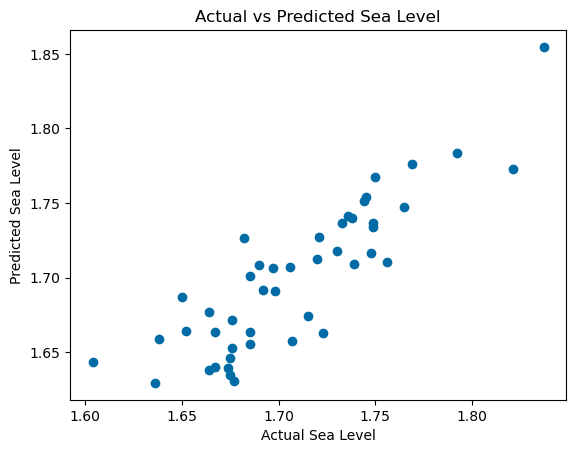

In [ ]:
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Sea Level')
plt.ylabel('Predicted Sea Level')
plt.title('Actual vs Predicted Sea Level')
plt.show()

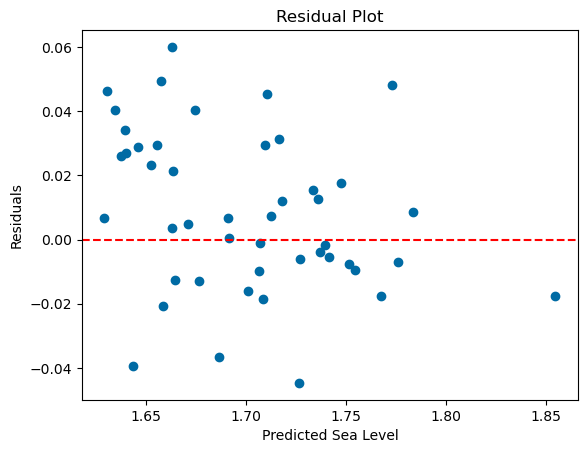

In [ ]:
residuals = y_test - y_pred
plt.scatter(y_pred, residuals)
plt.xlabel('Predicted Sea Level')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

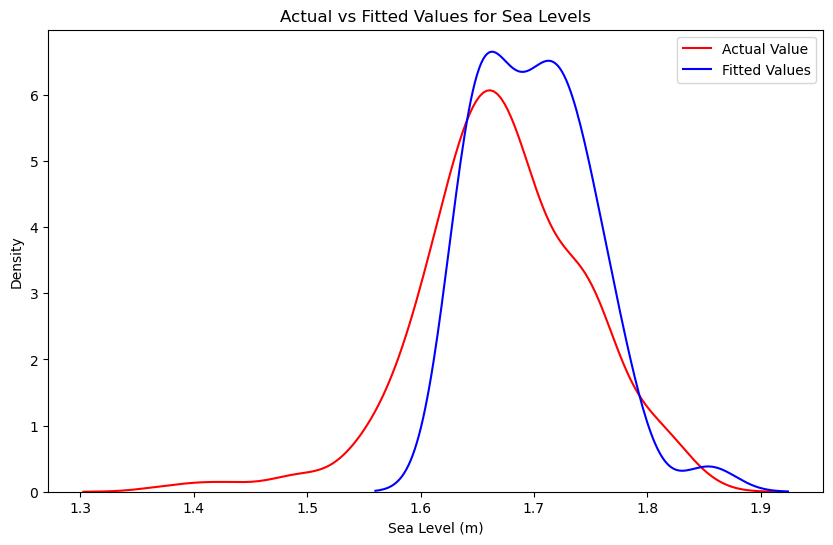

In [ ]:
plt.figure(figsize=(10, 6))

ax1 = sns.kdeplot(y, color="r", label="Actual Value")
sns.kdeplot(y_pred, color="b", label="Fitted Values", ax=ax1)

plt.title('Actual vs Fitted Values for Sea Levels')
plt.xlabel('Sea Level (m)')
plt.ylabel('Density')

plt.legend()
plt.show()
plt.close()

Root Mean Squared Error: 0.17957004550294012
Mean Squared Error: 0.032245401241927985
R-squared: -13.332277
Mean Absolute Percentage Error: 7.83%
Mean Absolute Error: 0.13%


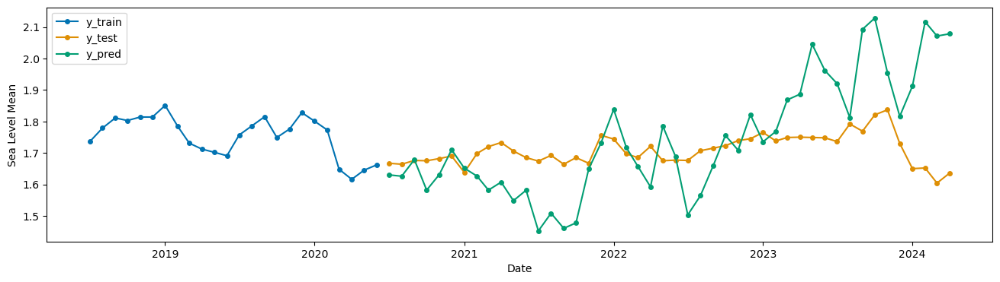

In [ ]:
X = kiribati.drop(columns=['Sea_Level_Mean'])
y = kiribati['Sea_Level_Mean']

y_train, y_test = temporal_train_test_split(y, test_size=46)
X_train, X_test = temporal_train_test_split(X, test_size=46)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# Linear regression forecaster
regressor = LinearRegression()
forecaster = make_reduction(regressor, window_length=180, strategy="recursive")

# Fit and predict
forecaster.fit(y_train)
y_pred = forecaster.predict(fh=fh)

# Plot predictions with training and test data
plot_series(y_train['2018-07-01':], y_test, y_pred, labels=["y_train", "y_test", "y_pred"], x_label='Date', y_label='Sea Level Mean');

# Evaluate
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error: {rmse}')

mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

r2 = r2_score(y_test, y_pred)
print(f"R-squared: {r2:.6f}")

mape = mean_absolute_percentage_error(y_test, y_pred)
print(f"Mean Absolute Percentage Error: {mape:.2f}%")

mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae:.2f}%")

#### XGBRegressor

MAPE: 2.0806


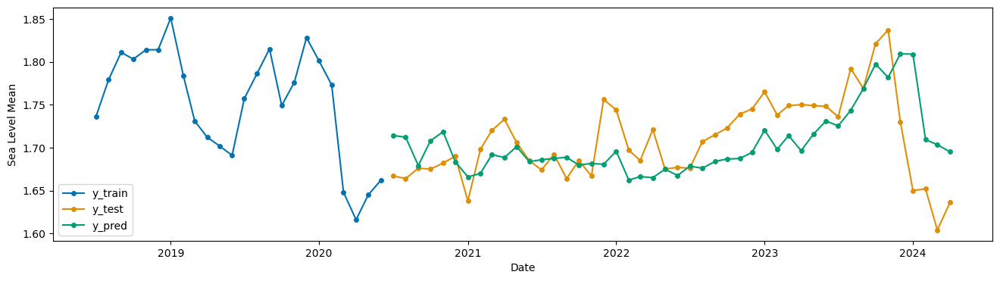

In [ ]:
# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# XGBoost forecaster
regressor = XGBRegressor(objective='reg:squarederror', r0andom_state=42)
forecaster = make_reduction(regressor, window_length=60, strategy="recursive")

# Fit and predict
forecaster.fit(y=y_train, X=X_train)
y_pred = forecaster.predict(fh=fh, X=X_test)

# Plot predictions with training and test data
plot_series(y_train['2018-07-01':], y_test, y_pred, labels=["y_train", "y_test", "y_pred"], x_label='Date', y_label='Sea Level Mean');

# Evaluate
print('MAPE: %.4f' % mean_absolute_percentage_error(y_test, y_pred))

MAPE: 13.5028


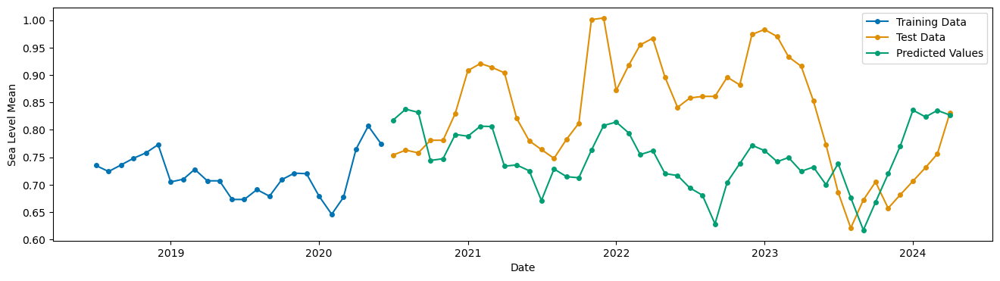

In [ ]:
X = solomon_islands_std.drop(columns=['Sea_Level_Mean'])
y = solomon_islands_std['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=46)
X_train, X_test = temporal_train_test_split(X, test_size=46)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# Window for cross-validation
validation_size = 26
cv = SingleWindowSplitter(window_length=len(y)-validation_size, fh=validation_size)

# XGBoost forecaster with grid of parameters and detrender and deseasonaliser
regressor = XGBRegressor(objective='reg:squarederror', random_state=42)
forecaster = TransformedTargetForecaster(
    [
        ("deseasonalize", Deseasonalizer(model="multiplicative", sp=52)),
        ("detrend", Detrender(forecaster=PolynomialTrendForecaster(degree=1))),
        ("forecast", make_reduction(regressor, window_length=195, strategy="recursive"),
        ),
    ]
)

# Param grid
param_grid = {
    'deseasonalize__model': ['multiplicative', 'additive'],
    'detrend__forecaster__degree': [1, 2, 3],
    'forecast__estimator__max_depth': [3, 5, 6, 10, 15, 20],
    'forecast__estimator__learning_rate': [0.01, 0.1, 0.2, 0.3],
    'forecast__estimator__subsample': np.arange(0.5, 1.0, 0.1),
    'forecast__estimator__colsample_bytree': np.arange(0.4, 1.0, 0.1),
    'forecast__estimator__colsample_bylevel': np.arange(0.4, 1.0, 0.1),
    'forecast__estimator__n_estimators': [100, 500, 1000]
}

# Randomised search
gscv = ForecastingRandomizedSearchCV(forecaster, cv=cv, param_distributions=param_grid, n_iter=100, random_state=42)

# Fit and predict
gscv.fit(y=y_train, X=X_train)
y_pred = gscv.predict(fh=fh, X=X_test)

# Plot predictions with training and test data
plot_series(y_train['2018-07-01':], y_test, y_pred, labels=["Training Data", "Test Data", "Predicted Values"], x_label='Date', y_label='Sea Level Mean');

# Evaluate
print('MAPE: %.4f' % mean_absolute_percentage_error(y_test, y_pred))

#### Random Forest Regressor

In [ ]:
np.random.seed(42)
rf_model = RandomForestRegressor()
rf_model.fit(X_train, y_train)

# Predictions
y_pred_rf = rf_model.predict(X_test)

# Model evaluation
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
print(f'Root Mean Squared Error (Random Forest): {rmse_rf}')

mse_rf = mean_squared_error(y_test, y_pred_rf)
print(f'Mean Squared Error (Random Forest): {mse_rf}')

r2_rf = r2_score(y_test, y_pred_rf)
print(f"R-squared (Random Forest): {r2_rf:.6f}")

mape_rf = mean_absolute_percentage_error(y_test, y_pred_rf)
print(f"Mean Absolute Percentage Error (Random Forest): {mape_rf:.2f}%")

Root Mean Squared Error (Random Forest): 0.05363712372326038
Mean Squared Error (Random Forest): 0.002876941041304341
R-squared (Random Forest): 0.708307
Mean Absolute Percentage Error (Random Forest): 4.86%


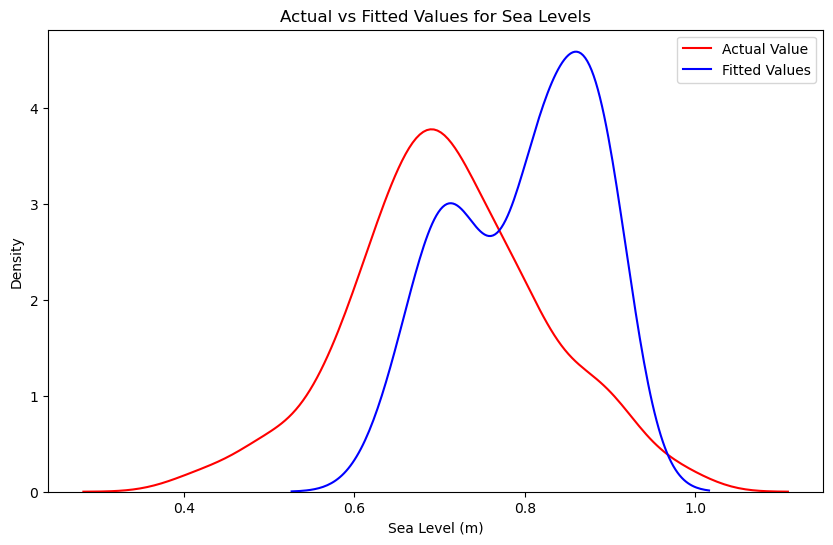

In [ ]:
plt.figure(figsize=(10, 6))

ax1 = sns.kdeplot(y, color="r", label="Actual Value")
sns.kdeplot(y_pred_rf, color="b", label="Fitted Values", ax=ax1)

plt.title('Actual vs Fitted Values for Sea Levels')
plt.xlabel('Sea Level (m)')
plt.ylabel('Density')

plt.legend()
plt.show()
plt.close()

Root Mean Squared Error (Random Forest): 0.04331930779988138
Mean Squared Error (Random Forest): 0.0018765624282608639
R-squared (Random Forest): 0.165915
Mean Absolute Percentage Error (Random Forest): 1.89%


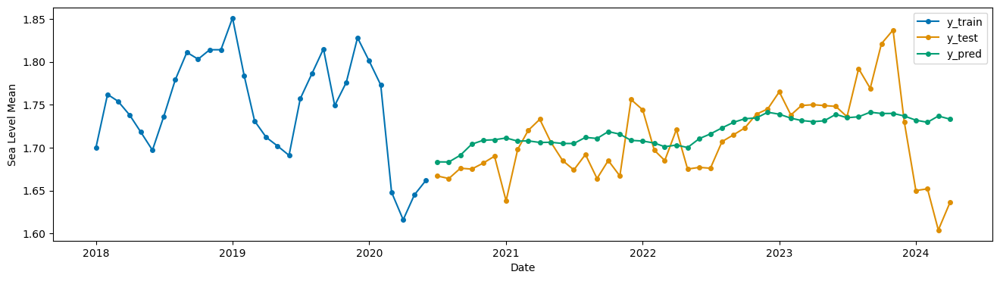

In [ ]:
X = kiribati_std.drop(columns=['Sea_Level_Mean'])
y = kiribati_std['Sea_Level_Mean']

y_train, y_test = temporal_train_test_split(y, test_size=46)
X_train, X_test = temporal_train_test_split(X, test_size=46)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# Linear regression forecaster
regressor = RandomForestRegressor()
forecaster = make_reduction(regressor, window_length=170, strategy="recursive")

# Fit and predict
forecaster.fit(y_train)
y_pred_rf = forecaster.predict(fh=fh)

# Plot predictions with training and test data
plot_series(y_train['2018-01-01':], y_test, y_pred_rf, labels=["y_train", "y_test", "y_pred"], x_label='Date', y_label='Sea Level Mean');

# Evaluate
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
print(f'Root Mean Squared Error (Random Forest): {rmse_rf}')

mse_rf = mean_squared_error(y_test, y_pred_rf)
print(f'Mean Squared Error (Random Forest): {mse_rf}')

r2_rf = r2_score(y_test, y_pred_rf)
print(f"R-squared (Random Forest): {r2_rf:.6f}")

mape_rf = mean_absolute_percentage_error(y_test, y_pred_rf)
print(f"Mean Absolute Percentage Error (Random Forest): {mape_rf:.2f}%")

Root Mean Squared Error (Random Forest): 0.04331930779988138
Mean Squared Error (Random Forest): 0.0018765624282608639
R-squared (Random Forest): 0.165915
Mean Absolute Percentage Error (Random Forest): 1.89%


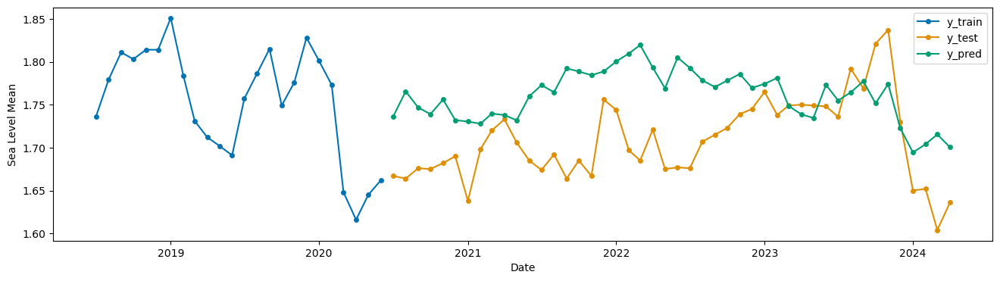

In [ ]:
X = kiribati_std.drop(columns=['Sea_Level_Mean'])
y = kiribati_std['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=46)
X_train, X_test = temporal_train_test_split(X, test_size=46)

# Forecasting horizon, same as test data
fh = ForecastingHorizon(y_test.index, is_relative=False)

# Window for cross-validation
validation_size = 26
cv = SingleWindowSplitter(window_length=len(y)-validation_size, fh=validation_size)

# XGBoost forecaster with grid of parameters and detrender and deseasonaliser
regressor = RandomForestRegressor()
forecaster = TransformedTargetForecaster(
    [
        ("deseasonalize", Deseasonalizer(model="multiplicative", sp=52)),
        ("detrend", Detrender(forecaster=PolynomialTrendForecaster(degree=1))),
        ("forecast", make_reduction(regressor, window_length=195, strategy="recursive"),
        ),
    ]
)

# Param grid
param_grid = {
    'deseasonalize__model': ['multiplicative', 'additive'],
    'detrend__forecaster__degree': [1, 2, 3],
    'forecast__estimator__max_depth': [3, 5, 6, 10, 15, 20],
    'forecast__estimator__n_estimators': [100, 200, 300]
}

# Randomised search
gscv = ForecastingRandomizedSearchCV(forecaster, cv=cv, param_distributions=param_grid, n_iter=100, random_state=42)

# Fit and predict
gscv.fit(y=y_train, X=X_train)
y_pred = gscv.predict(fh=fh, X=X_test)

# Plot predictions with training and test data
plot_series(y_train['2018-07-01':], y_test, y_pred, labels=["y_train", "y_test", "y_pred"], x_label='Date', y_label='Sea Level Mean');

# Evaluate
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
print(f'Root Mean Squared Error (Random Forest): {rmse_rf}')

mse_rf = mean_squared_error(y_test, y_pred_rf)
print(f'Mean Squared Error (Random Forest): {mse_rf}')

r2_rf = r2_score(y_test, y_pred_rf)
print(f"R-squared (Random Forest): {r2_rf:.6f}")

mape_rf = mean_absolute_percentage_error(y_test, y_pred_rf)
print(f"Mean Absolute Percentage Error (Random Forest): {mape_rf:.2f}%")

### Neural Networks

#### ARIMA

In [ ]:
# pip install pmdarima

In [ ]:
auto_arima(kiribati['Sea_Level_Mean'], seasonal=True, m=12,max_p=7, max_d=5,max_q=7, max_P=4, max_D=4,max_Q=4).summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  377
Model:               SARIMAX(0, 1, 0)   Log Likelihood                 700.473
Date:                Wed, 14 Aug 2024   AIC                          -1398.946
Time:                        17:14:01   BIC                          -1395.017
Sample:                    12-01-1992   HQIC                         -1397.386
                         - 04-01-2024                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.0014   9.09e-05     15.506      0.000       0.001       0.002
===================================================================================
Ljung-Box (L1) (Q):                   0.40   Jarque-Bera (JB):                 9.87
Prob(Q):                              0.53   Prob(JB):                         0.01
Heteroskedasticity (H):               1.08   Skew:                            -0.28
Prob(H) (two-sided):                  0.67   Kurtosis:                         3.55
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [ ]:
X = kiribati.drop(columns=['Sea_Level_Mean'])
y = kiribati['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=46)
X_train, X_test = temporal_train_test_split(X, test_size=46)

arima_model = SARIMAX(y_train, order = (2,1,1), seasonal_order = (6,2,3,12)) # 4,0,3,12
arima_result = arima_model.fit()
arima_result.summary()

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.22869D+00    |proj g|=  7.99025D+00

At iterate    5    f= -1.54968D+00    |proj g|=  1.26739D+00

At iterate   10    f= -1.55825D+00    |proj g|=  8.04179D-01

At iterate   15    f= -1.55949D+00    |proj g|=  1.02824D+00

At iterate   20    f= -1.56833D+00    |proj g|=  5.81010D-01

At iterate   25    f= -1.57321D+00    |proj g|=  1.00385D+00

At iterate   30    f= -1.58109D+00    |proj g|=  6.09222D-01

At iterate   35    f= -1.58215D+00    |proj g|=  1.92218D-02

At iterate   40    f= -1.58277D+00    |proj g|=  1.50791D-02

At iterate   45    f= -1.58313D+00    |proj g|=  1.91504D-02

At iterate   50    f= -1.58385D+00    |proj g|=  1.44122D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

<class 'statsmodels.iolib.summary.Summary'>
"""
                                         SARIMAX Results                                          
==================================================================================================
Dep. Variable:                             Sea_Level_Mean   No. Observations:                  331
Model:             SARIMAX(2, 1, 1)x(6, 2, [1, 2, 3], 12)   Log Likelihood                 524.254
Date:                                    Wed, 14 Aug 2024   AIC                          -1022.508
Time:                                            17:14:39   BIC                           -974.102
Sample:                                        12-01-1992   HQIC                         -1003.149
                                             - 06-01-2020                                         
Covariance Type:                                      opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0938      0.828     -0.113      0.910      -1.716       1.528
ar.L2         -0.0745      0.111     -0.673      0.501      -0.292       0.142
ma.L1         -0.0322      0.834     -0.039      0.969      -1.668       1.603
ar.S.L12      -2.1079      0.424     -4.976      0.000      -2.938      -1.278
ar.S.L24      -2.4786      0.602     -4.118      0.000      -3.658      -1.299
ar.S.L36      -1.8223      0.527     -3.460      0.001      -2.854      -0.790
ar.S.L48      -1.0799      0.403     -2.679      0.007      -1.870      -0.290
ar.S.L60      -0.4032      0.248     -1.627      0.104      -0.889       0.082
ar.S.L72      -0.1055      0.112     -0.938      0.348      -0.326       0.115
ma.S.L12       0.3101      1.116      0.278      0.781      -1.878       2.498
ma.S.L24      -0.5241      1.602     -0.327      0.744      -3.665       2.616
ma.S.L36      -0.7689      0.925     -0.832      0.406      -2.581       1.043
sigma2         0.0015      0.002      0.914      0.360      -0.002       0.005
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 7.18
Prob(Q):                              0.95   Prob(JB):                         0.03
Heteroskedasticity (H):               1.01   Skew:                            -0.18
Prob(H) (two-sided):                  0.97   Kurtosis:                         3.66
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [ ]:
np.random.seed(42)
arima_pred = arima_result.predict(start = 20, end = len(solomon_islands)+45, typ="levels").rename("ARIMA Predictions")
arima_pred

1994-08-01    1.739000
1994-09-01    1.659000
1994-10-01    1.785500
1994-11-01    1.657500
1994-12-01    1.462167
                ...   
2026-03-01    1.687759
2026-04-01    1.675634
2026-05-01    1.675284
2026-06-01    1.681611
2026-07-01    1.734218
Freq: MS, Name: ARIMA Predictions, Length: 384, dtype: float64

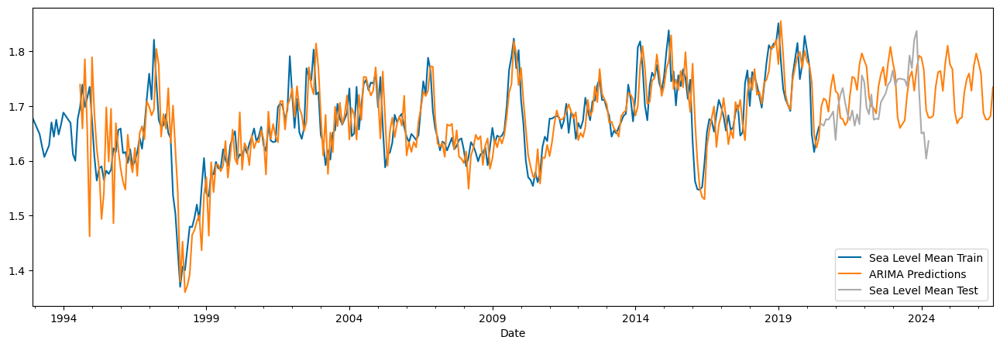

In [ ]:
y_train.plot(figsize = (16,5), legend=True, label = 'Sea Level Mean Train')
arima_pred.plot(legend = True)
y_test.plot(legend=True, label = 'Sea Level Mean Test')
plt.savefig('images/SARIMAX.png')

In [ ]:
# Model evaluation
dates = y_test.index
arima_pred_series = pd.Series(arima_pred, index=dates)

# Slice arima_pred to match the dates in y_test
arima_pred_slice = arima_pred_series.loc[y_test.index]

# Calculate RMSE
rmse_arima = mean_squared_error(y_test, arima_pred_slice, squared=False)
print(f'Root Mean Squared Error: {rmse_arima}')

mse_arima = mean_squared_error(y_test, arima_pred_slice)
print(f'Mean Squared Error: {mse_arima}')

r2_arima = r2_score(y_test, arima_pred_slice)
print(f"R-squared: {r2_arima:.6f}")

mape_arima = mean_absolute_percentage_error(y_test, arima_pred_slice)
print(f"Mean Absolute Percentage Error: {mape_arima:.2f}%")

mae_arima = mean_absolute_error(y_test, arima_pred_slice)
print(f"Mean Absolute Error: {mae_arima:.2f}%")

Root Mean Squared Error: 0.06025961198733437
Mean Squared Error: 0.003631220836864092
R-squared: -0.613987
Mean Absolute Percentage Error: 3.07%
Mean Absolute Error: 0.05%


In [ ]:
# Model evaluation
dates = y_train['1994-08-01':].index
arima_pred_series = pd.Series(arima_pred, index=dates)

# Slice arima_pred to match the dates in y_test
arima_pred_slice = arima_pred_series.loc[dates]

# Calculate RMSE
rmse_arima = mean_squared_error(y_train['1994-08-01':], arima_pred_slice, squared=False)
print(f'Root Mean Squared Error: {rmse_arima}')

mse_arima = mean_squared_error(y_train['1994-08-01':], arima_pred_slice)
print(f'Mean Squared Error: {mse_arima}')

r2_arima = r2_score(y_train['1994-08-01':], arima_pred_slice)
print(f"R-squared: {r2_arima:.6f}")

mape_arima = mean_absolute_percentage_error(y_train['1994-08-01':], arima_pred_slice)
print(f"Mean Absolute Percentage Error: {mape_arima:.2f}%")

mae_arima = mean_absolute_error(y_train['1994-08-01':], arima_pred_slice)
print(f"Mean Absolute Error: {mae_arima:.2f}%")

Root Mean Squared Error: 0.04840811946279552
Mean Squared Error: 0.0023433460299242823
R-squared: 0.602028
Mean Absolute Percentage Error: 2.13%
Mean Absolute Error: 0.04%


In [ ]:
y_test2 = y_test
y_test2['ARIMA_Predictions'] = arima_pred

Average RMSE: 0.12283655281766041
Average MSE: 0.017258889698383035
Average R-squared: -4.5962313207926195
Average MAPE: 6.30638127157321%
Average MAE: 0.10552115717182019


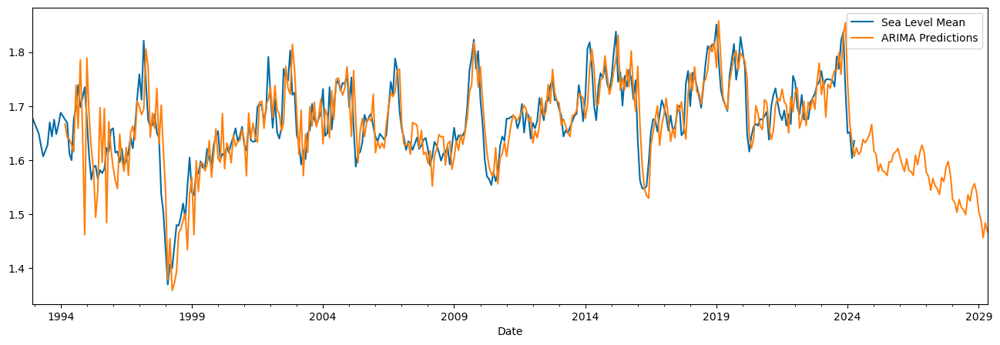

In [ ]:
X = kiribati.drop(columns=['Sea_Level_Mean'])
y = kiribati['Sea_Level_Mean']

# Time series cross-validation setup
tscv = TimeSeriesSplit(n_splits=9)
rmse_scores = []
mse_scores = []
r2_scores = []
mape_scores = []
mae_scores = []

for train_index, test_index in tscv.split(y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Fit the ARIMA model
    arima_model = SARIMAX(y_train, order=(2, 1, 1), seasonal_order=(6, 2, 3, 12))
    arima_result = arima_model.fit(disp=False)

    # Predict
    arima_pred = arima_result.predict(start=len(y_train), end=len(y_train) + len(y_test) - 1, typ='levels')

    # Model evaluation
    rmse_arima = mean_squared_error(y_test, arima_pred, squared=False)
    mse_arima = mean_squared_error(y_test, arima_pred)
    r2_arima = r2_score(y_test, arima_pred)
    mape_arima = mean_absolute_percentage_error(y_test, arima_pred)
    mae_arima = mean_absolute_error(y_test, arima_pred)

    rmse_scores.append(rmse_arima)
    mse_scores.append(mse_arima)
    r2_scores.append(r2_arima)
    mape_scores.append(mape_arima)
    mae_scores.append(mae_arima)

# Print average scores
print(f'Average RMSE: {np.mean(rmse_scores)}')
print(f'Average MSE: {np.mean(mse_scores)}')
print(f'Average R-squared: {np.mean(r2_scores)}')
print(f'Average MAPE: {np.mean(mape_scores)}%')
print(f'Average MAE: {np.mean(mae_scores)}')

# Final model fitting on entire data
arima_model_final = SARIMAX(y, order=(2, 1, 1), seasonal_order=(6, 2, 3, 12))
arima_result_final = arima_model_final.fit(disp=False)

# Plotting the final fit
arima_pred_final = arima_result_final.predict(start=15, end=len(y_train) + len(y_test) + 60, typ='levels')
y.plot(figsize=(16, 5), legend=True, label='Sea Level Mean')
arima_pred_final.plot(legend=True, label='ARIMA Predictions')
plt.savefig('images/SARIMAX.png')

#### LSTM

In [ ]:
X = kiribati
y = kiribati['Sea_Level_Mean']
y_train, y_test = temporal_train_test_split(y, test_size=46)
X_train, X_test = temporal_train_test_split(X, test_size=46)

In [ ]:
scaler = MinMaxScaler()
scaler.fit(X_train)
scaler_test = MinMaxScaler()
scaler_test.fit(X_test)
scaled_train_data = scaler.transform(X_train)
scaled_test_data = scaler.transform(X_test)

In [ ]:
timesteps = 12  # Number of time steps to use in each sequence
features = scaled_train_data.shape[1]

# Create sequences using TimeseriesGenerator
generator = TimeseriesGenerator(scaled_train_data, scaled_train_data,
                                length=timesteps, batch_size=32)

In [ ]:
# Define the model
model = Sequential()
model.add(LSTM(200, activation='relu', input_shape=(timesteps, features)))
model.add(Dense(features))

model.compile(optimizer='adam', loss='mean_squared_error')

In [ ]:
history = model.fit(generator, epochs=245, verbose=1)

Epoch 1/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.2027
Epoch 2/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0488 
Epoch 3/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0323
Epoch 4/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0243
Epoch 5/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0280
Epoch 6/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0252
Epoch 7/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0222
Epoch 8/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0222
Epoch 9/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0240
Epoch 10/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0221
Epoch 11/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0213
Epoch 12/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0211
Epoch 13/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0205
Epoch 14/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0219
Epoch 15/245
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0205
E

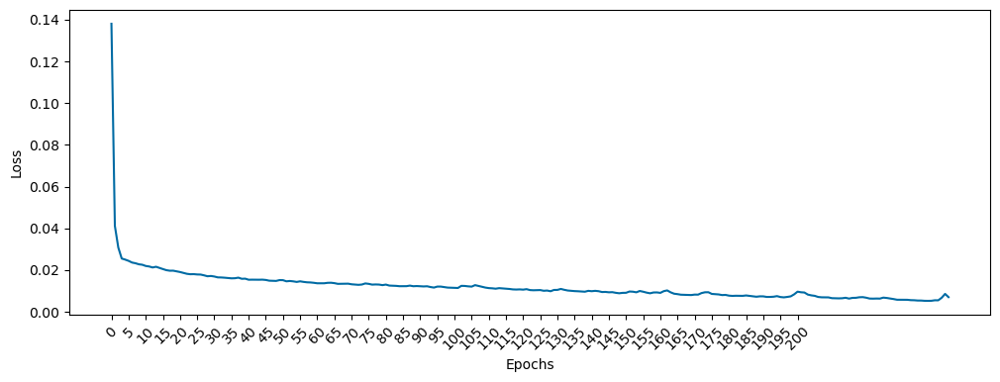

In [ ]:
losses_lstm = history.history['loss']
plt.figure(figsize=(12,4))
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.xticks(np.arange(0,201,5), rotation = 45)
plt.plot(range(len(losses_lstm)),losses_lstm);

In [ ]:
# Perform predictions
training_predictions, test_predictions = predict_all_data(scaled_train_data, scaled_test_data, model, timesteps, features, scaler)
future_forecast = predict_future_values(scaled_train_data, model, timesteps, features, forecast_length=60, scaler = scaler)

# Create date ranges for training, test, and forecast data
train_dates = pd.date_range(start=X.index[0], periods=len(training_predictions), freq='M')
test_dates = pd.date_range(start=X.index[-len(test_predictions)], periods=len(test_predictions), freq='M')
forecast_dates = pd.date_range(start=X.index[-1] + pd.DateOffset(months=1), periods=60, freq='M')

# Convert results to DataFrames
train_predictions_df = pd.DataFrame(training_predictions, index=train_dates, columns=X.columns)
test_predictions_df = pd.DataFrame(test_predictions, index=test_dates, columns=X.columns)
future_forecast_df = pd.DataFrame(future_forecast, index=forecast_dates, columns=X.columns)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━

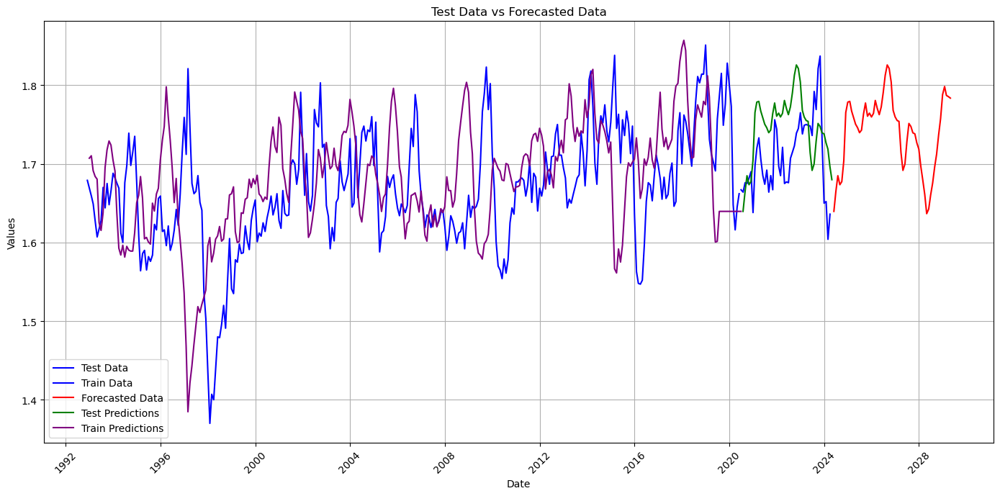

In [ ]:
test_predictions_df = pd.DataFrame(test_predictions, index=test_dates, columns=X.columns)
future_forecast_df = pd.DataFrame(future_forecast, index=forecast_dates, columns=X.columns)

# Plotting
plt.figure(figsize=(14, 7))

# Plot test data
plt.plot(X_test.index, X_test['Sea_Level_Mean'].values, label='Test Data', color='blue')
plt.plot(X_train.index, X_train['Sea_Level_Mean'].values, label='Train Data', color='blue')

# Plot forecast data
plt.plot(future_forecast_df.index, future_forecast_df['Sea_Level_Mean'].values, label='Forecasted Data', color='red')
plt.plot(test_predictions_df.index, test_predictions_df['Sea_Level_Mean'].values, label='Test Predictions', color='green')
plt.plot(train_predictions_df.index, train_predictions_df['Sea_Level_Mean'].values, label='Train Predictions', color='purple')

plt.title('Test Data vs Forecasted Data')
plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

In [ ]:
# Calculate RMSE
rmse_lstm = mean_squared_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values, squared=False)
print(f'Root Mean Squared Error: {rmse_lstm}')

mse_lstm = mean_squared_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f'Mean Squared Error: {mse_lstm}')

r2_lstm = r2_score(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f"R-squared: {r2_lstm:.6f}")

mape_lstm = mean_absolute_percentage_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Percentage Error: {mape_lstm:.2f}%")

mae_lstm = mean_absolute_error(X_test['Sea_Level_Mean'].values, test_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Error: {mae_lstm:.2f}%")

Root Mean Squared Error: 0.0644343276759336
Mean Squared Error: 0.004151782583049582
R-squared: -0.845364
Mean Absolute Percentage Error: 3.19%
Mean Absolute Error: 0.05%


Training Evaluation

In [ ]:
# Calculate RMSE
rmse_lstm = mean_squared_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values, squared=False)
print(f'Root Mean Squared Error: {rmse_lstm}')

mse_lstm = mean_squared_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f'Mean Squared Error: {mse_lstm}')

r2_lstm = r2_score(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f"R-squared: {r2_lstm:.6f}")

mape_lstm = mean_absolute_percentage_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Percentage Error: {mape_lstm:.2f}%")

mae_lstm = mean_absolute_error(X_train['Sea_Level_Mean'].values, train_predictions_df['Sea_Level_Mean'].values)
print(f"Mean Absolute Error: {mae_lstm:.2f}%")

Root Mean Squared Error: 0.09322596683982366
Mean Squared Error: 0.008691080893219901
R-squared: -0.554654
Mean Absolute Percentage Error: 4.34%
Mean Absolute Error: 0.07%


In [ ]:
from scikeras.wrappers import KerasRegressor
from sklearn.model_selection import GridSearchCV

# Example data, replace 'kiribati' with your actual dataset
X = kiribati
y = kiribati['Sea_Level_Mean']

# Train-test split
y_train, y_test = temporal_train_test_split(y, test_size=46)
X_train, X_test = temporal_train_test_split(X, test_size=46)

# Scaling data
scaler = MinMaxScaler()
scaler.fit(X_train)
scaler_test = MinMaxScaler()
scaler_test.fit(X_test)
scaled_train_data = scaler.transform(X_train)
scaled_test_data = scaler.transform(X_test)

# Create sequences using TimeseriesGenerator
timesteps = 12  # Number of time steps to use in each sequence
features = scaled_train_data.shape[1]

generator = TimeseriesGenerator(scaled_train_data, scaled_train_data,
                                length=timesteps, batch_size=32)

# Reshape input data to be 3D (samples, timesteps, features)
def reshape_data(X, timesteps, features):
    # Calculate the number of samples that can be formed with the given timesteps
    num_samples = X.shape[0] - timesteps

    # Initialize an array to hold the reshaped data
    reshaped_data = np.zeros((num_samples, timesteps, features))

    # Populate the reshaped data with sequences
    for i in range(num_samples):
        reshaped_data[i] = X[i:i+timesteps]

    return reshaped_data

# Update create_model to match input shape
def create_model(units=50, activation='relu', optimizer='adam'):
    model = Sequential()
    model.add(LSTM(units, activation=activation, input_shape=(timesteps, features)))
    model.add(Dense(features))
    model.compile(optimizer=optimizer, loss='mean_squared_error')
    return model

# Wrap the model using KerasRegressor
model = KerasRegressor(build_fn=create_model, verbose=0)

# Define the grid of hyperparameters to search
param_grid = {
    'model__units': [50, 100, 200],
    'model__activation': ['relu', 'tanh'],
    'batch_size': [32, 64],
    'epochs': [10, 50],
    'model__optimizer': ['adam', 'rmsprop']
}

# Use TimeSeriesSplit for time series cross-validation
tscv = TimeSeriesSplit(n_splits=3)

# Apply GridSearchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=tscv, scoring='neg_root_mean_squared_error', error_score='raise')

# Fit model using reshaped data
X_reshaped = reshape_data(scaled_train_data, timesteps, features)
y_reshaped = scaled_train_data[timesteps:]  # Adjust target variable

grid_result = grid.fit(X_reshaped, y_reshaped)

# Print the best score and the best parameters
print(f"Best: {grid_result.best_score_} using {grid_result.best_params_}")

# Train the model using the best parameters
best_model = grid_result.best_estimator_.model
history = best_model.fit(generator, epochs=245, verbose=1)
losses_lstm = history.history['loss']

# Plotting the loss over epochs
plt.figure(figsize=(12,4))
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.xticks(np.arange(0, 246, 5), rotation = 45)
plt.plot(range(len(losses_lstm)), losses_lstm)
plt.show()

# Perform predictions
training_predictions, test_predictions = predict_all_data(scaled_train_data, scaled_test_data, best_model, timesteps, features, scaler)
future_forecast = predict_future_values(scaled_train_data, best_model, timesteps, features, forecast_length=60, scaler=scaler)

# Create date ranges for training, test, and forecast data
train_dates = pd.date_range(start=X.index[0], periods=len(training_predictions), freq='M')
test_dates = pd.date_range(start=X.index[-len(test_predictions)], periods=len(test_predictions), freq='M')
forecast_dates = pd.date_range(start=X.index[-1] + pd.DateOffset(months=1), periods=60, freq='M')

# Convert results to DataFrames
train_predictions_df = pd.DataFrame(training_predictions, index=train_dates, columns=X.columns)
test_predictions_df = pd.DataFrame(test_predictions, index=test_dates, columns=X.columns)
future_forecast_df = pd.DataFrame(future_forecast, index=forecast_dates, columns=X.columns)

# Plotting
plt.figure(figsize=(14, 7))

# Plot test data
plt.plot(X_test.index, X_test['Sea_Level_Mean'].values, label='Test Data', color='blue')
plt.plot(X_train.index, X_train['Sea_Level_Mean'].values, label='Train Data', color='blue')

# Plot forecast data
plt.plot(future_forecast_df.index, future_forecast_df['Sea_Level_Mean'].values, label='Forecasted Data', color='red')
plt.plot(test_predictions_df.index, test_predictions_df['Sea_Level_Mean'].values, label='Test Predictions', color='green')
plt.plot(train_predictions_df.index, train_predictions_df['Sea_Level_Mean'].values, label='Train Predictions', color='purple')

plt.title('Test Data vs Forecasted Data')
plt.xlabel('Date')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

ValueError: Could not interpret metric identifier: loss